### BADASS Analysis: amino acids

Can we distinguish five different amino acids from one another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Amino acids:
- Glutamate (E)
- Arginine (R)
- Serine (S)
- Valine (V)
- Tryptophan (W)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array amino acid data

In [3]:
aa_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/'
                           'AAs/Reformatted_AA_csvs/'},
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'CCPent', 'QLKEIA', 'CCHex2-I24K', 'CCHept-I24N', 'CCHept-L28W',
                            'GRP22', 'CCHex', 'NLKEIA', 'CCHept-L28K', 'CCHept-I24T', 'CCHept-L7Y',
                            'GRP35', 'CCHex2', 'CCHept-I17G-L21G', 'CCHept-I17H', 'CCHept-I24H', 'CCHept-L28Y',
                            'GRP46', 'CCHept', 'CCHept-I17A-L21A', 'CCHept-I17K-L24E', 'CCHept-L21S-I24S',
                            'CCHept-I24Y', 'GRP51', 'CCHept-I24D', 'CCHept-L14A', 'CCHept-L7K',
                            'CCHept-L21N-I24N', 'CCHept-L21S-I24Y', 'GRP52', 'CCHept-I24E', 'CCHept-L21A',
                            'CCHept-L21K-I24E', 'CCHept-L21T-I24T', 'CCHept-L21Y-I24S', 'GRP63', 'CCHept-I24K',
                            'CCHept-L21K', 'CCHept-L21E-I24K', 'CCHept-L21H-I24H', 'CCHept-I17T', 'GRP80',
                            'CCHept-I17K', 'CCPent-I24K', 'CCHept-I24S', 'CCHept-L7W', 'CCHept-I24P']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
aa_fluor_data.group_xlsx_repeats()

In [5]:
aa_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['E_repeat_1.xlsx',
                             'R_repeat_1.xlsx',
                             'S_repeat_1.xlsx',
                             'V_repeat_1.xlsx',
                             'W_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['E_repeat_2.xlsx',
                             'R_repeat_2.xlsx',
                             'S_repeat_2.xlsx',
                             'V_repeat_2.xlsx',
                             'W_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['E_repeat_3.xlsx',
                             'R_repeat_3.xlsx',
                             'S_repeat_3.xlsx',
                             'V_repeat_3.xlsx',
                             'W_repeat_3.xlsx'])])),
             ('repeat_4',
              OrderedDict([('DPH',
                     

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_1.xlsx
Drawing scatter plot of data spread for E_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

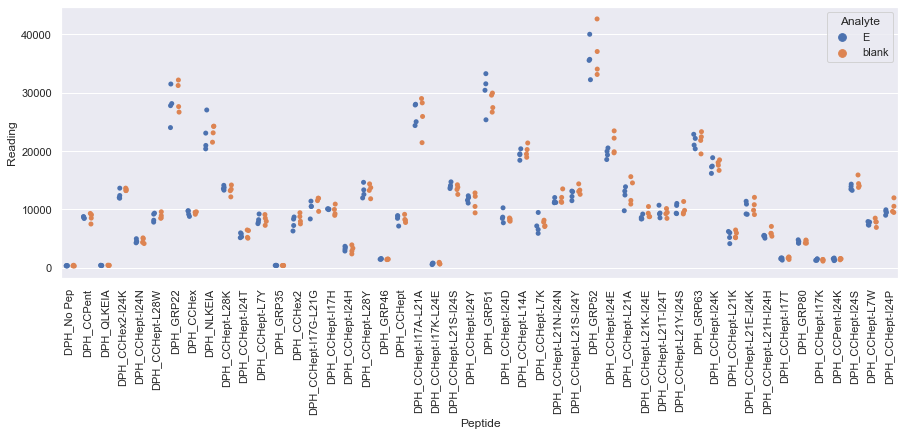

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx
Drawing scatter plot of data spread for R_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

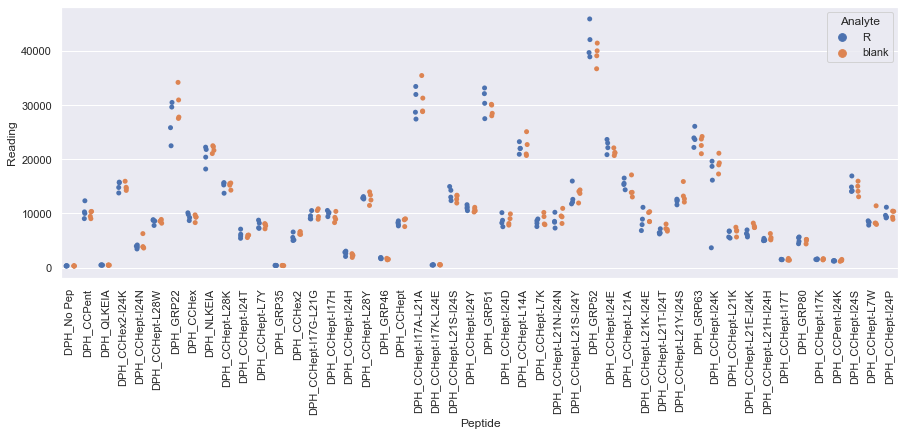

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_1.xlsx
Drawing scatter plot of data spread for S_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

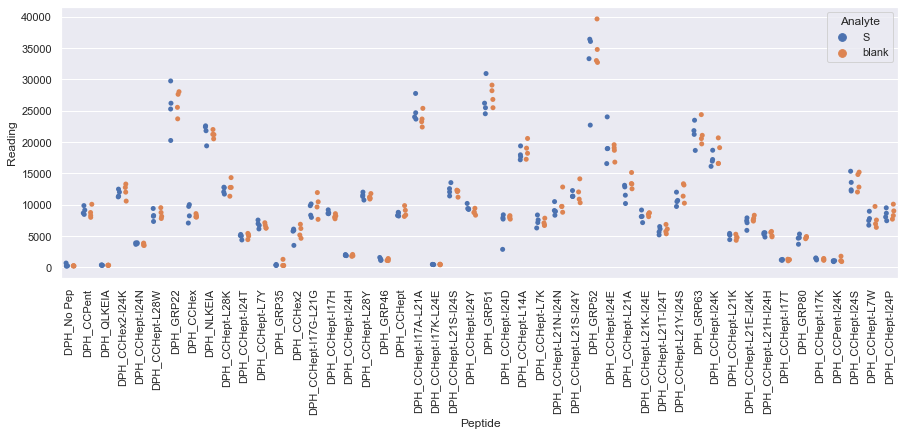

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_1.xlsx
Drawing scatter plot of data spread for V_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

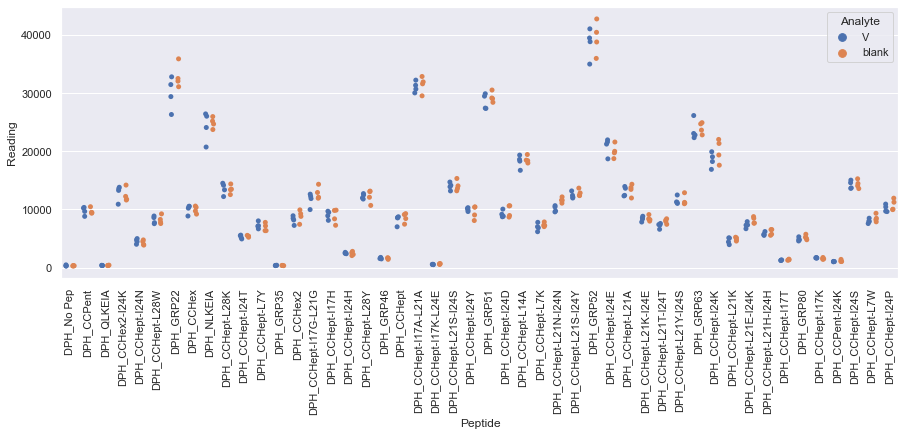

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_1.xlsx
Drawing scatter plot of data spread for W_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

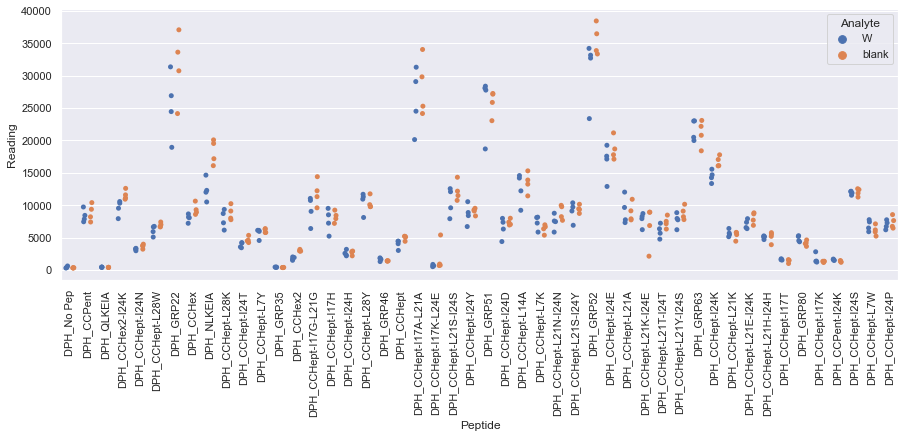

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_2.xlsx
Drawing scatter plot of data spread for E_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

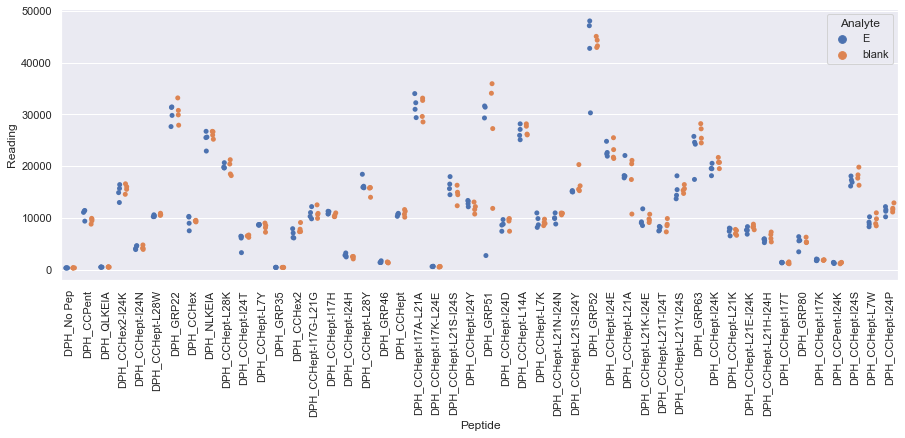

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_2.xlsx
Drawing scatter plot of data spread for R_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

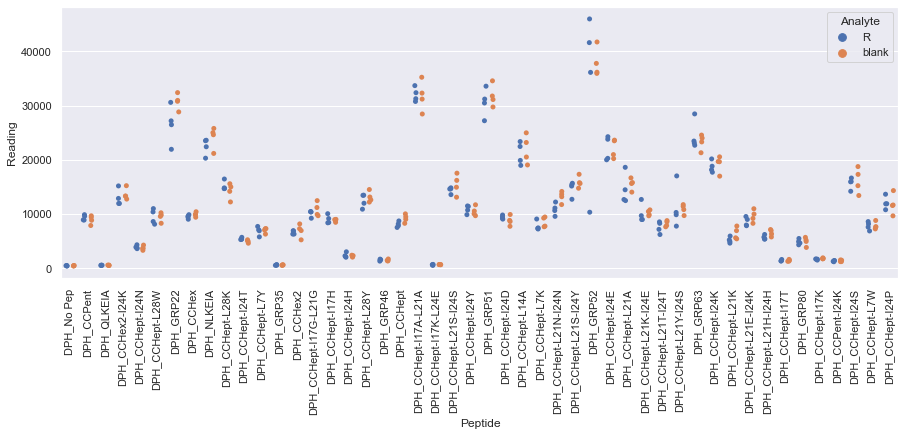

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_2.xlsx
Drawing scatter plot of data spread for S_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

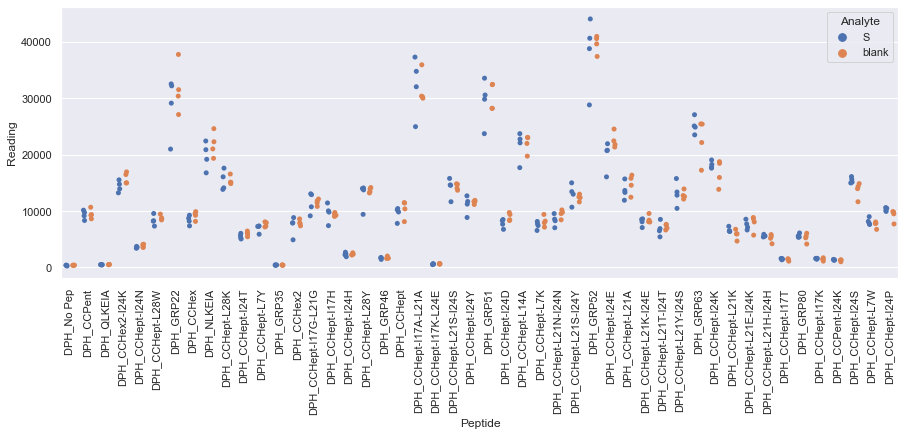

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_2.xlsx
Drawing scatter plot of data spread for V_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

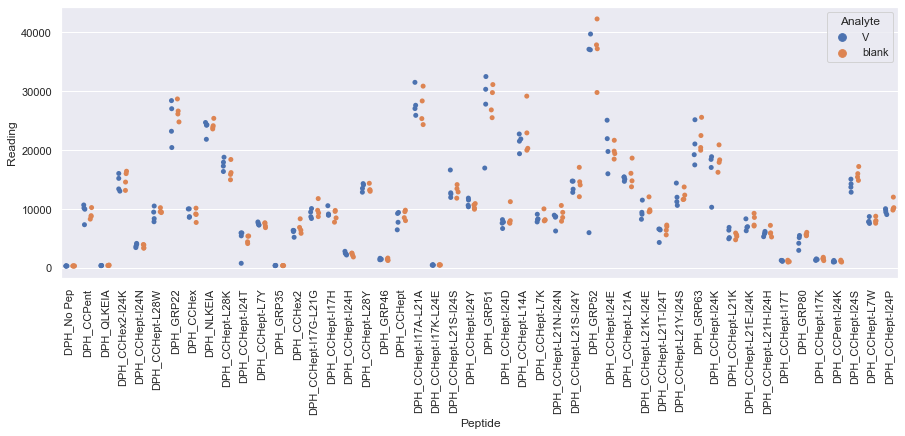

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_2.xlsx
Drawing scatter plot of data spread for W_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

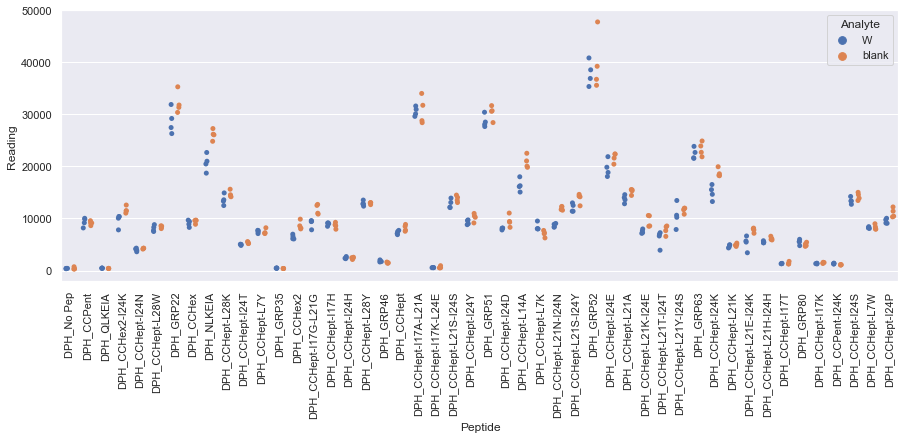

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_3.xlsx
Drawing scatter plot of data spread for E_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

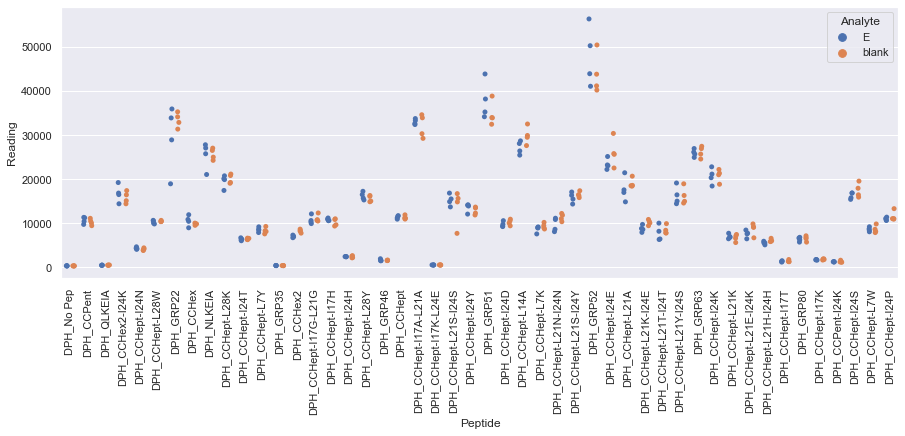

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_3.xlsx
Drawing scatter plot of data spread for R_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

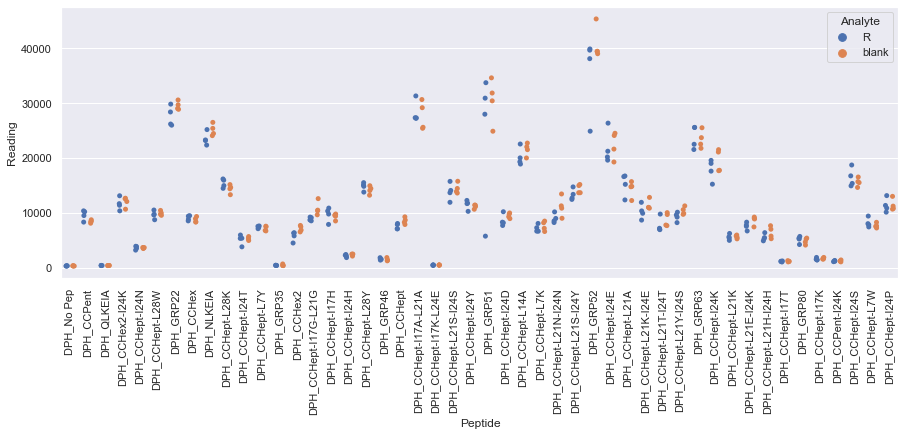

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_3.xlsx
Drawing scatter plot of data spread for S_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

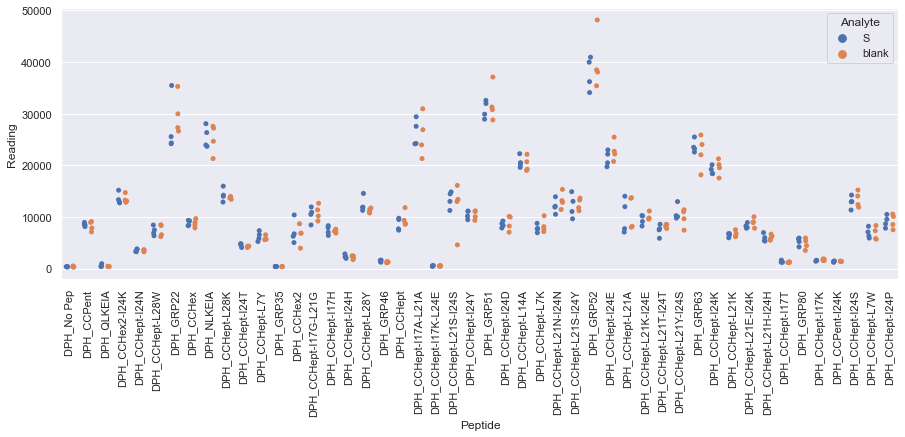

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_3.xlsx
Drawing scatter plot of data spread for V_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

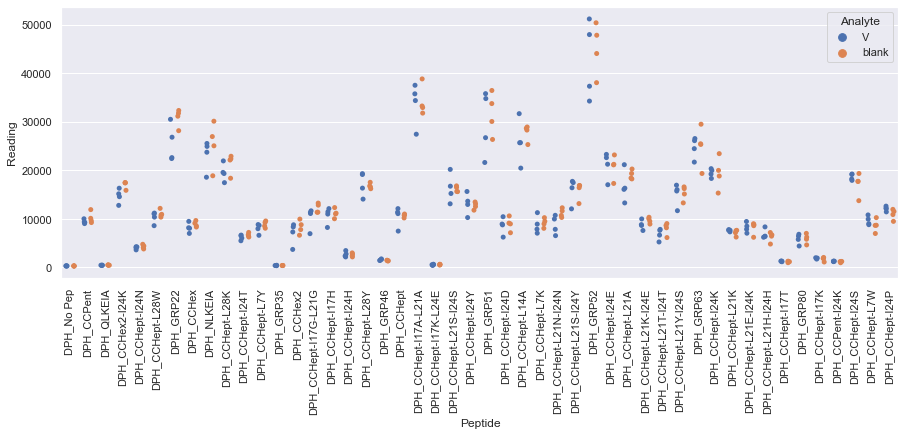

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_3.xlsx
Drawing scatter plot of data spread for W_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

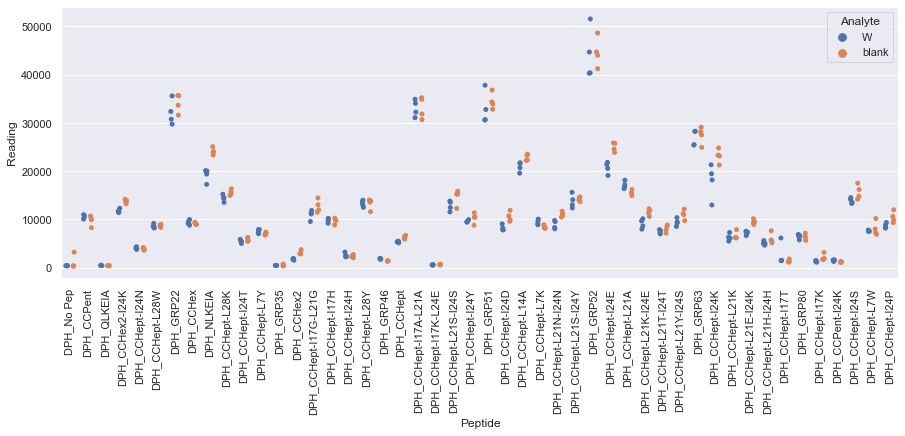

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_4.xlsx
Drawing scatter plot of data spread for E_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

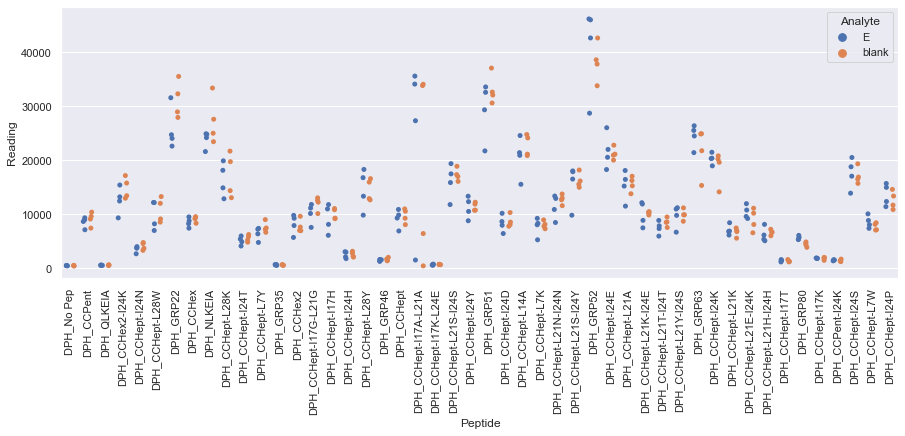

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_4.xlsx
Drawing scatter plot of data spread for R_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

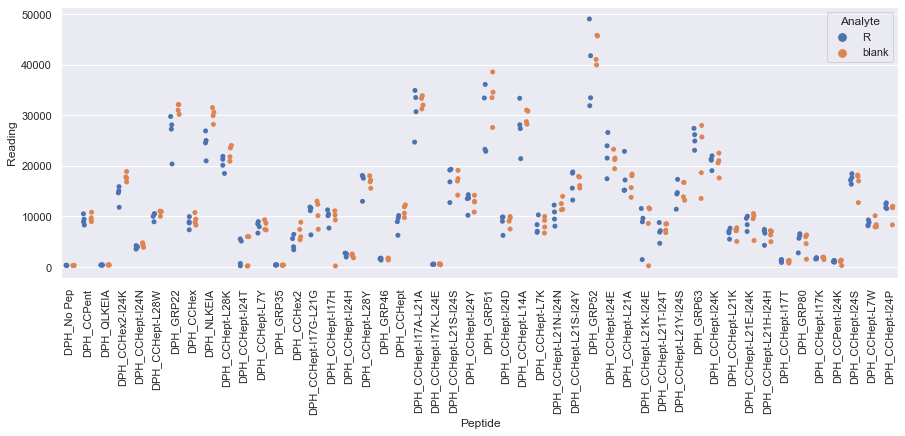

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_4.xlsx
Drawing scatter plot of data spread for S_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

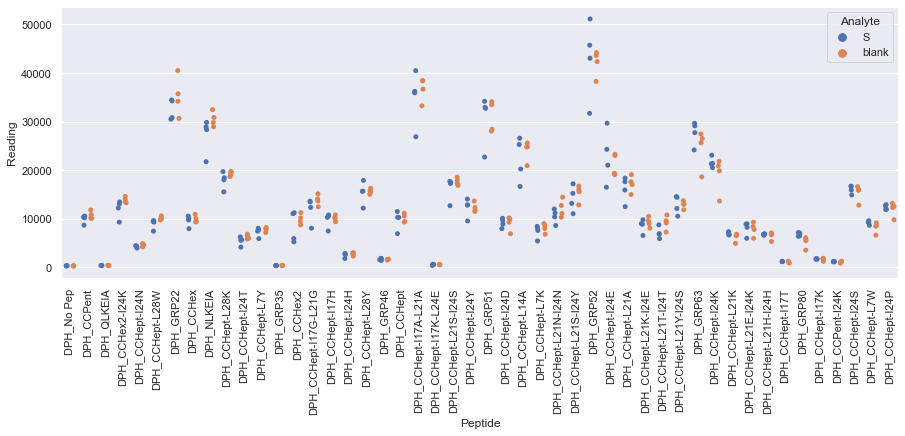

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_4.xlsx
Drawing scatter plot of data spread for V_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

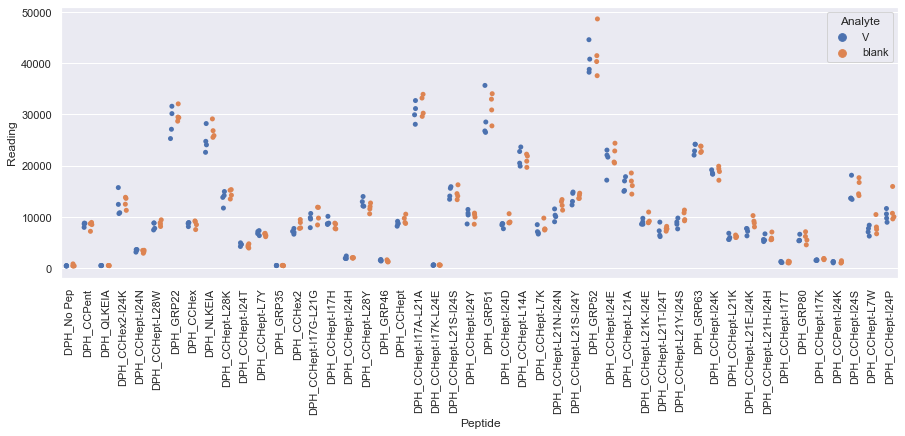

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_4.xlsx
Drawing scatter plot of data spread for W_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

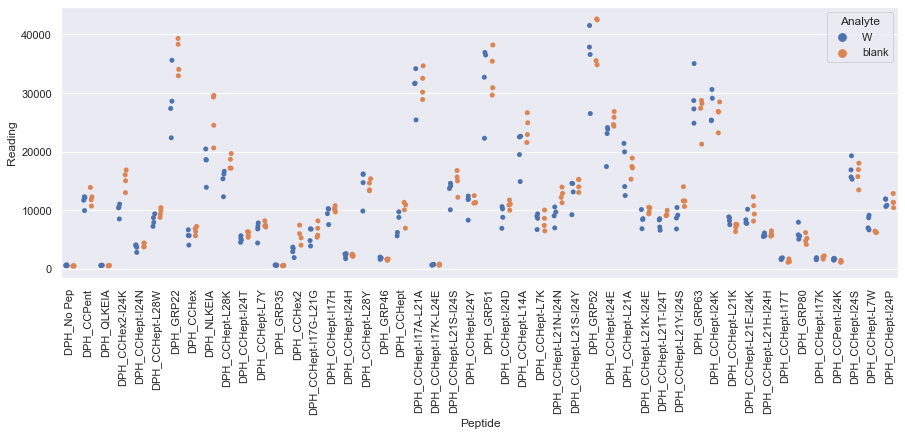

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_5.xlsx
Drawing scatter plot of data spread for E_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

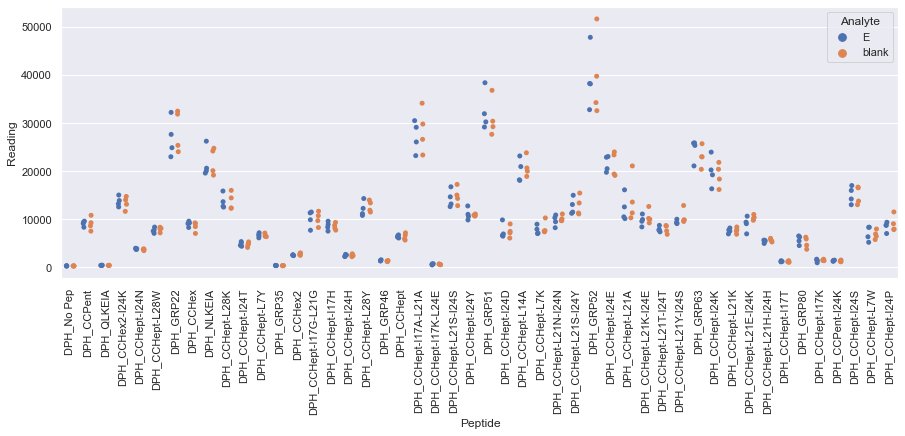

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_5.xlsx
Drawing scatter plot of data spread for R_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

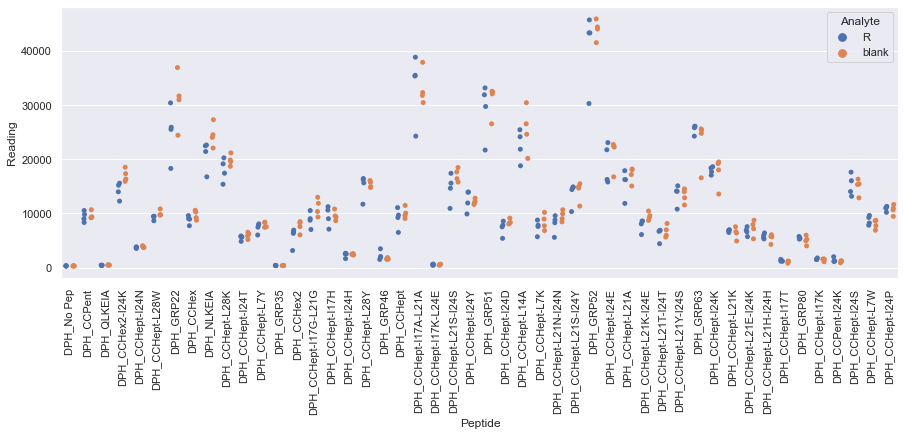

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_5.xlsx
Drawing scatter plot of data spread for S_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

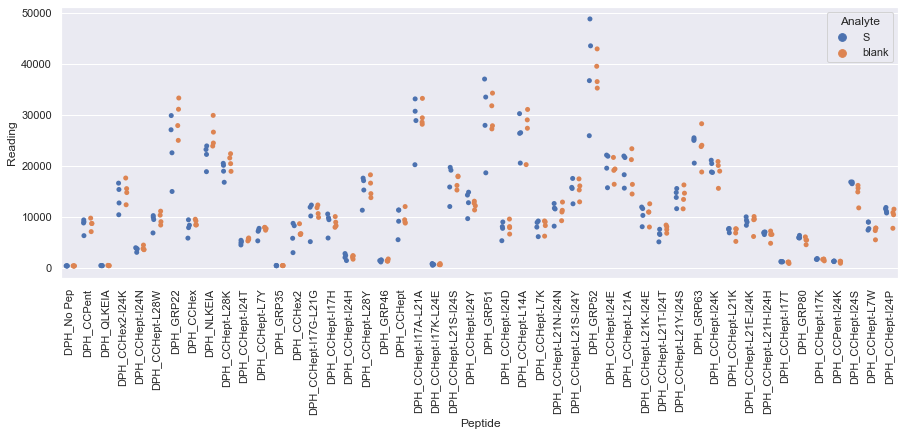

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_5.xlsx
Drawing scatter plot of data spread for V_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

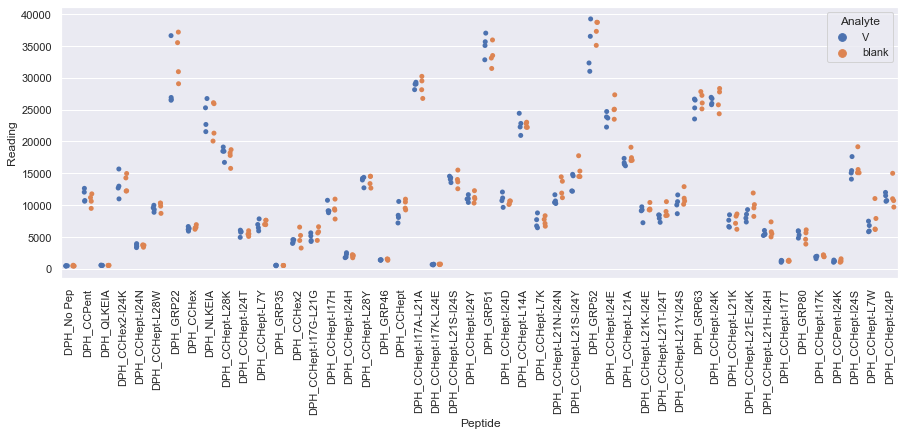

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_5.xlsx
Drawing scatter plot of data spread for W_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

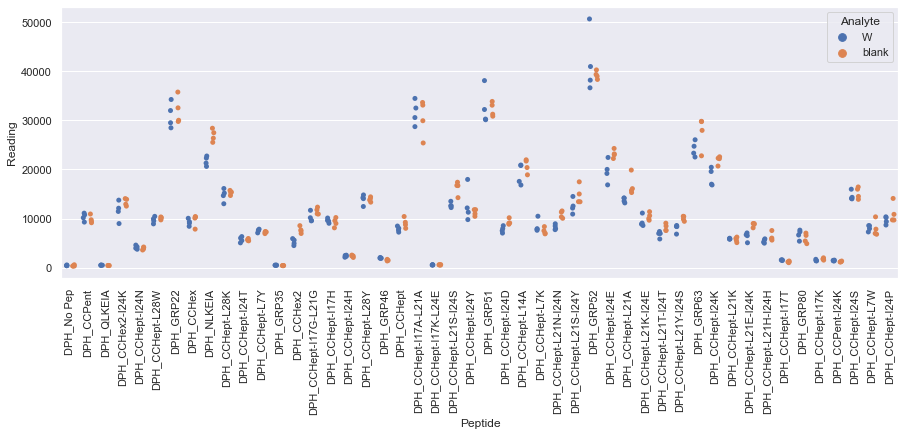

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_6.xlsx
Drawing scatter plot of data spread for E_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

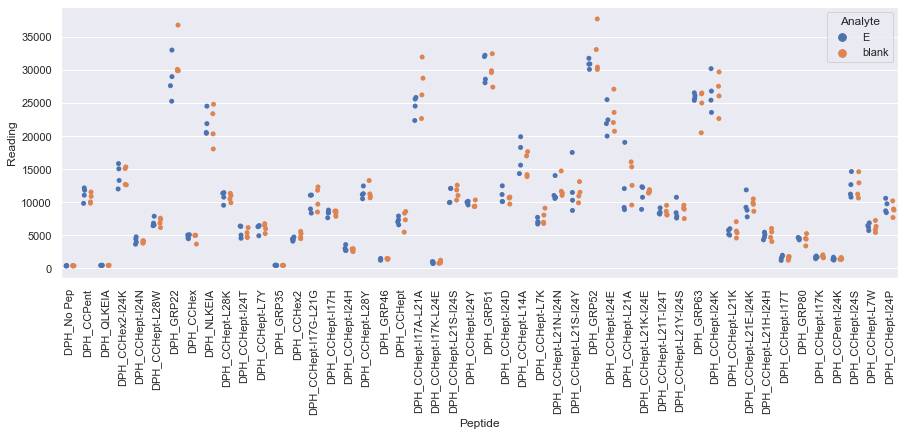

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_6.xlsx
Drawing scatter plot of data spread for R_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

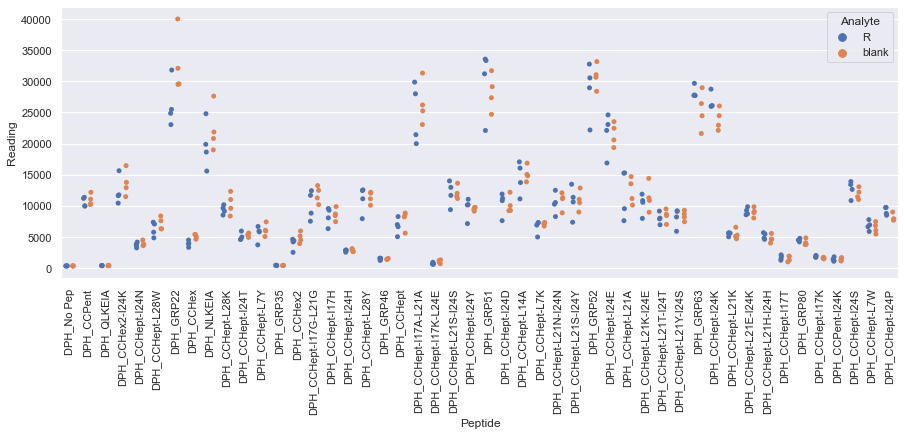

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_6.xlsx
Drawing scatter plot of data spread for S_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

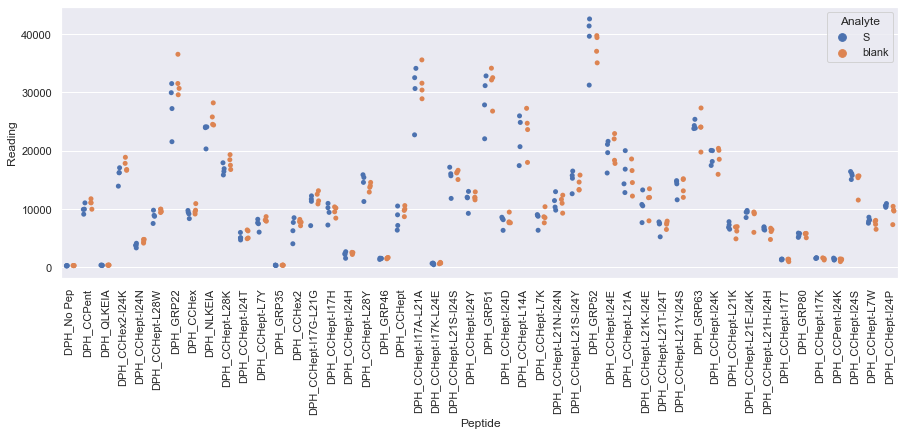

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_6.xlsx
Drawing scatter plot of data spread for V_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

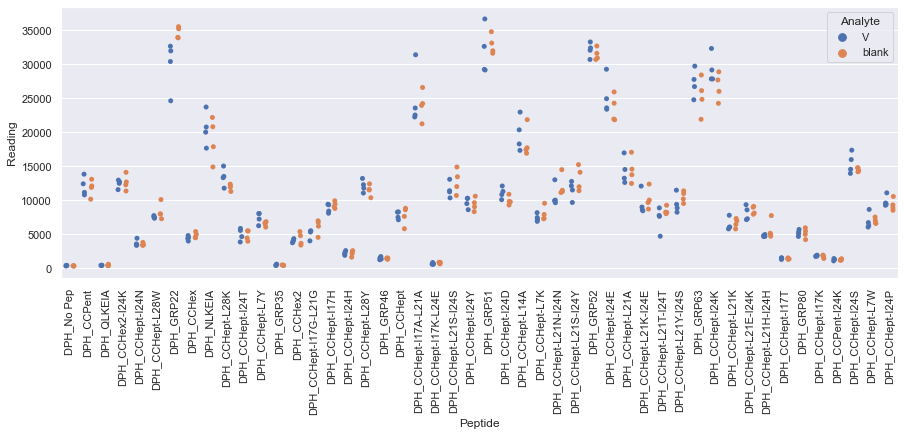

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_6.xlsx
Drawing scatter plot of data spread for W_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

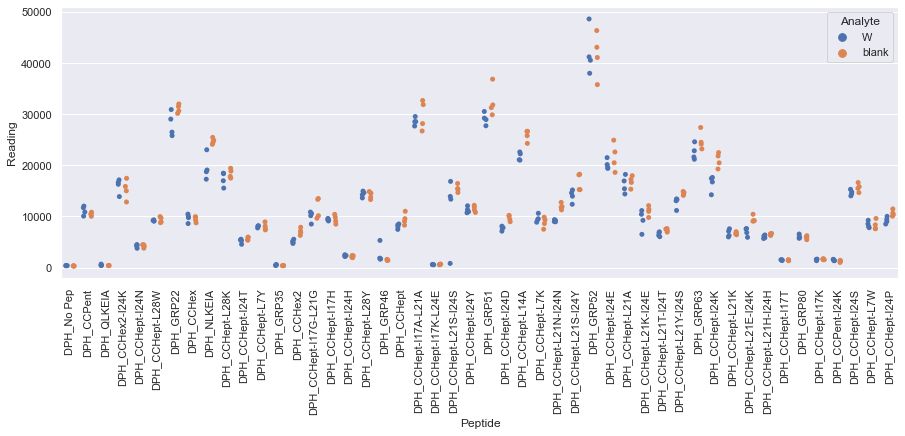

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_7.xlsx
Drawing scatter plot of data spread for E_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

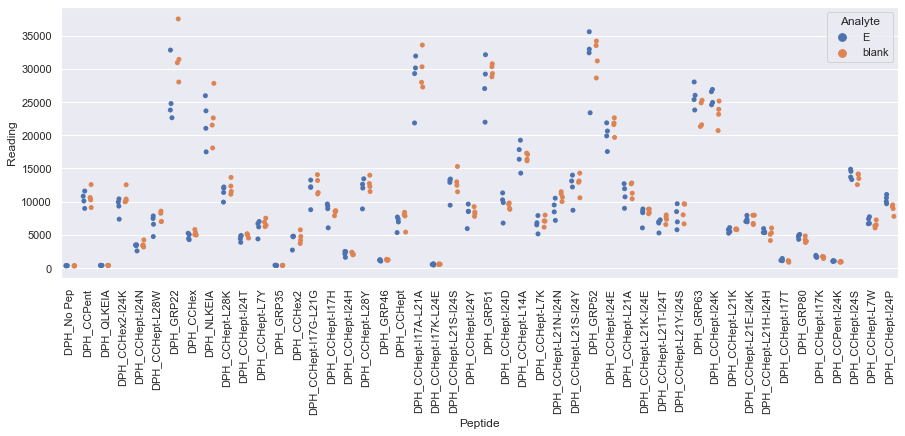

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_7.xlsx
Drawing scatter plot of data spread for R_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

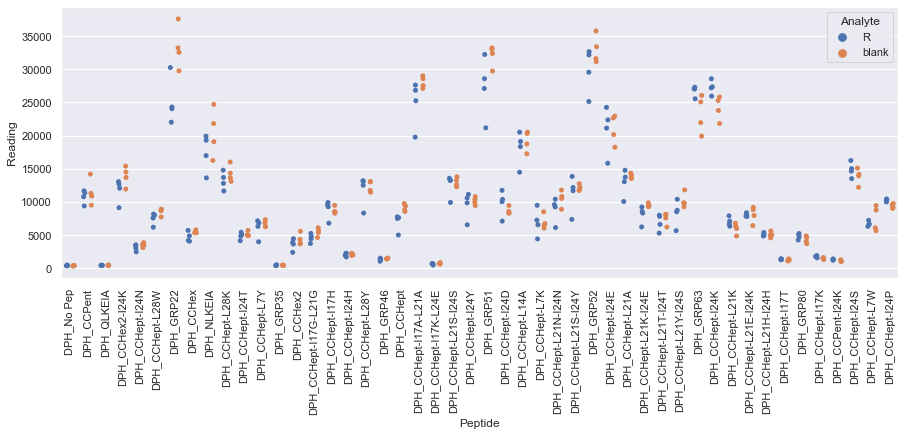

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_7.xlsx
Drawing scatter plot of data spread for S_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

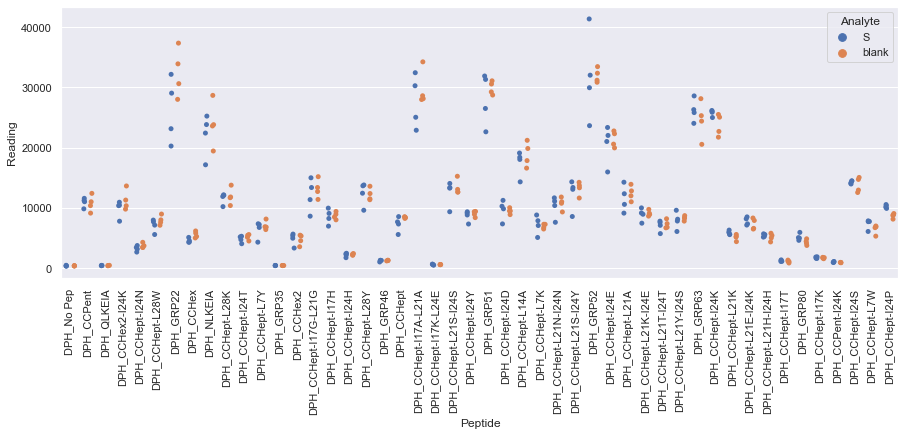

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_7.xlsx
Drawing scatter plot of data spread for V_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

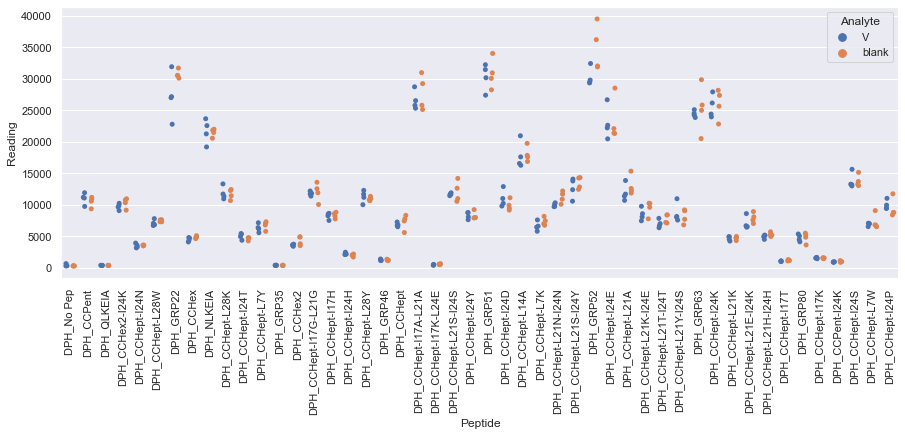

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_7.xlsx
Drawing scatter plot of data spread for W_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

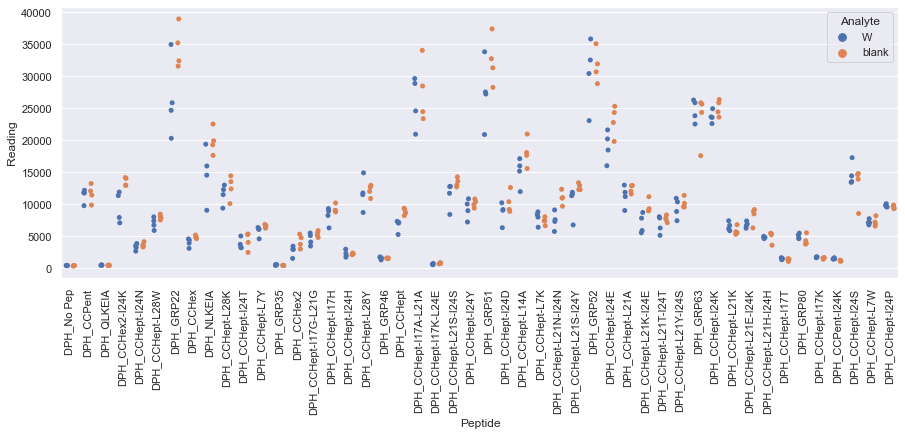

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_8.xlsx
Drawing scatter plot of data spread for E_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

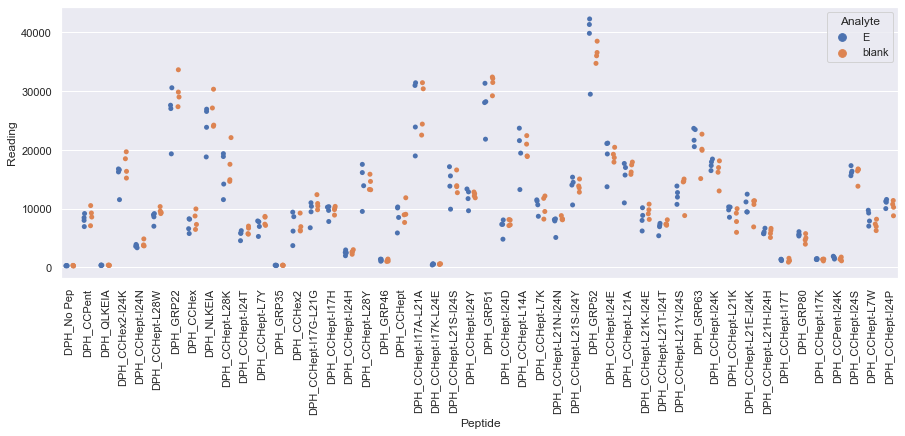

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_8.xlsx
Drawing scatter plot of data spread for R_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

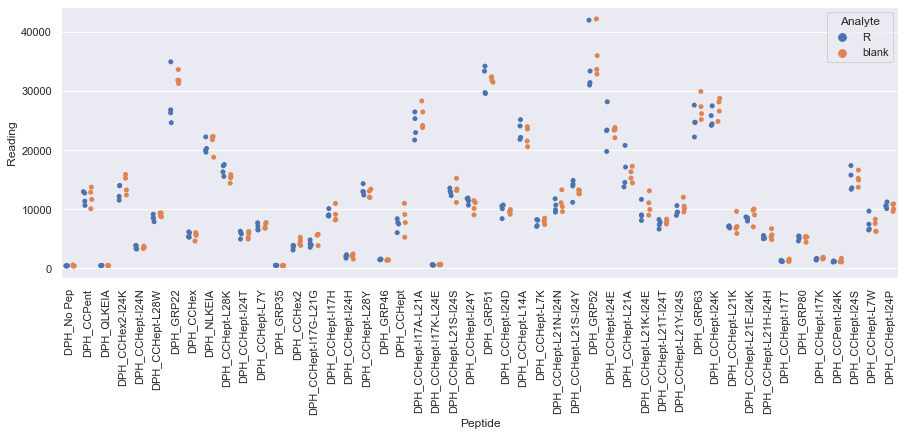

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_8.xlsx
Drawing scatter plot of data spread for S_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

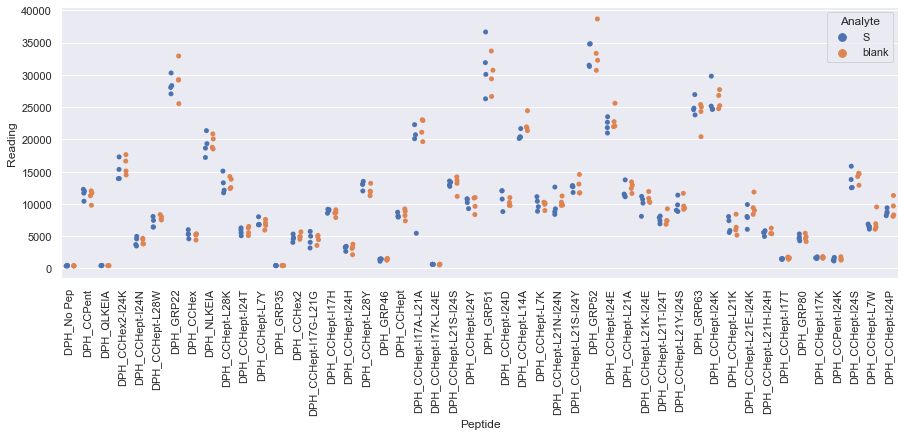

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_8.xlsx
Drawing scatter plot of data spread for V_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

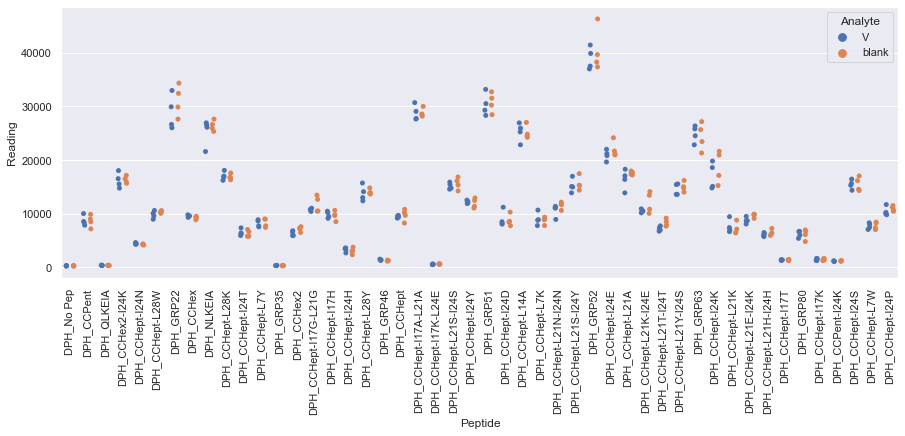

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_8.xlsx
Drawing scatter plot of data spread for W_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

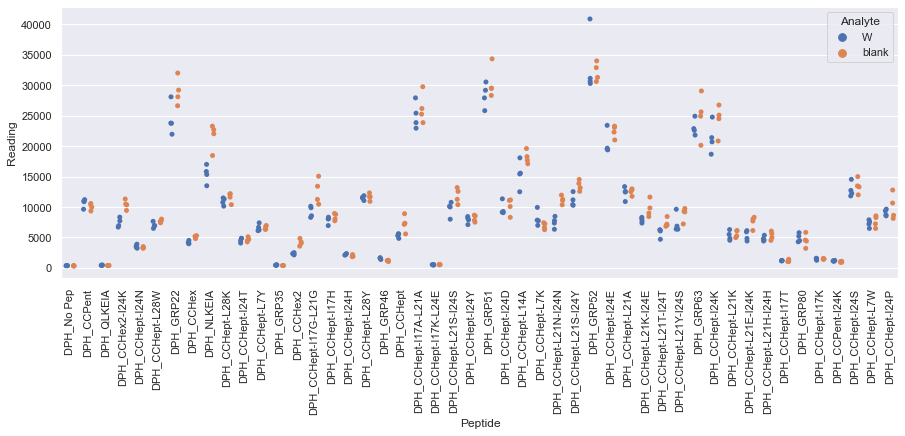

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_9.xlsx
Drawing scatter plot of data spread for E_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

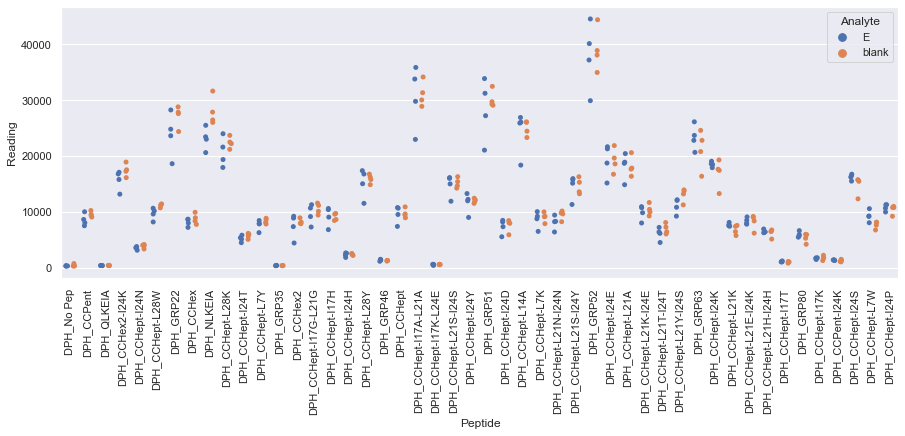

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx
Drawing scatter plot of data spread for R_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

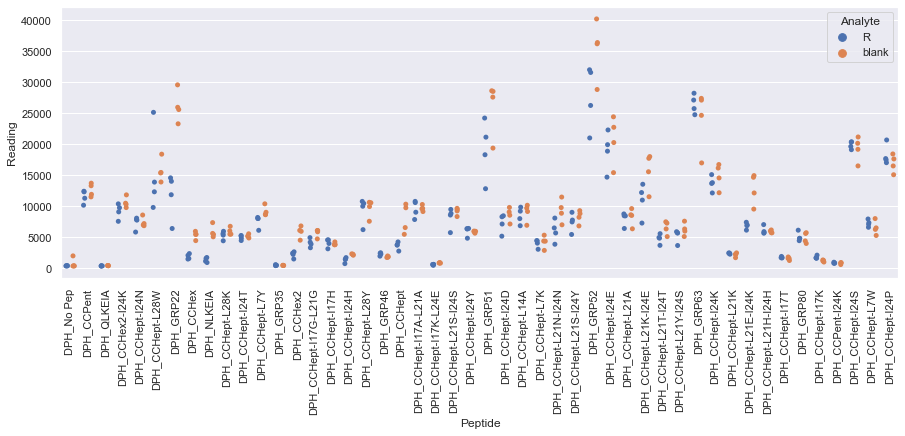

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_9.xlsx
Drawing scatter plot of data spread for S_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

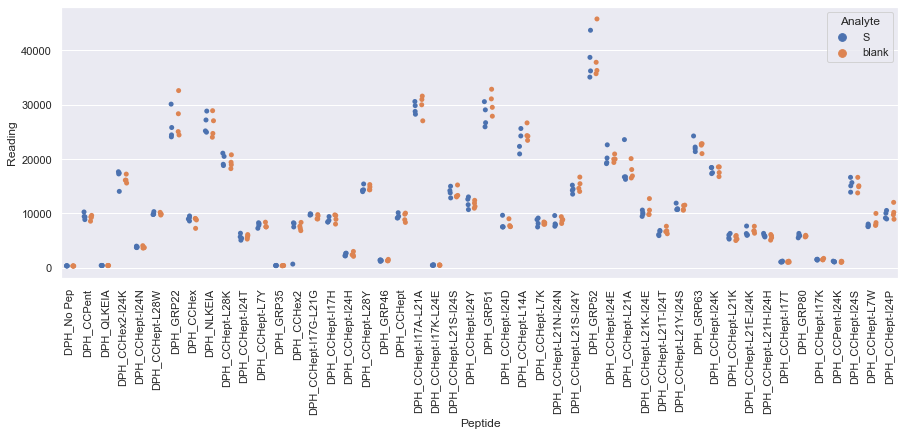

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_9.xlsx
Drawing scatter plot of data spread for V_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

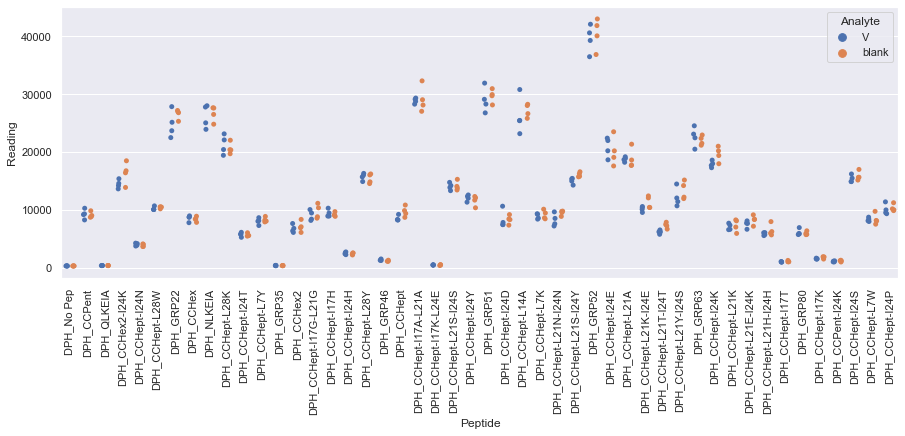

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_9.xlsx
Drawing scatter plot of data spread for W_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

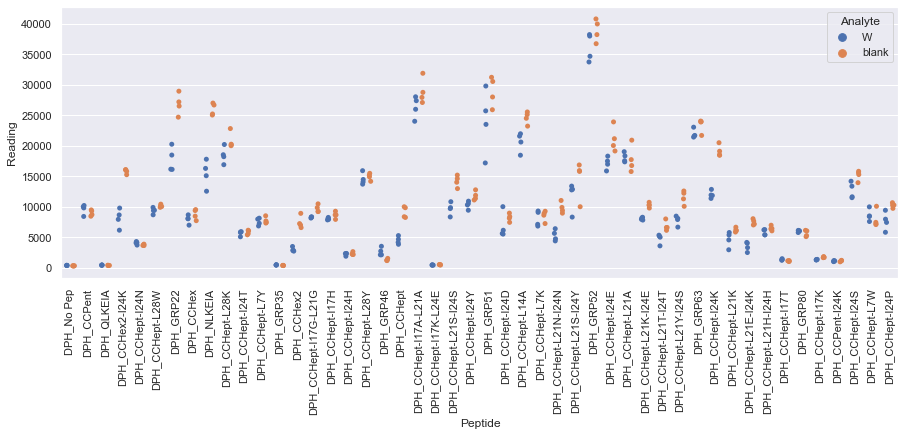

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_10.xlsx
Drawing scatter plot of data spread for E_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

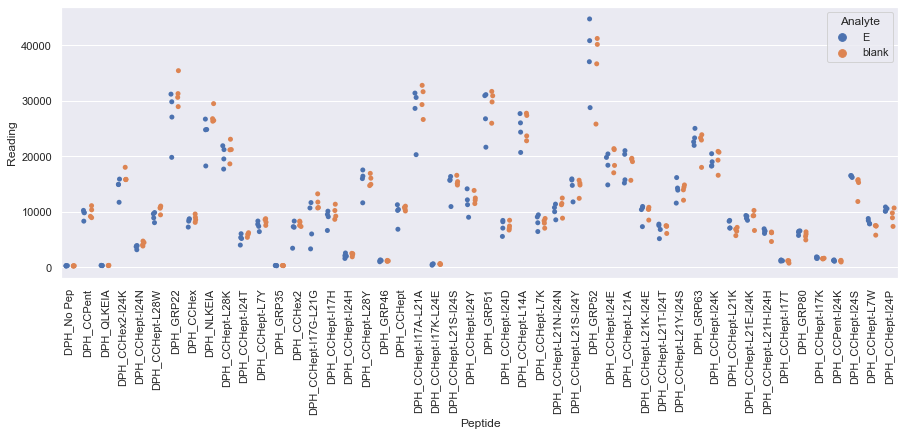

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_10.xlsx
Drawing scatter plot of data spread for R_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

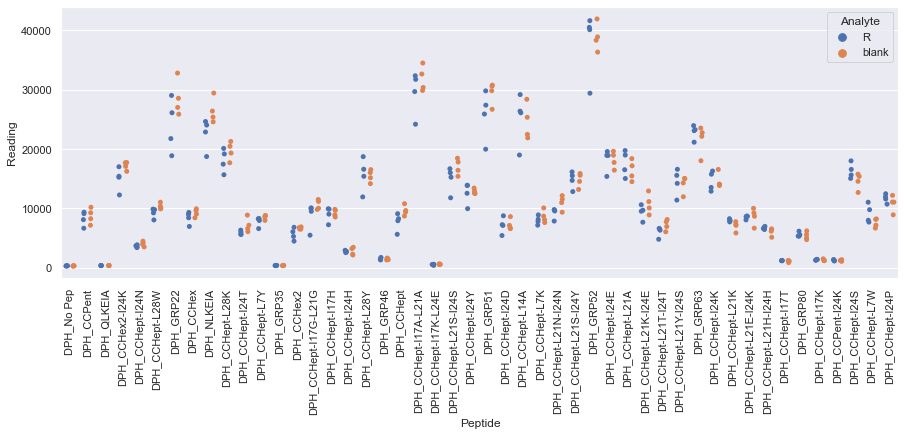

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_10.xlsx
Drawing scatter plot of data spread for S_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

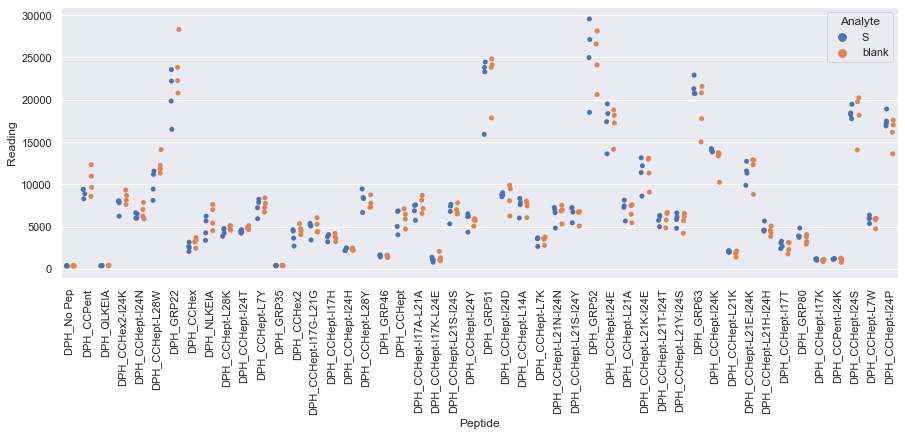

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_10.xlsx
Drawing scatter plot of data spread for V_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

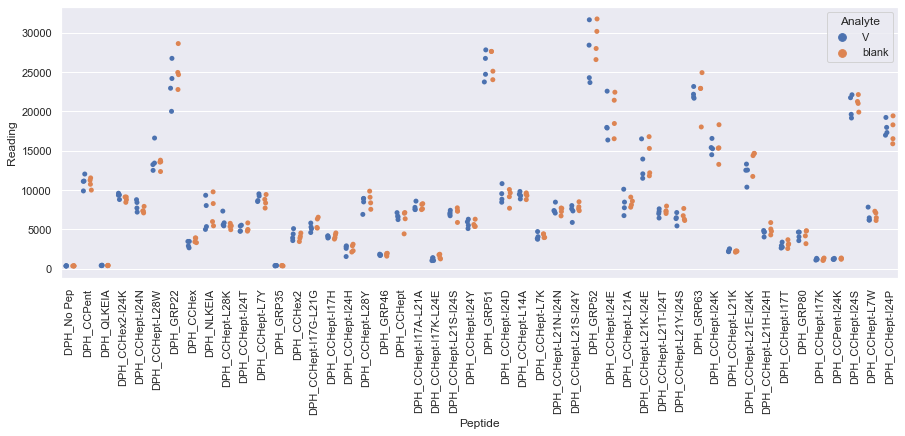

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_10.xlsx
Drawing scatter plot of data spread for W_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

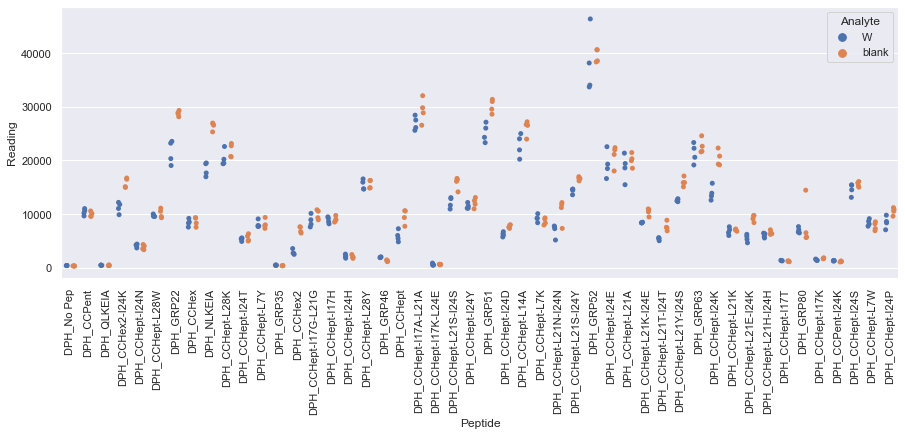

Drawing scatter plot of data spread for E_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

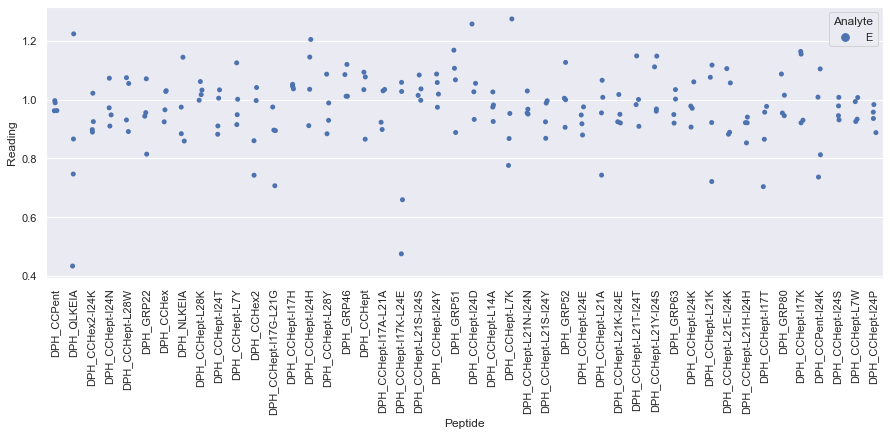

Drawing scatter plot of data spread for R_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

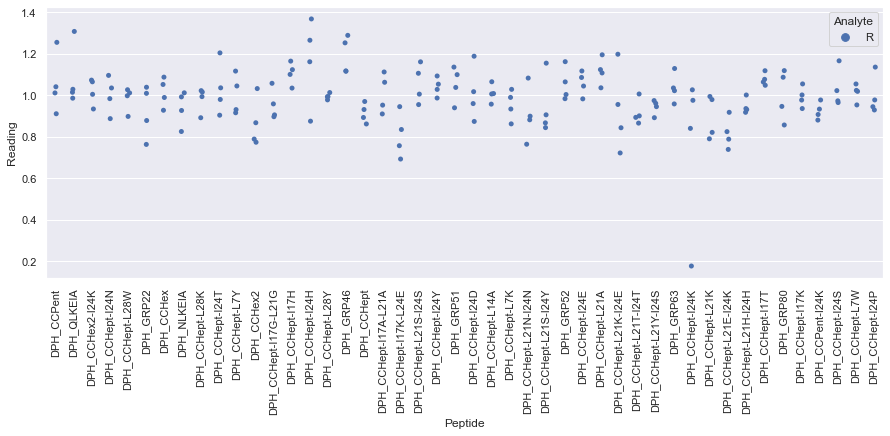

Drawing scatter plot of data spread for S_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

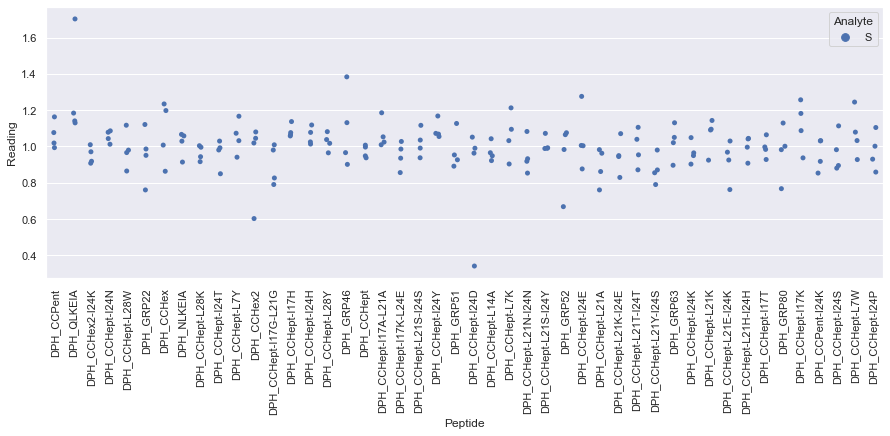

Drawing scatter plot of data spread for V_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

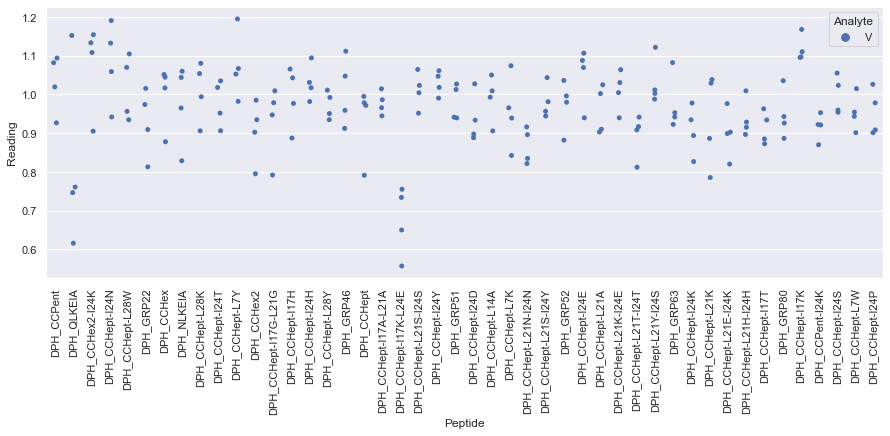

Drawing scatter plot of data spread for W_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

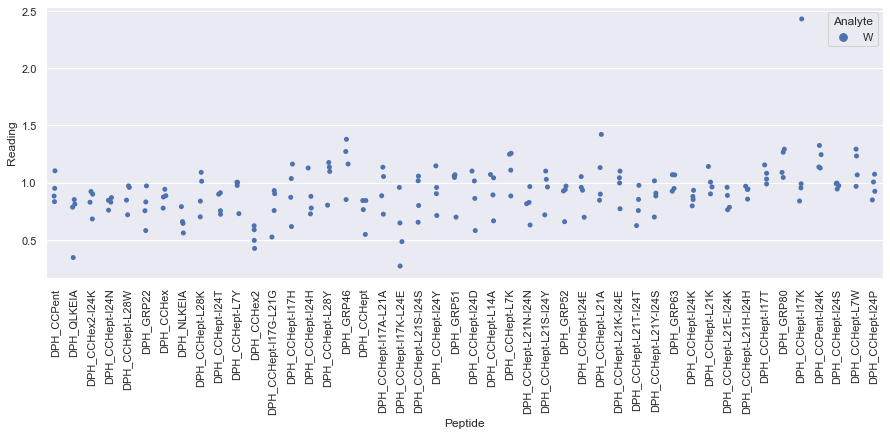

Drawing scatter plot of data spread for E_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

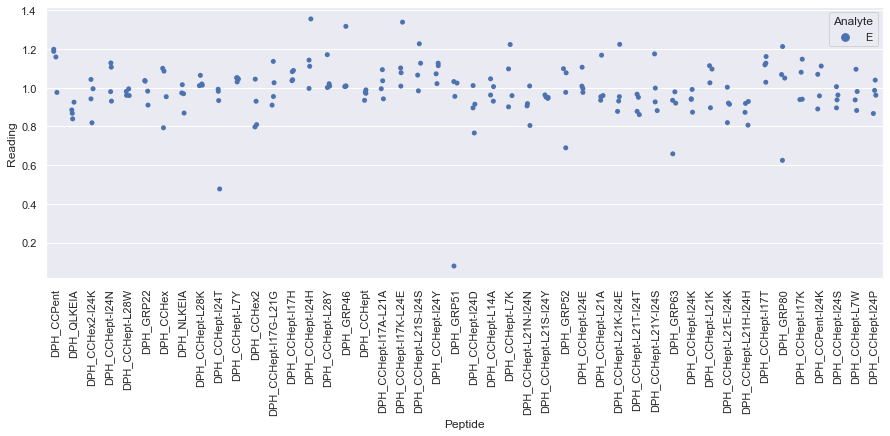

Drawing scatter plot of data spread for R_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

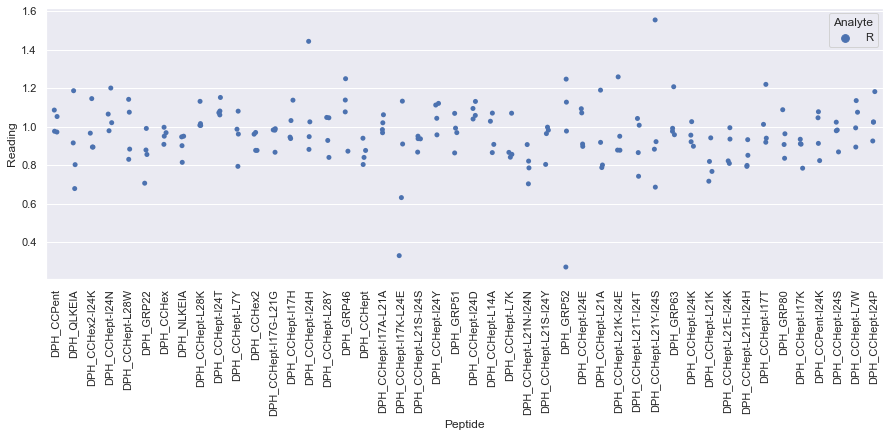

Drawing scatter plot of data spread for S_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

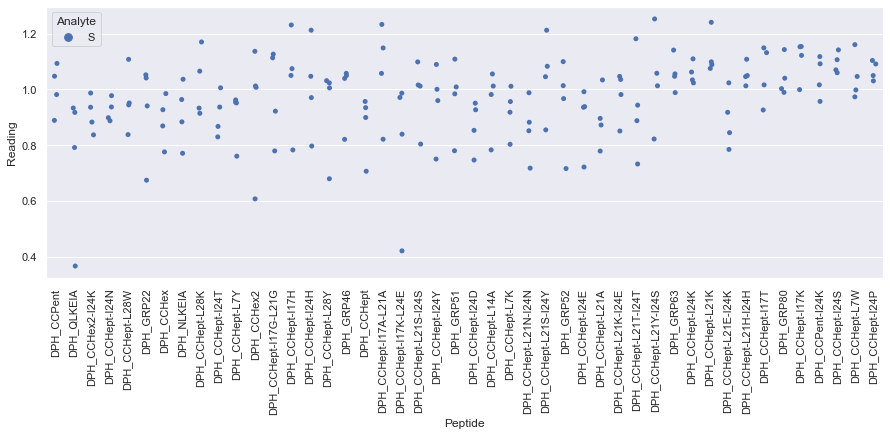

Drawing scatter plot of data spread for V_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

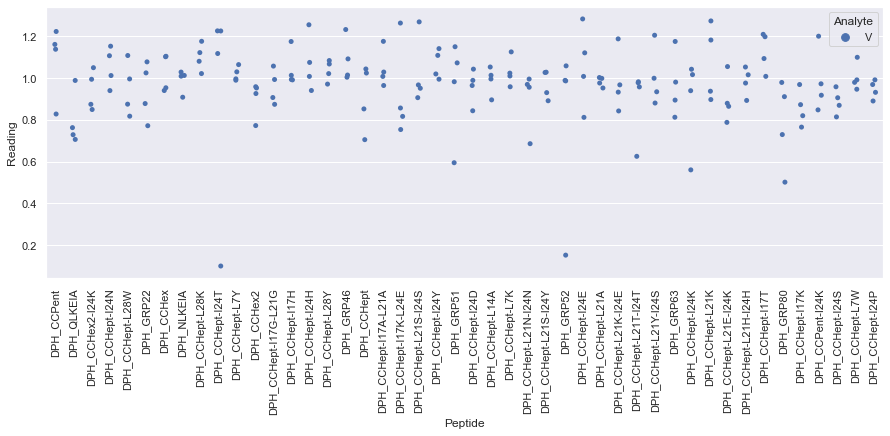

Drawing scatter plot of data spread for W_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

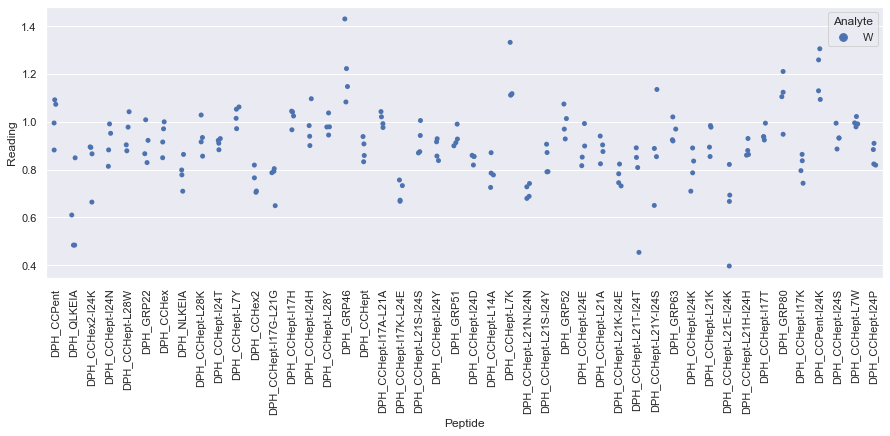

Drawing scatter plot of data spread for E_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

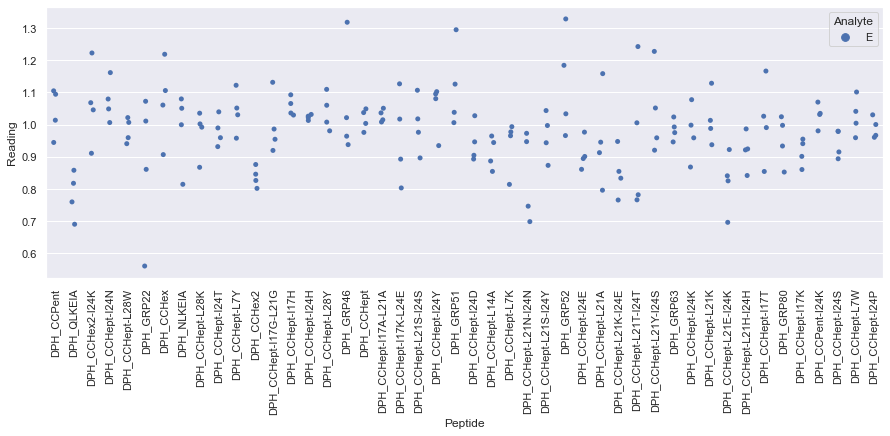

Drawing scatter plot of data spread for R_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

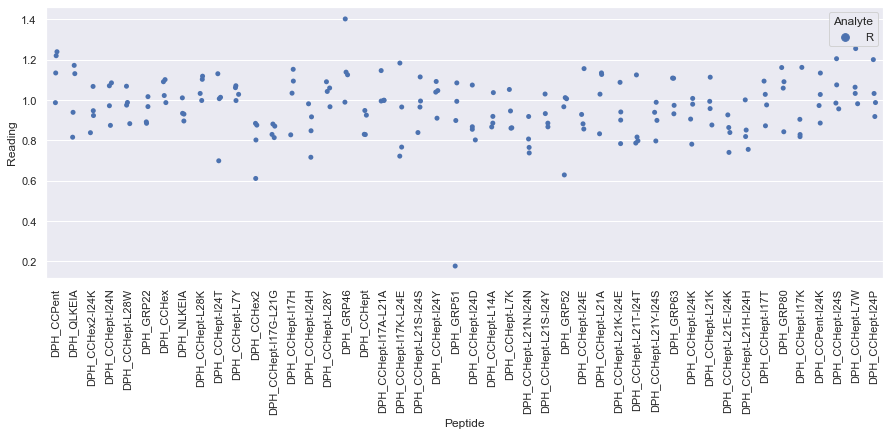

Drawing scatter plot of data spread for S_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

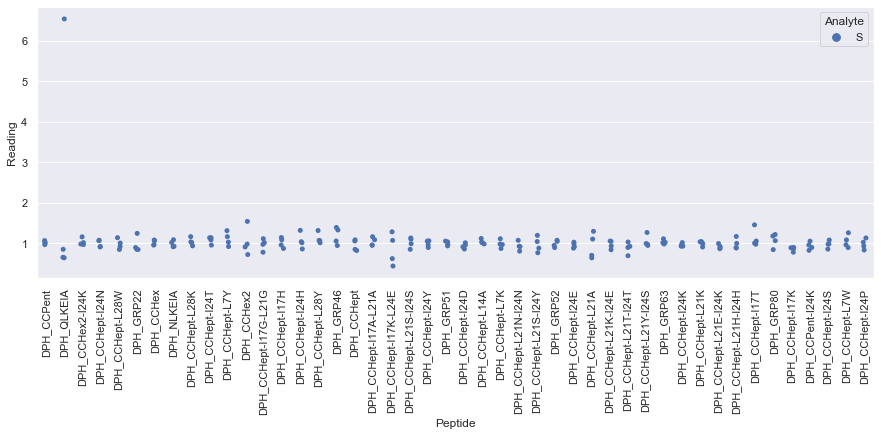

Drawing scatter plot of data spread for V_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

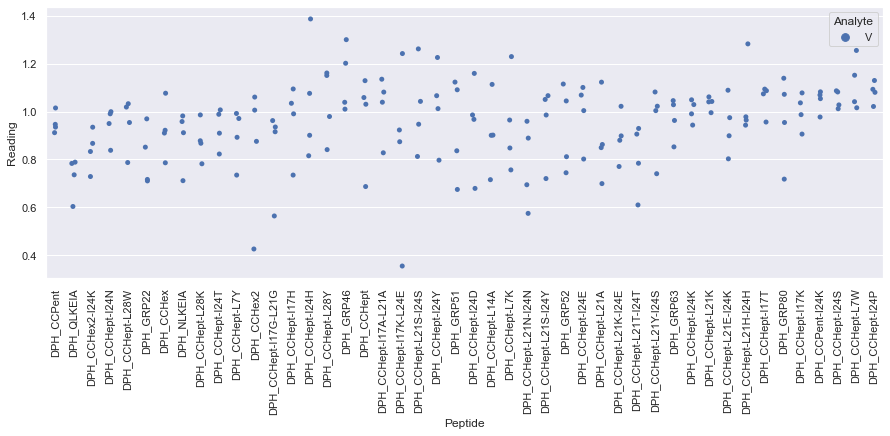

Drawing scatter plot of data spread for W_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

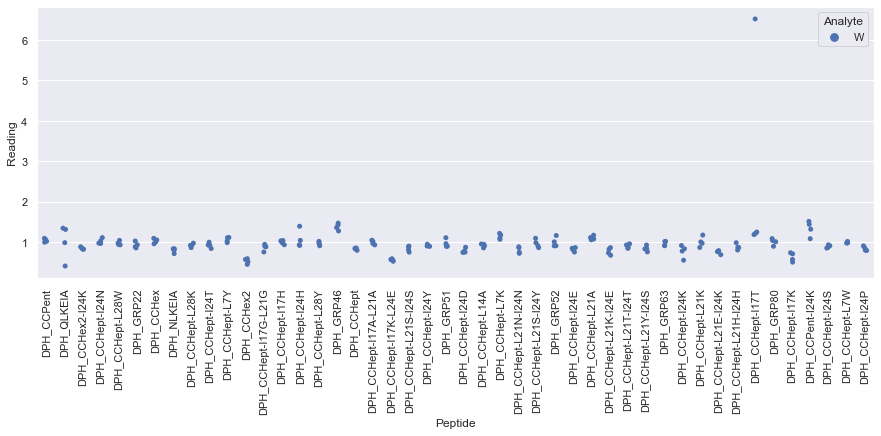

Drawing scatter plot of data spread for E_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

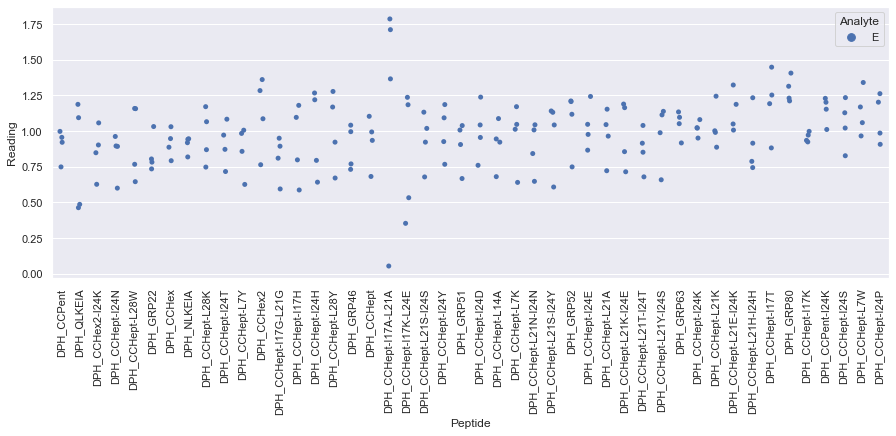

Drawing scatter plot of data spread for R_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

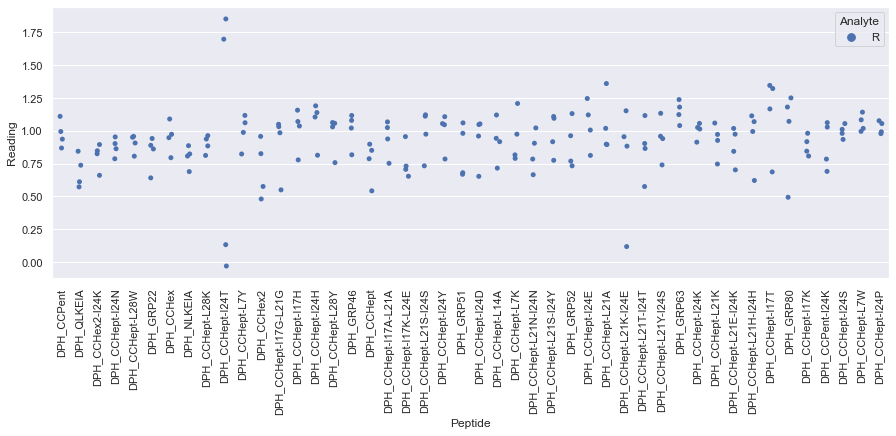

Drawing scatter plot of data spread for S_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

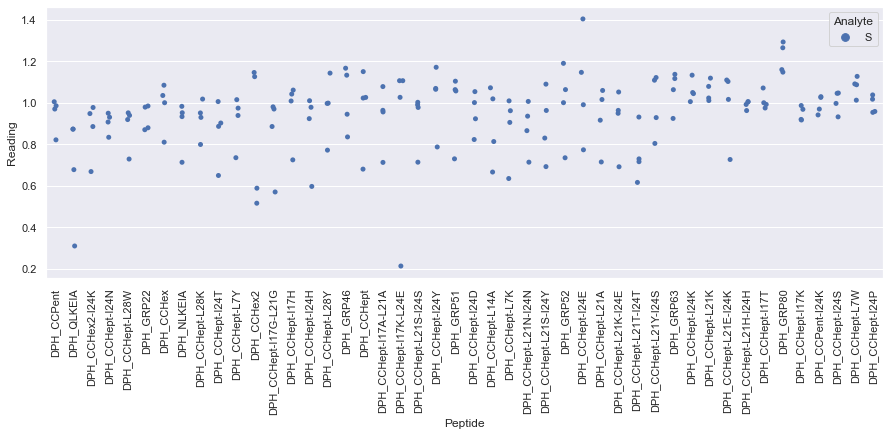

Drawing scatter plot of data spread for V_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

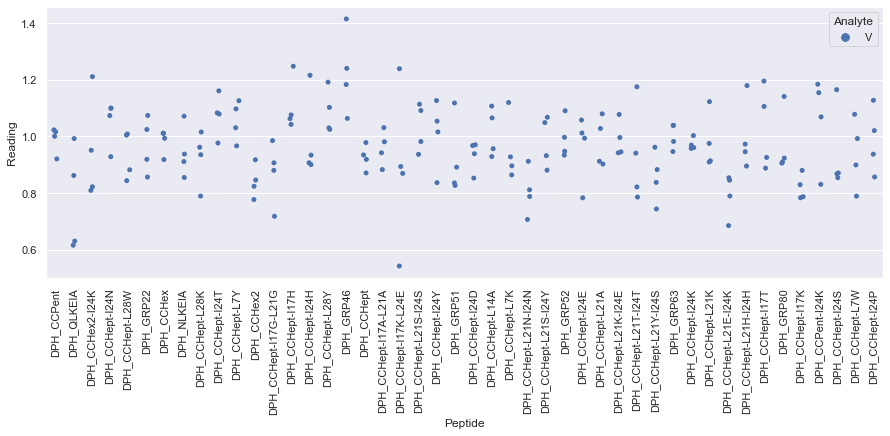

Drawing scatter plot of data spread for W_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

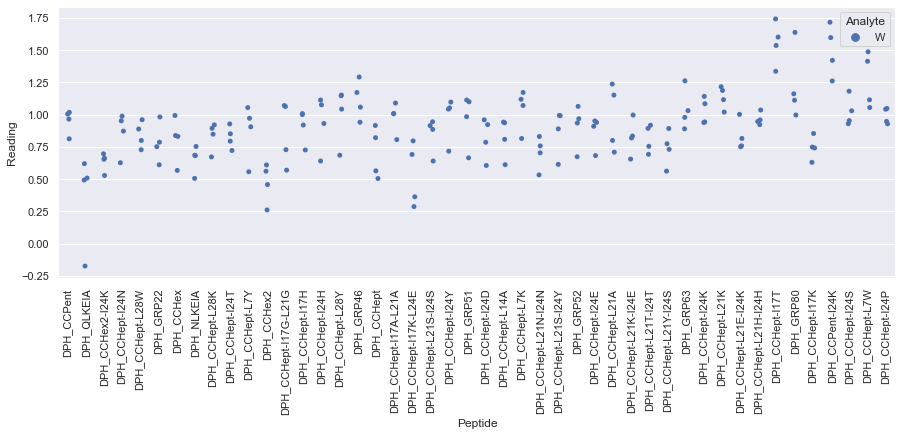

Drawing scatter plot of data spread for E_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

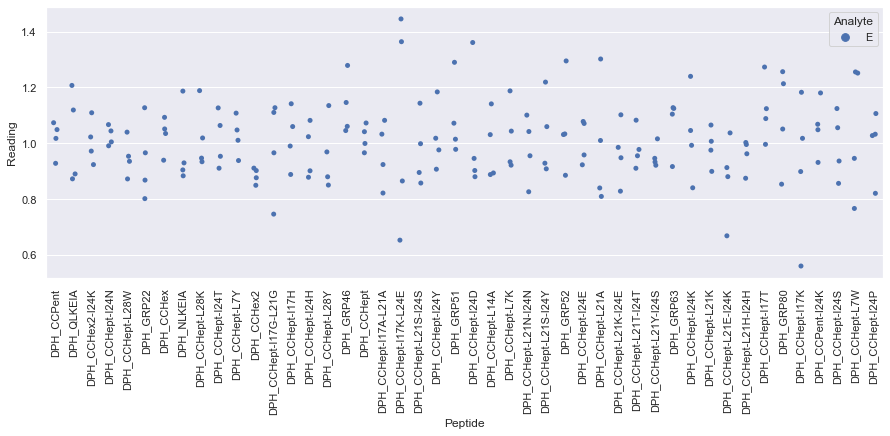

Drawing scatter plot of data spread for R_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

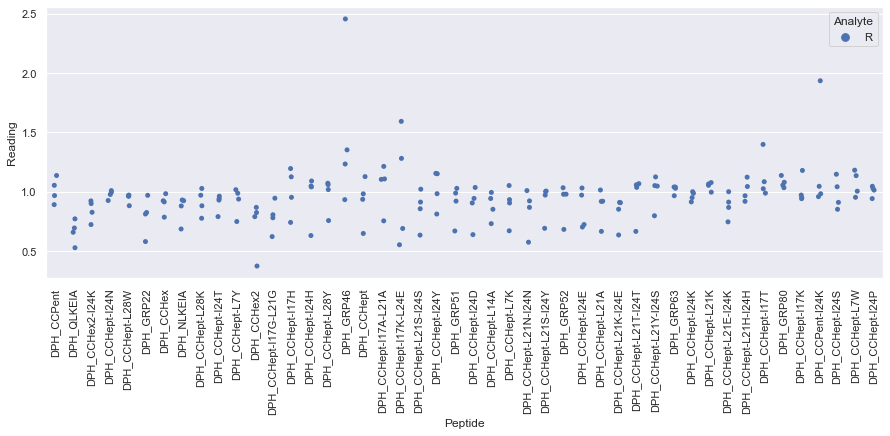

Drawing scatter plot of data spread for S_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

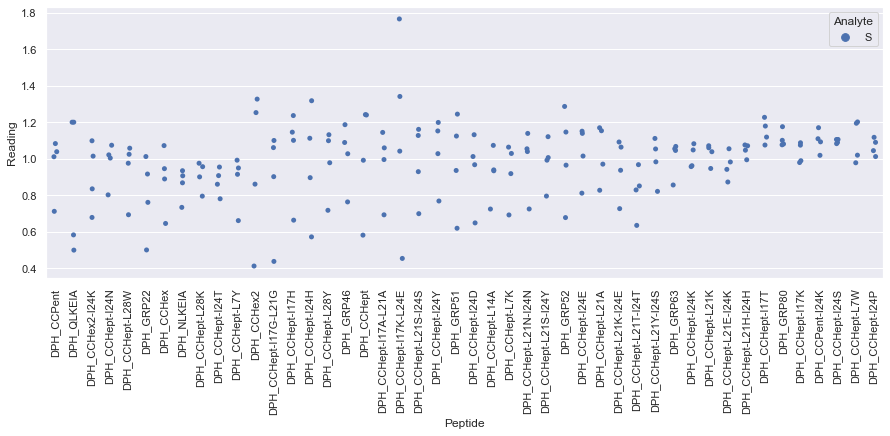

Drawing scatter plot of data spread for V_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

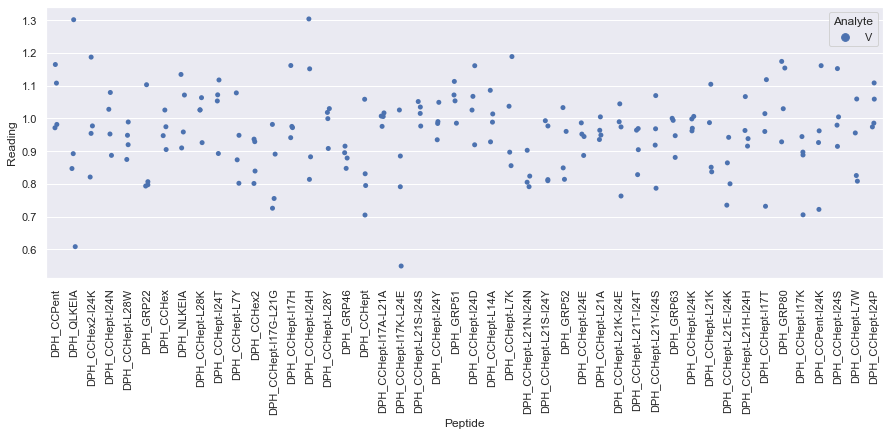

Drawing scatter plot of data spread for W_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

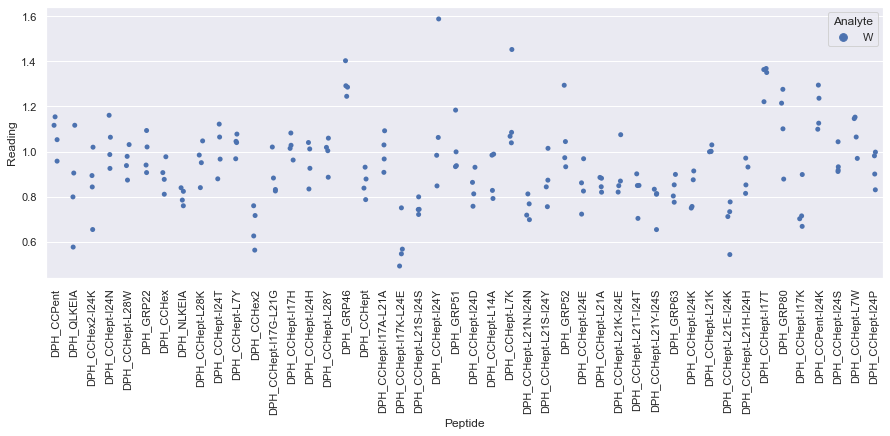

Drawing scatter plot of data spread for E_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

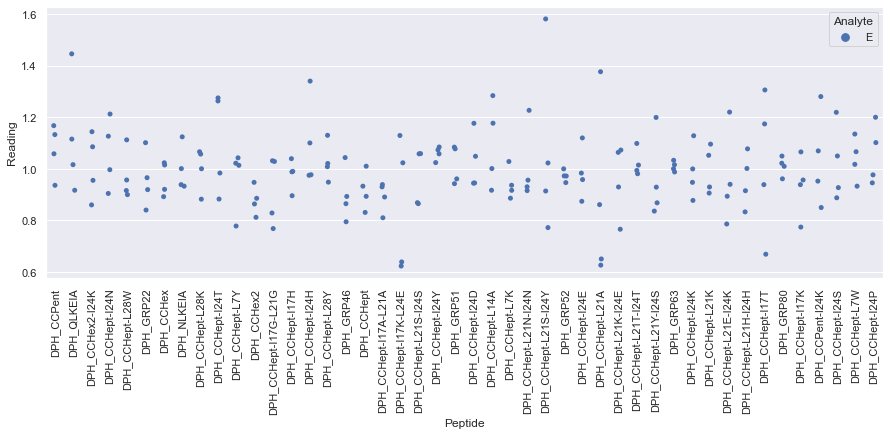

Drawing scatter plot of data spread for R_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

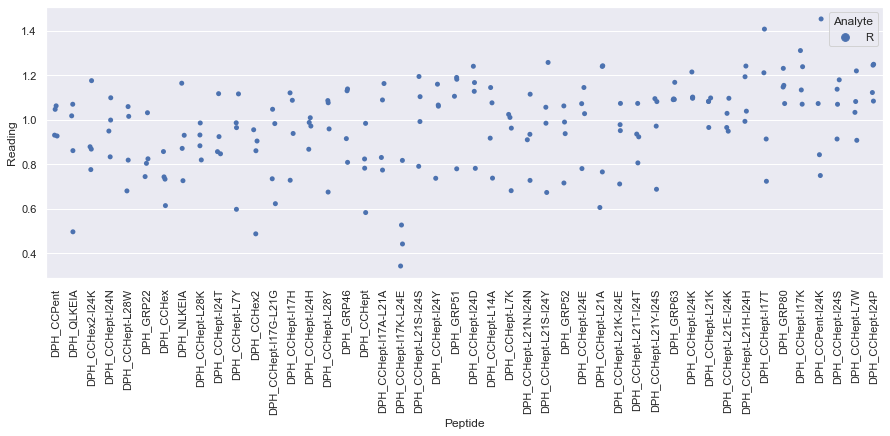

Drawing scatter plot of data spread for S_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

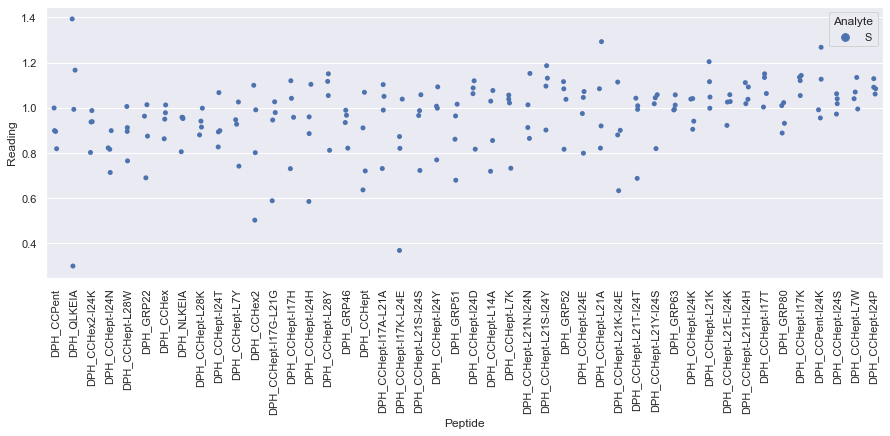

Drawing scatter plot of data spread for V_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

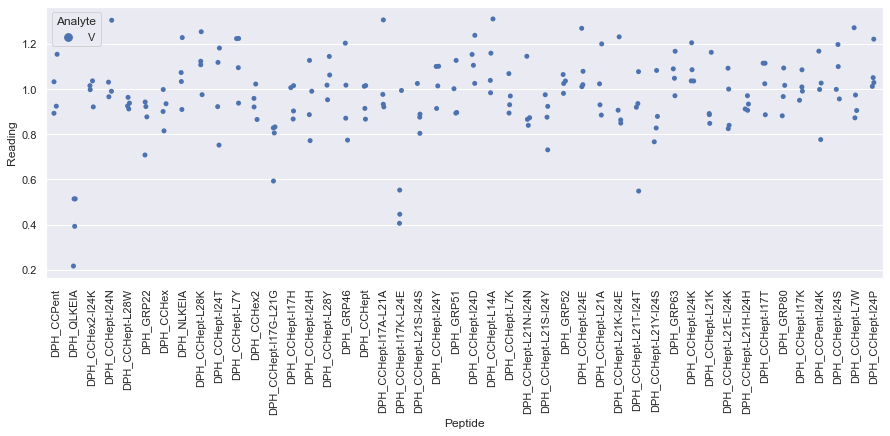

Drawing scatter plot of data spread for W_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

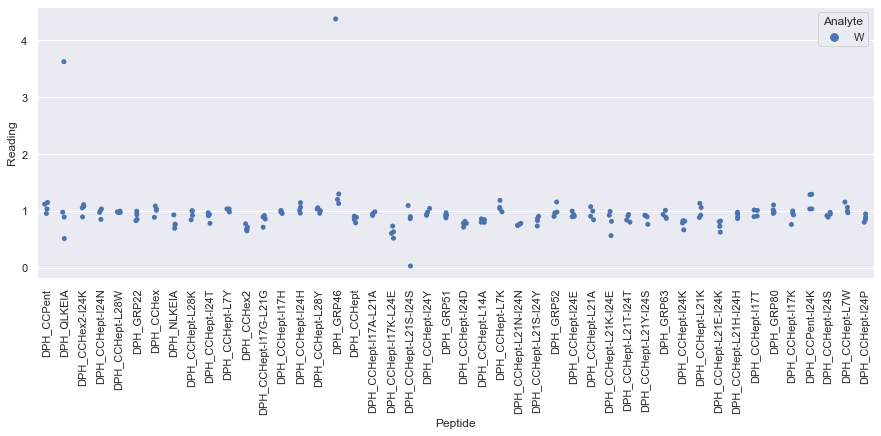

Drawing scatter plot of data spread for E_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

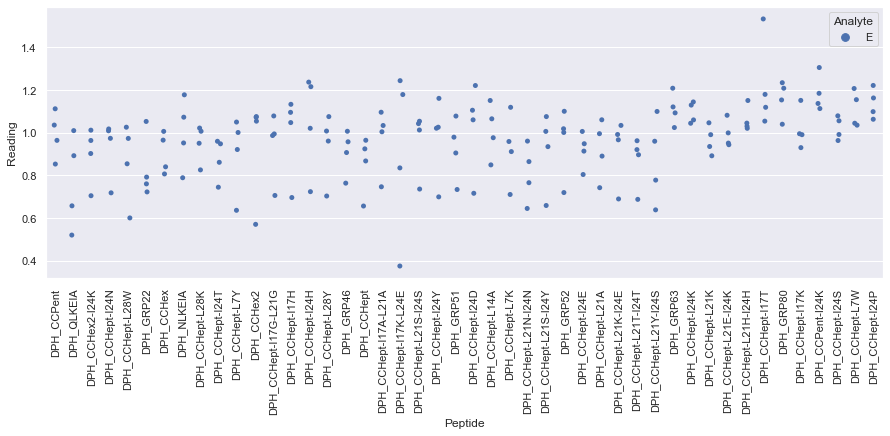

Drawing scatter plot of data spread for R_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

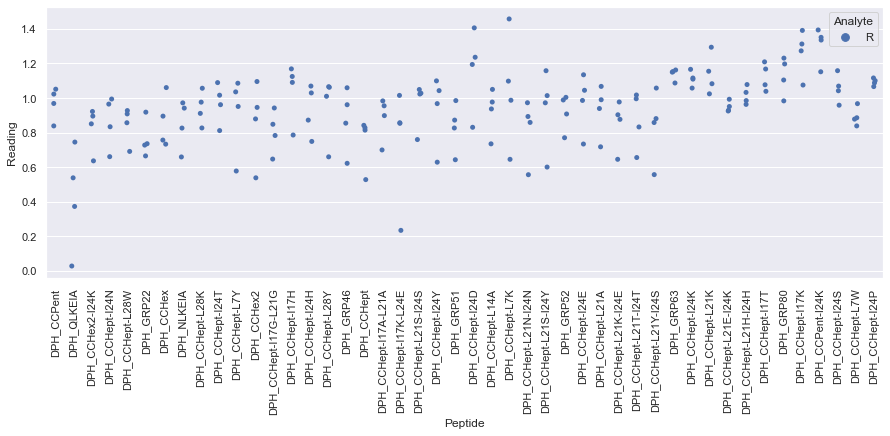

Drawing scatter plot of data spread for S_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

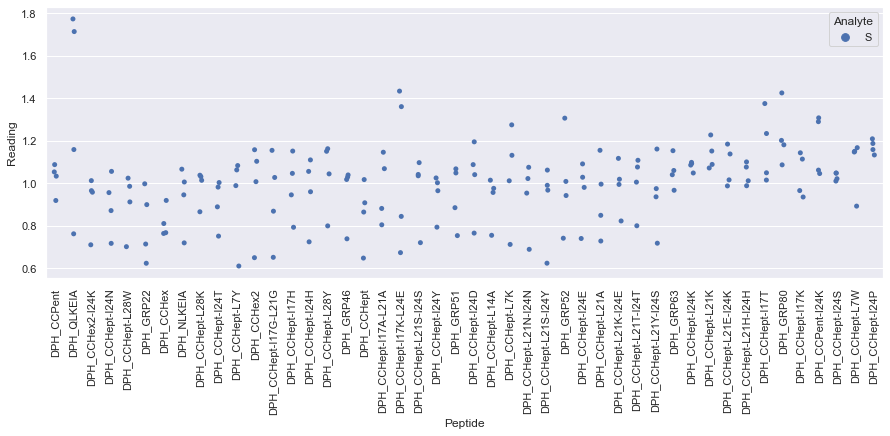

Drawing scatter plot of data spread for V_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

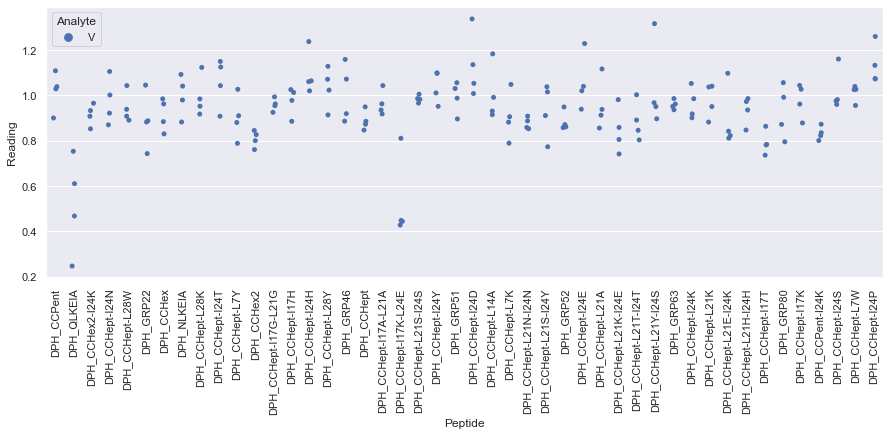

Drawing scatter plot of data spread for W_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

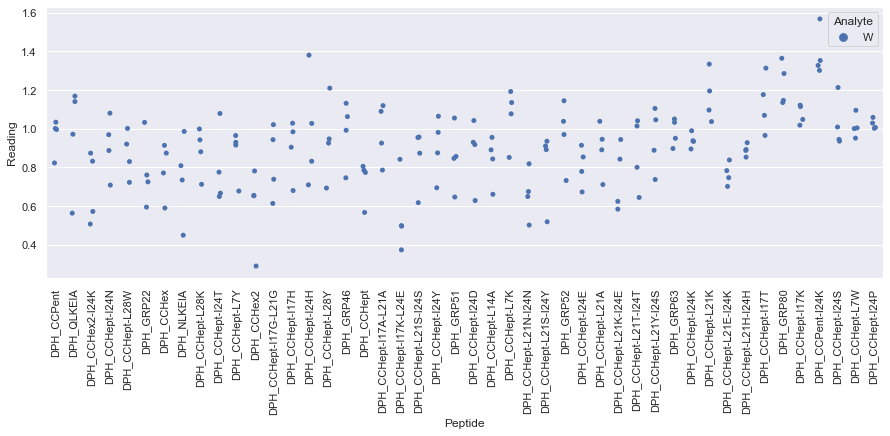

Drawing scatter plot of data spread for E_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

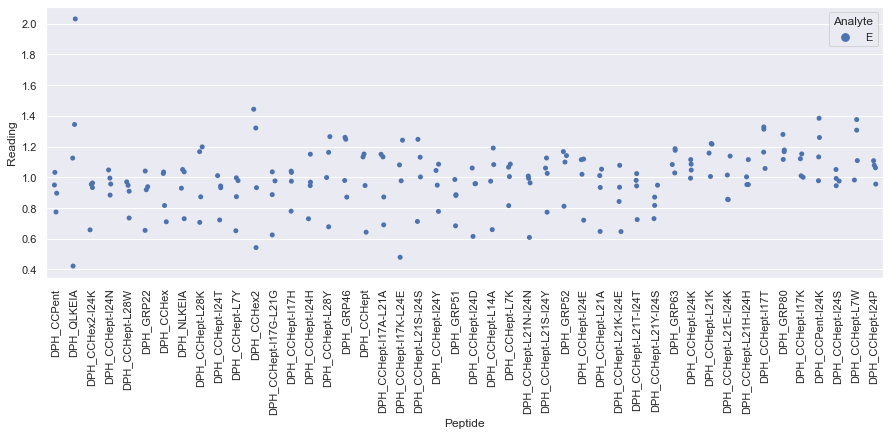

Drawing scatter plot of data spread for R_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

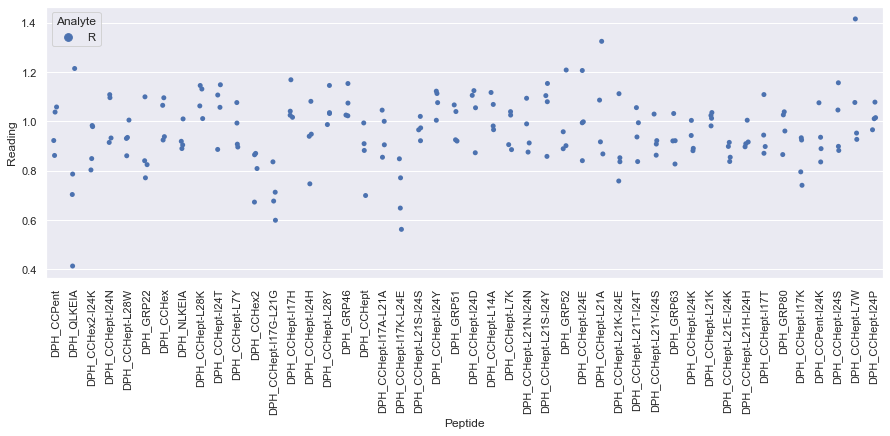

Drawing scatter plot of data spread for S_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

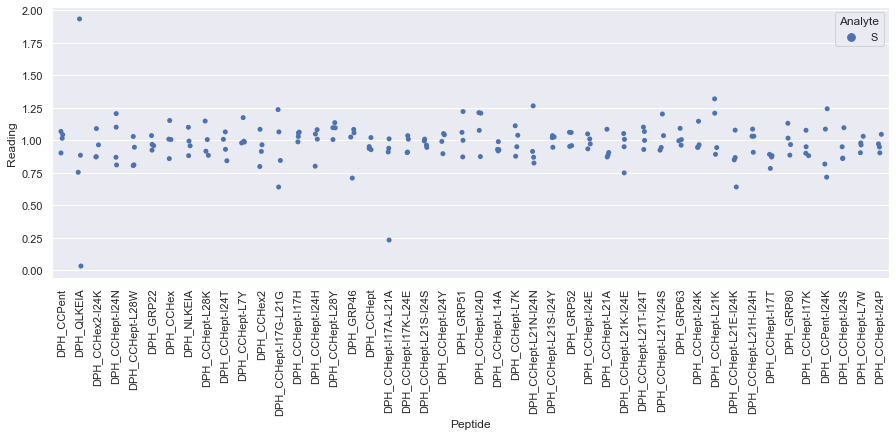

Drawing scatter plot of data spread for V_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

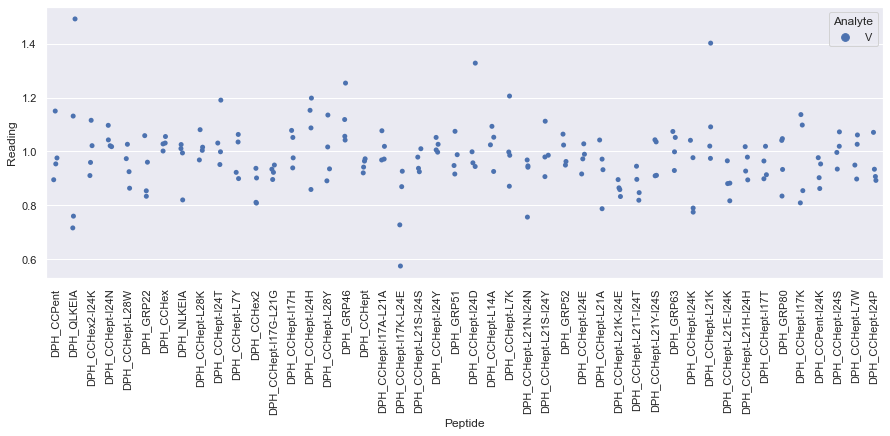

Drawing scatter plot of data spread for W_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

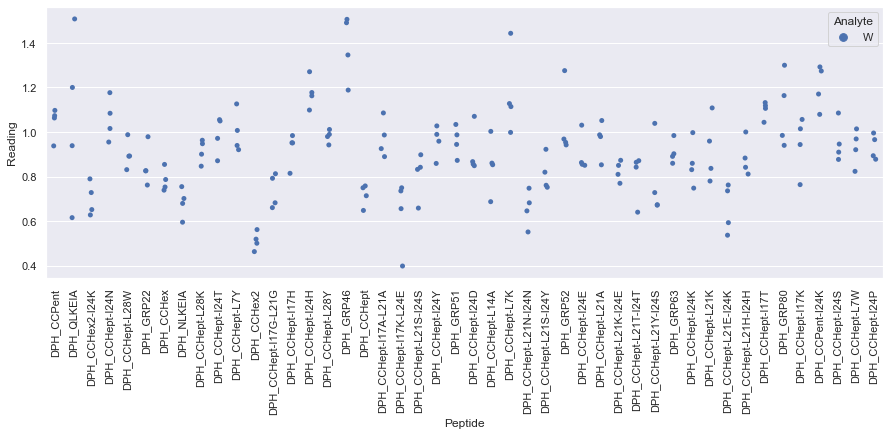

Drawing scatter plot of data spread for E_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

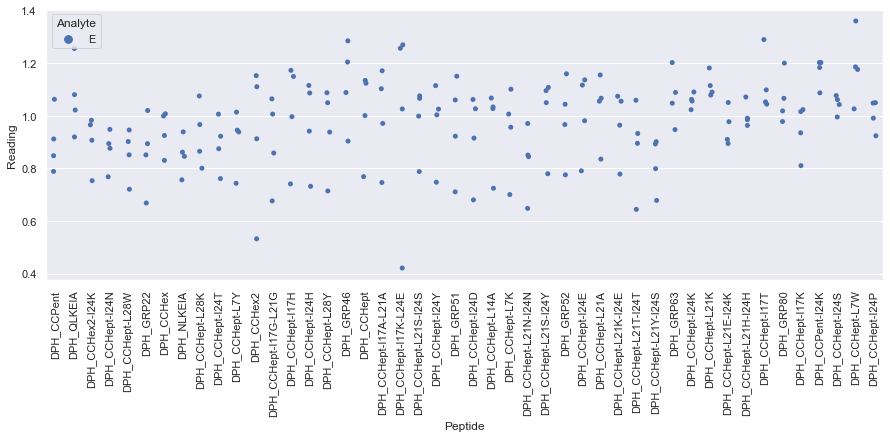

 WARNING - median fluorescence of (R + DPH_QLKEIA + fluorophore) is less than fluorescence of (R + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for R_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

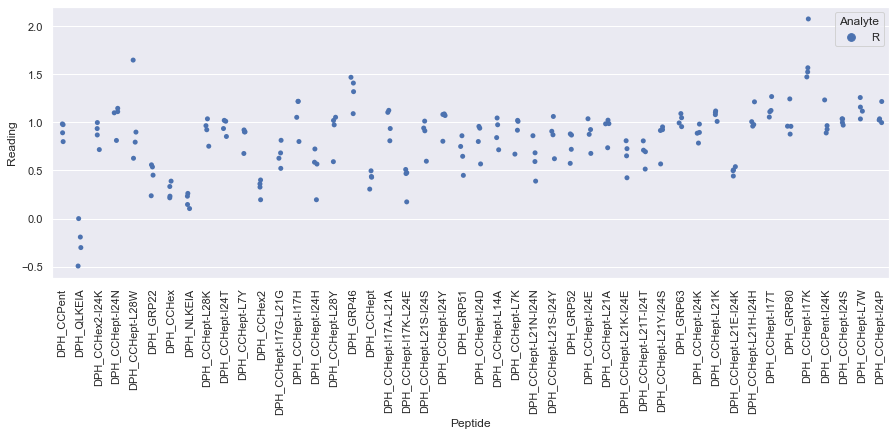

Drawing scatter plot of data spread for S_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

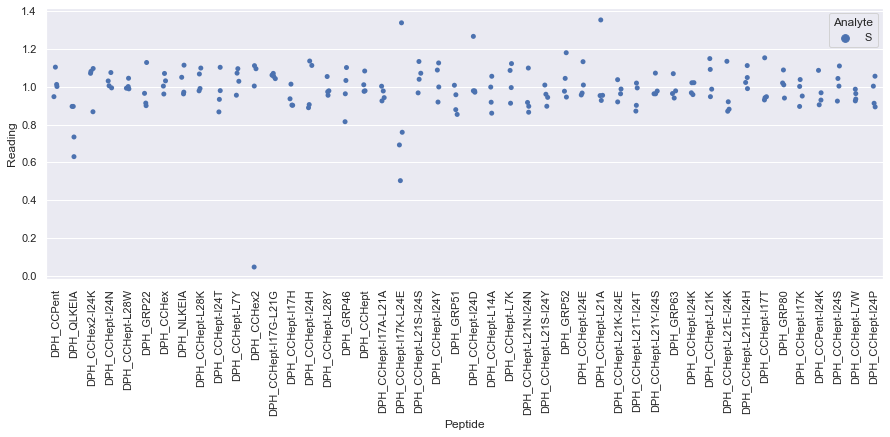

Drawing scatter plot of data spread for V_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

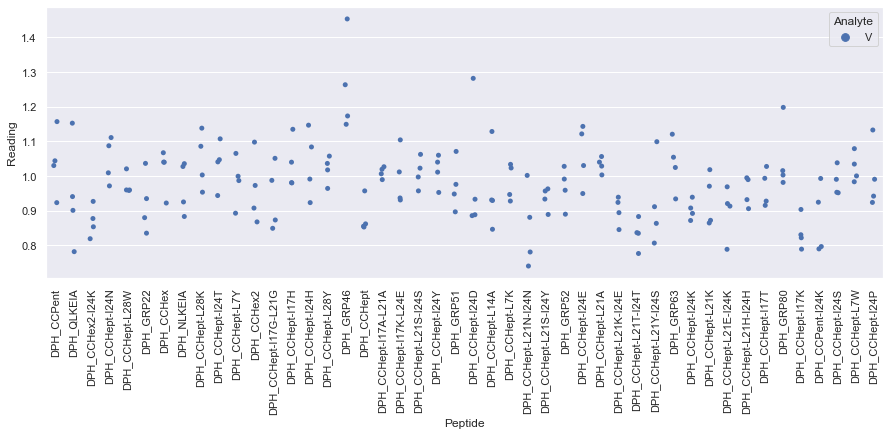

Drawing scatter plot of data spread for W_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

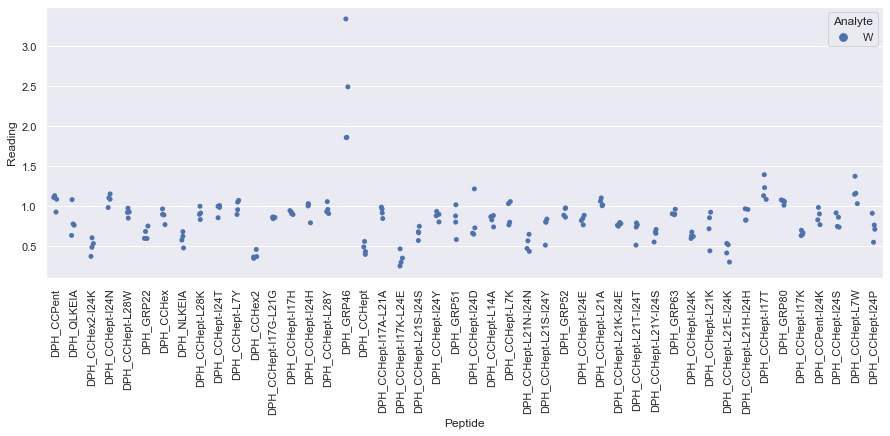

Drawing scatter plot of data spread for E_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

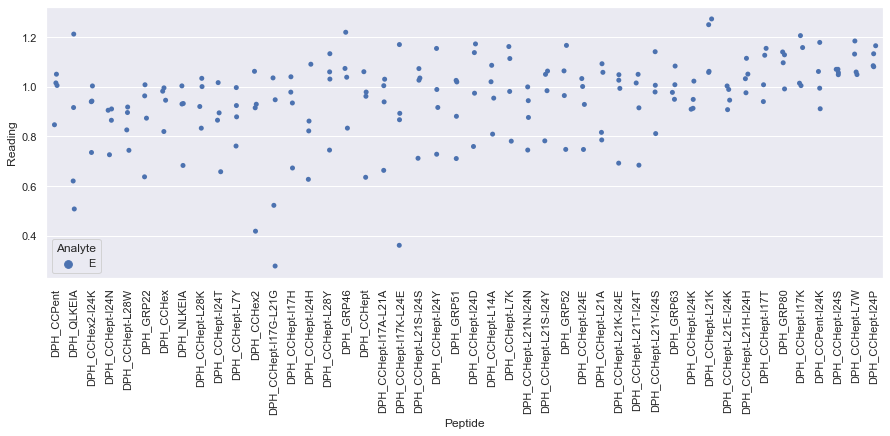

Drawing scatter plot of data spread for R_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

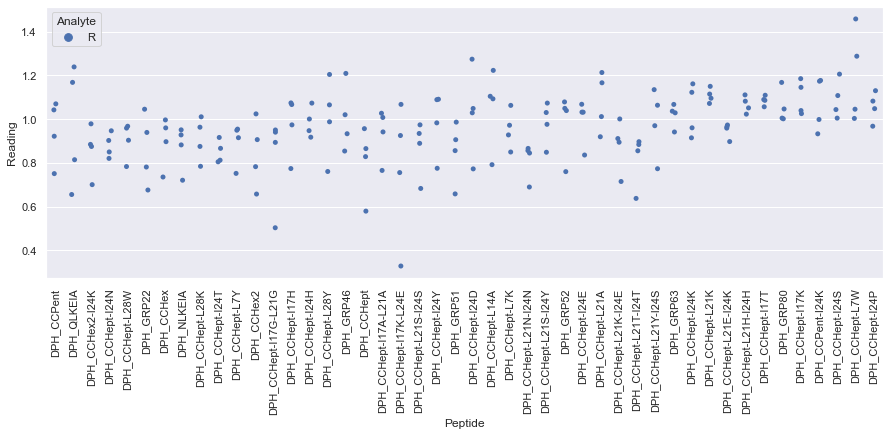

Drawing scatter plot of data spread for S_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

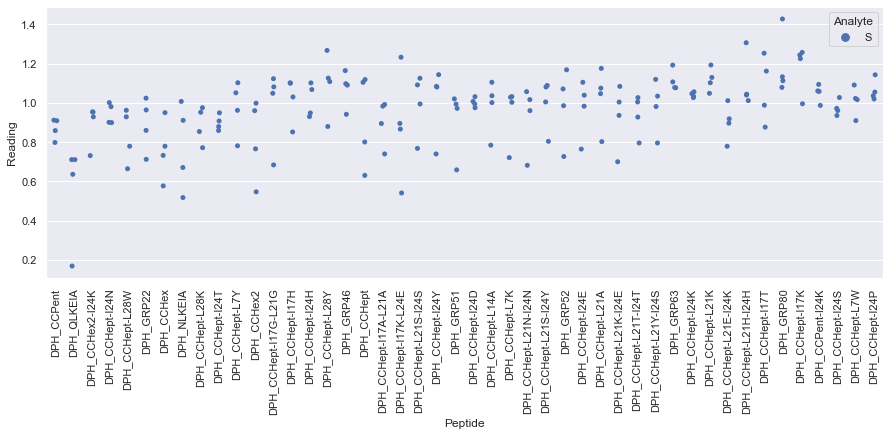

Drawing scatter plot of data spread for V_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

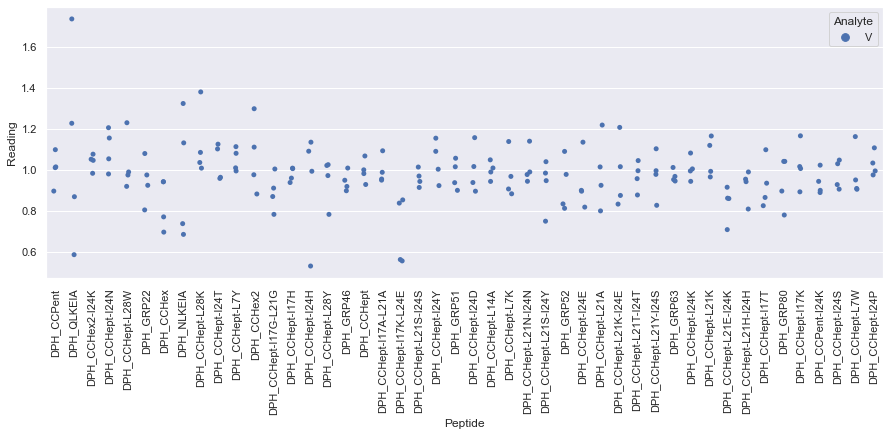

Drawing scatter plot of data spread for W_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

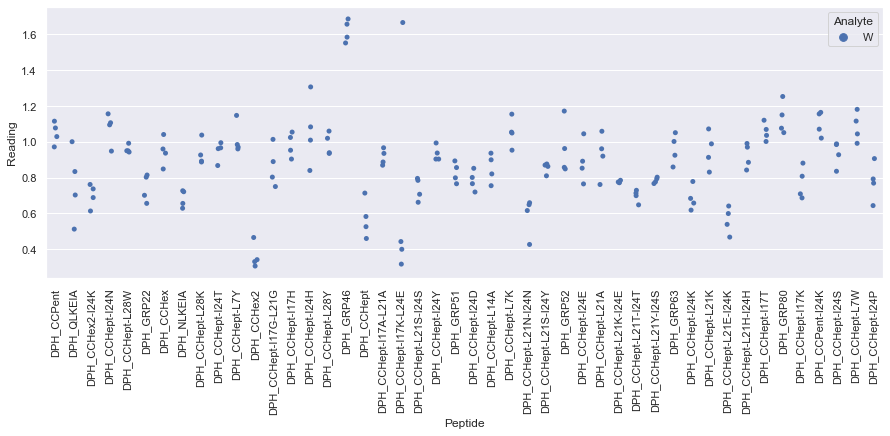



Outliers on the same plate:

/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_No Pep, 284.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24N, 6263.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24T, 5537.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept, 7562.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I17T, 1685.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-L7W, 11393.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/AAs/Reformatted_

In [6]:
aa_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='AA'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-L24E in the presence of DPH is very similar to that of DPH on its own. Consequently, the min-max scaled readings of these peptides are likely to contain large amounts of noise => may need to discard these peptides from the analysis if the variation in readings obtained for the same analyte with these peptides is high.
- There is not much difference in the fluorescence signal in the presence and absence of analyte => the analytes are not causing much displacement/change of interaction of DPH with the peptide. Tryptophan has a greater effect than the other analytes.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
aa_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_R: R, DPH_QLKEIA, 1.3071428571428572
repeat_1_S: S, DPH_QLKEIA, 1.7027027027027026
repeat_1_S: S, DPH_CCHex2, 0.6022068965517241
repeat_1_S: S, DPH_CCHept-I24Y, 1.1675653499003633
repeat_1_S: S, DPH_CCHept-I24D, 0.3405367049412979
repeat_1_S: S, DPH_CCHept-L21S-I24Y, 1.0717790863668808
repeat_1_V: V, DPH_CCHept, 0.7914523851746763
repeat_1_W: W, DPH_QLKEIA, 0.3466666666666667
repeat_1_W: W, DPH_CCHept-L7Y, 0.7301670602641477
repeat_1_W: W, DPH_GRP51, 0.6993677535193781
repeat_1_W: W, DPH_GRP52, 0.6598825944052933
repeat_1_W: W, DPH_CCHept-I17K, 2.4305694305694305
repeat_2_E: E, DPH_CCHept-L28K, 1.0639455782312925
repeat_2_E: E, DPH_CCHept-I24T, 0.47694547807798093
repeat_2_E: E, DPH_CCHept-L28Y, 1.1706338939197931
repeat_2_E: E, DPH_GRP46, 1.3170498084291187
repeat_2_E: E, DPH_GRP51, 0.07872613984769064
repeat_2_E: E, DPH_CCHept-L21A, 1.1681006668100666
repeat_2_R: R, DPH_CCHept-L28K, 1.131226831421006
repeat_2_R: R, DPH_CCHept-I17G-L21G, 0.866722630

 Outlier excluded from final output dataset: 8, W
DPH_CCPent                                 1.095986
DPH_QLKEIA                                    0.768
DPH_CCHex2-I24K                            0.506773
DPH_CCHept-I24N                            1.093888
DPH_CCHept-L28W                             0.92255
DPH_GRP22                                  0.638238
DPH_CCHex                                   0.89149
DPH_NLKEIA                                  0.59716
DPH_CCHept-L28K                            0.904324
DPH_CCHept-I24T                            0.989459
DPH_CCHept-L7Y                              1.00152
DPH_CCHex2                                  0.36393
DPH_CCHept-I17G-L21G                       0.856949
DPH_CCHept-I17H                            0.914785
DPH_CCHept-I24H                            1.010739
DPH_CCHept-L28Y                             0.94343
DPH_GRP46               Outlier: 2.1752797016515717
DPH_CCHept                                 0.458812
DPH_CCHept-I17

Display range of data points across repeats for the different analytes




Original_data:


E


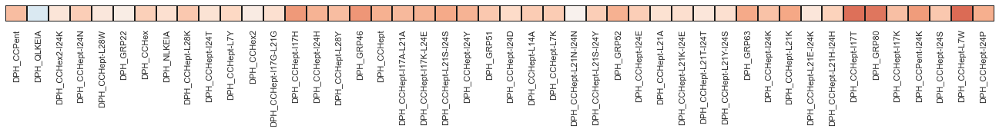


R


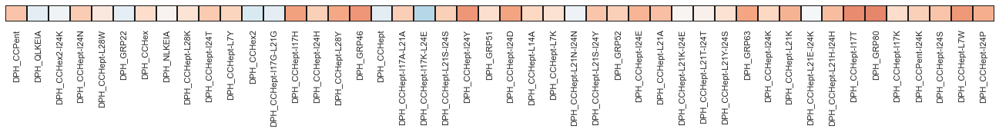


S


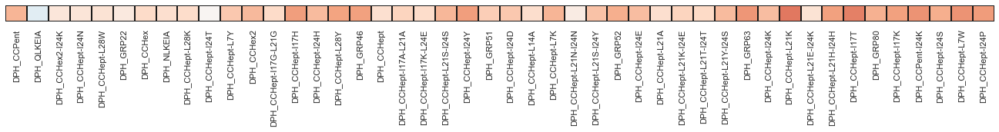


V


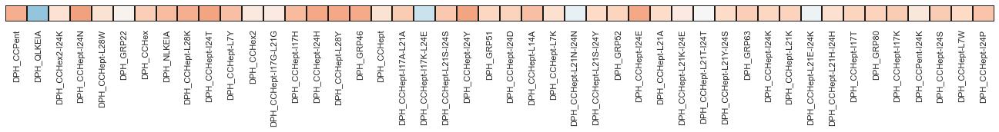


W


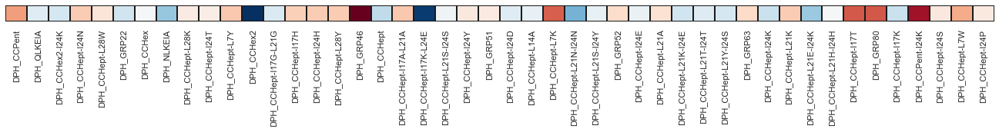




Scaled_data:


E


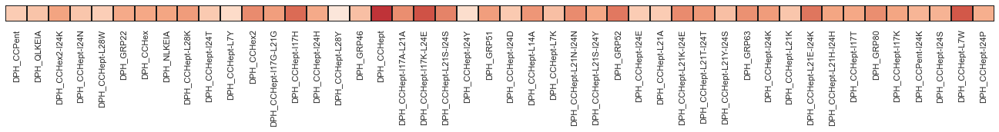


R


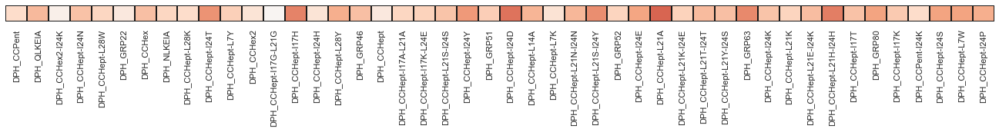


S


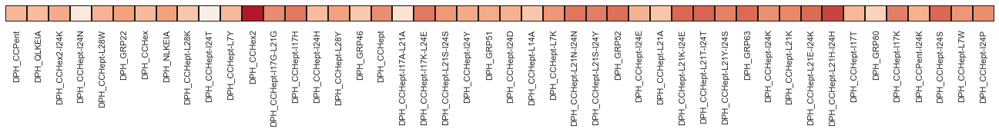


V


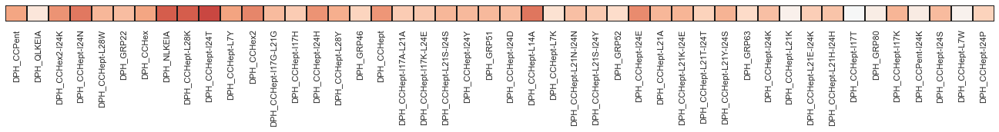


W


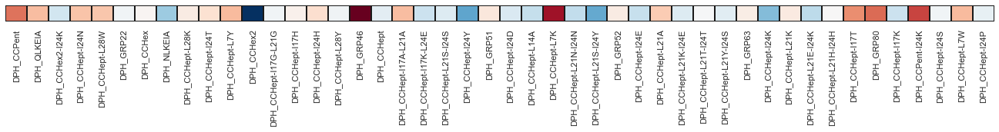




Original_data:



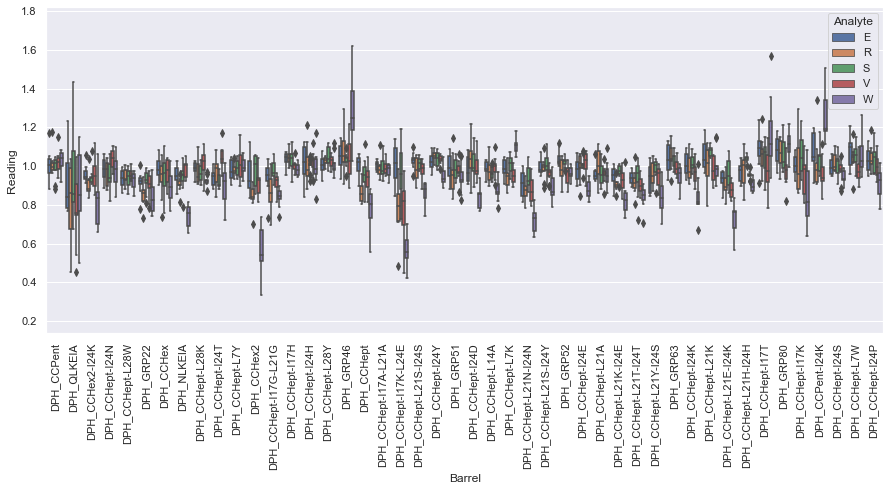

E


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


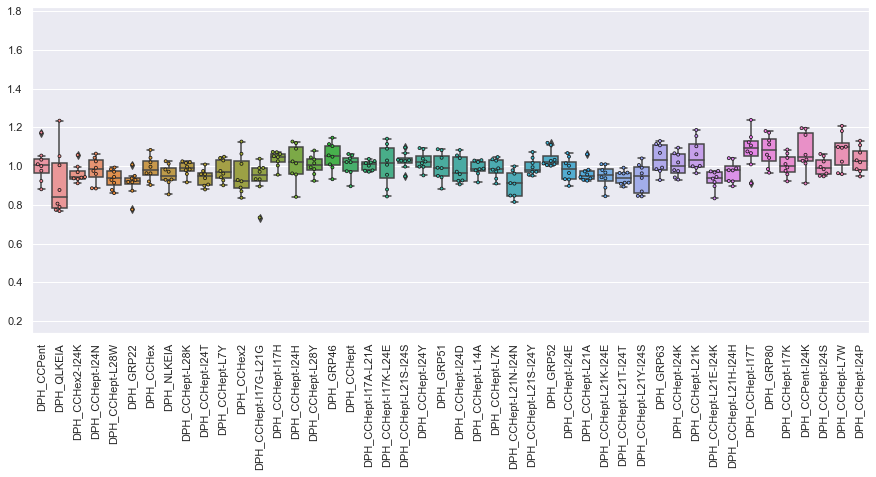

R


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


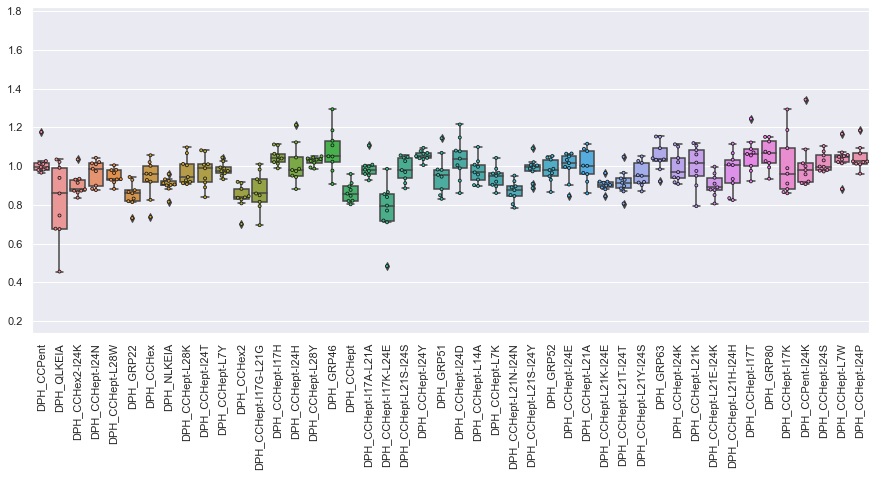

S


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


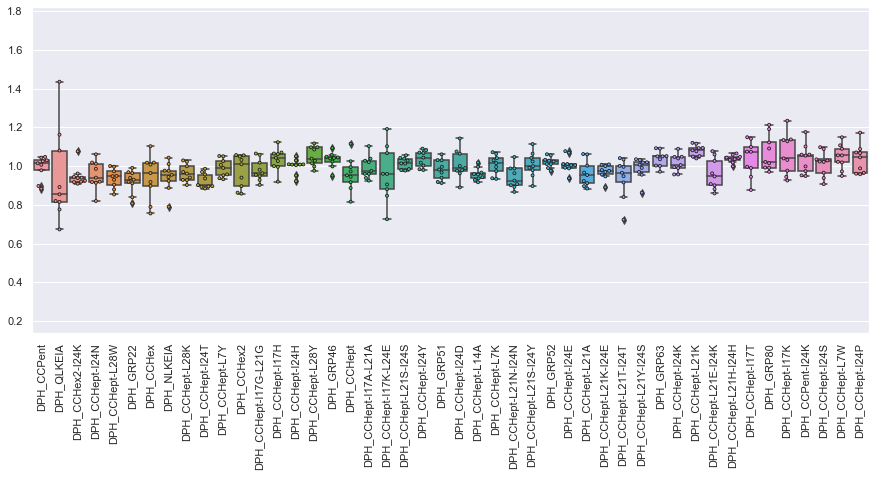

V


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


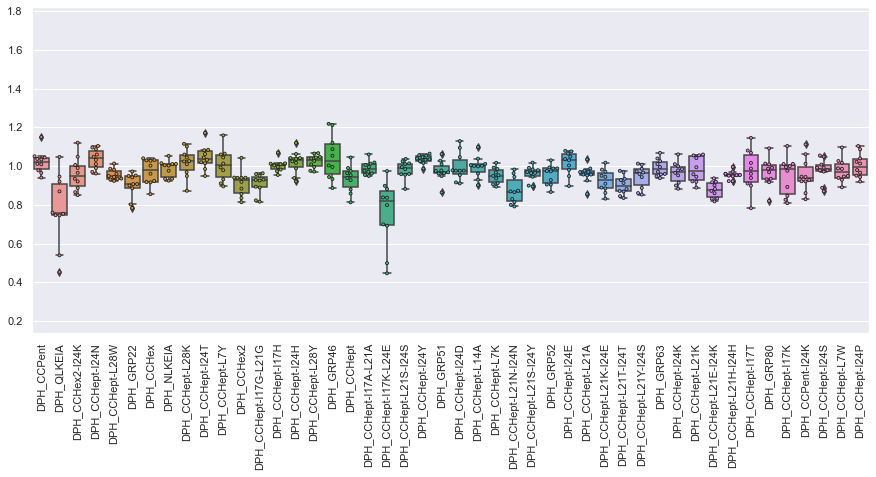

W


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


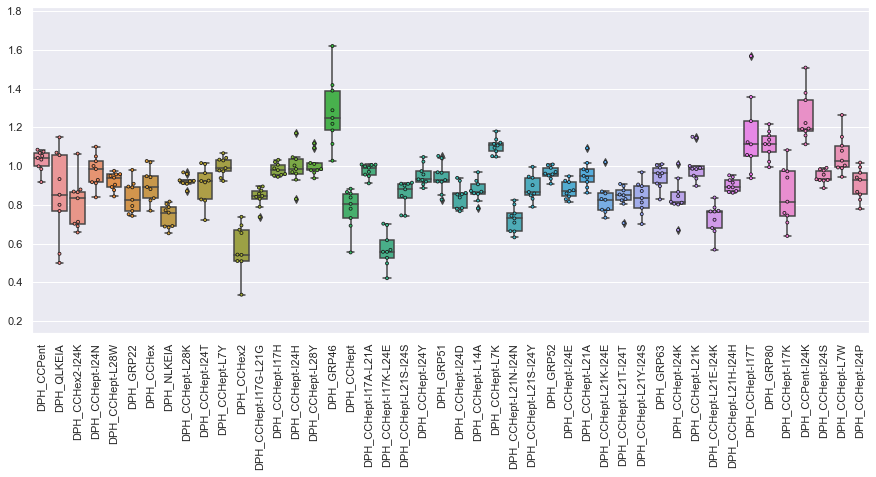




Scaled_data:



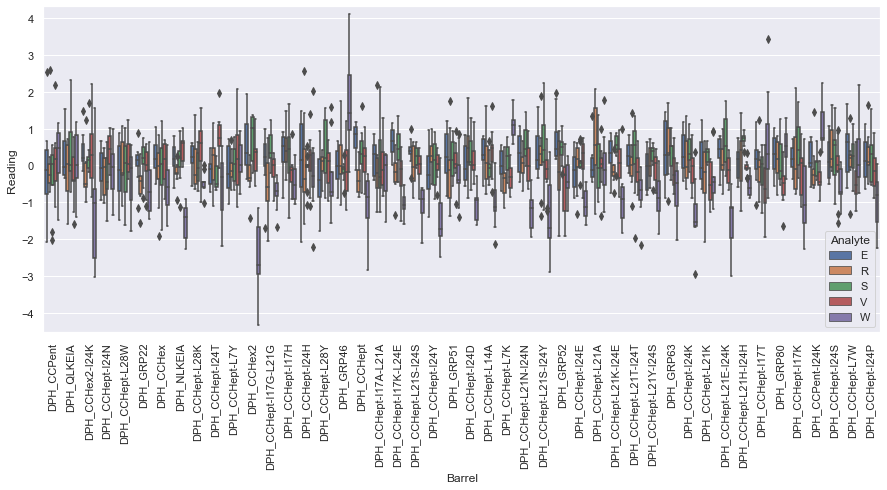

E


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


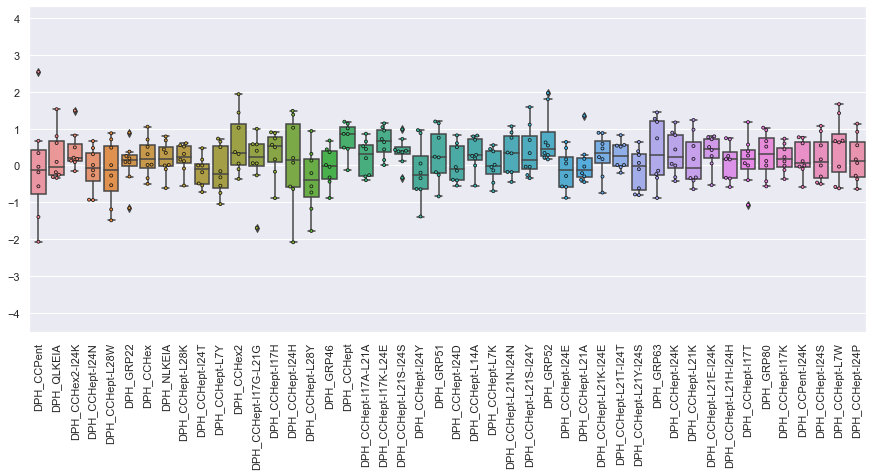

R


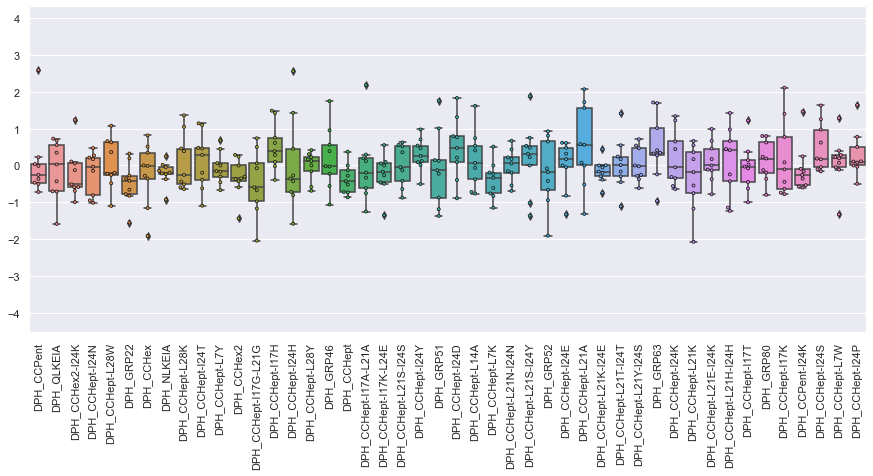

S


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


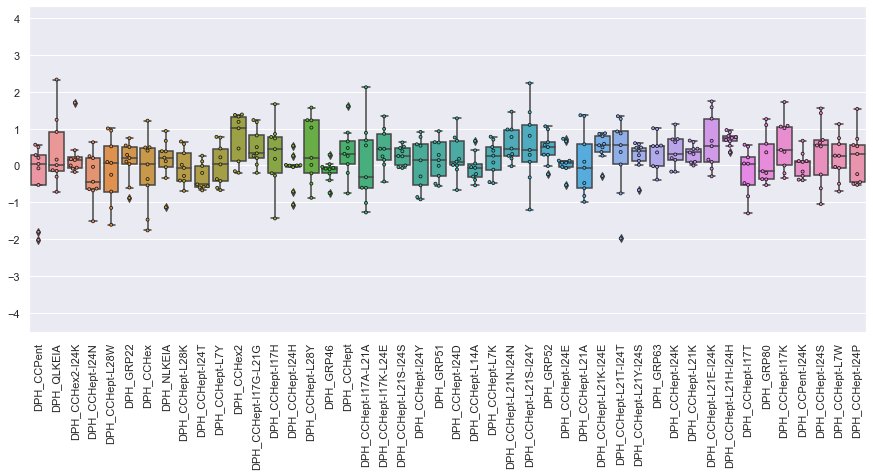

V


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


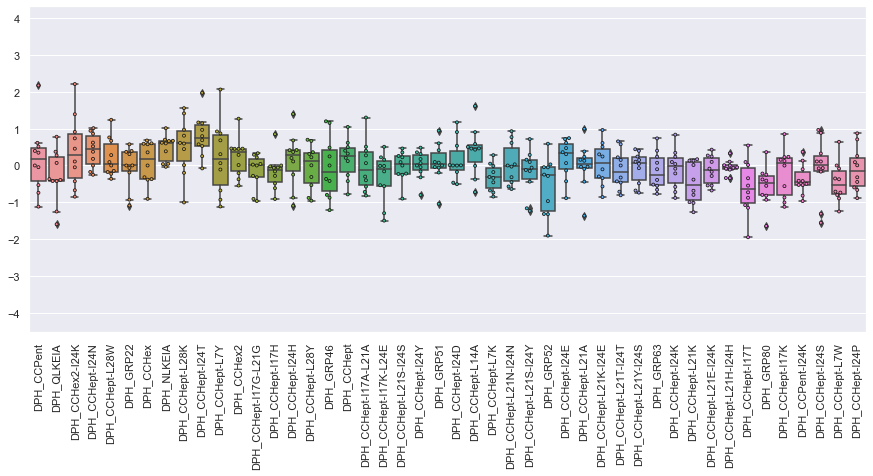

W


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


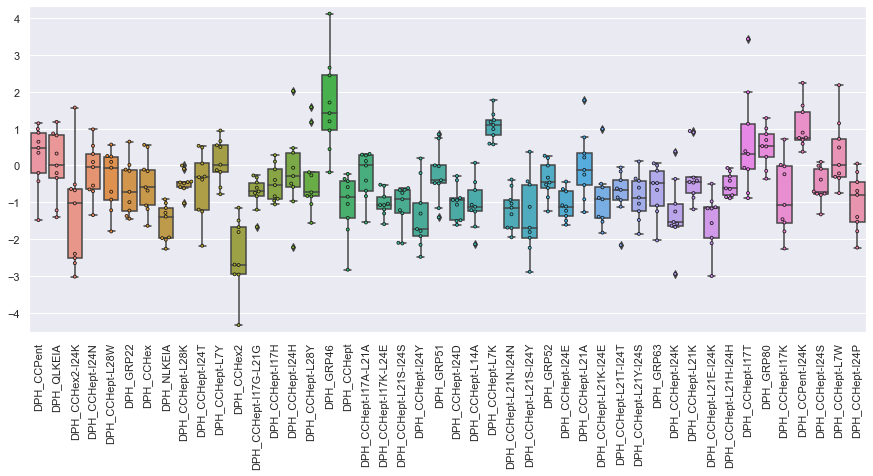

In [8]:
aa_fluor_data.display_data_distribution()

- As suggested by the scatter plots of the raw data above, the fingerprint of W is the most easily distinguishable, whereas the other four amino acids are similar to one another.
- When looking at the unscaled data, the ranges of readings obtained for QLKEIA (identified above as having a minimal effect upon the fluorescence of DPH) are large and show a high degree of overlap. However when looking at the scaled data, the overlap of different classes is not noticeably (by eye) poorer than many of the other peptides (e.g. compare to CCPent).

Consequently, I will not discard any of the peptides from the initial dataset used for ML training.

In [9]:
aa_fluor_data.ml_fluor_data

,DPH_CCPent,DPH_QLKEIA,DPH_CCHex2-I24K,DPH_CCHept-I24N,DPH_CCHept-L28W,DPH_GRP22,DPH_CCHex,DPH_NLKEIA,DPH_CCHept-L28K,DPH_CCHept-I24T,...,DPH_CCHept-L21E-I24K,DPH_CCHept-L21H-I24H,DPH_CCHept-I17T,DPH_GRP80,DPH_CCHept-I17K,DPH_CCPent-I24K,DPH_CCHept-I24S,DPH_CCHept-L7W,DPH_CCHept-I24P,Analyte
0,0.975754,0.805970,0.911260,0.959824,0.992671,0.949460,0.996339,0.929025,1.024605,0.957439,...,0.972638,0.921093,0.910909,0.984478,1.042352,0.910192,0.961709,0.963116,0.946389,E
1,1.173333,0.876437,0.968451,1.042891,0.970839,1.008017,1.019729,0.970988,1.016143,0.957612,...,0.917594,0.895863,1.122525,1.058936,1.010333,1.013535,0.949764,0.958733,0.973714,E
2,1.054200,0.789017,1.057116,1.064320,0.983391,0.936198,1.083456,1.025333,0.997308,0.974687,...,0.833333,0.923131,1.008582,0.965823,0.921273,1.033352,0.947079,1.022945,0.983653,E
3,1.032963,1.004405,0.997020,1.024302,0.944165,0.916627,1.042882,0.916823,0.982637,1.008268,...,0.896363,0.978689,1.105980,1.131978,0.957890,1.058071,0.995787,1.098436,1.029730,E
4,0.999950,0.774510,0.932947,0.991259,0.913675,0.775800,0.902547,1.012388,0.978639,0.904505,...,0.975191,1.037625,1.149506,1.181197,0.992958,1.160988,1.023756,1.099746,1.130901,E
5,0.922894,1.234375,0.943548,0.975264,0.928380,0.928596,0.920456,0.982110,1.019693,0.937569,...,0.935408,0.977644,1.238383,1.172258,1.065114,1.195792,0.983709,1.207681,1.069779,E
6,0.880173,1.051095,0.936436,0.885496,0.876904,0.872823,0.962317,0.853927,0.916010,0.898641,...,0.943916,0.987938,1.075606,1.042473,0.975499,1.192737,1.052147,1.180891,1.019655,E
7,1.009470,0.767606,0.940277,0.884394,0.860375,0.917590,0.963124,0.930681,0.959728,0.879332,...,0.966801,1.040873,1.066630,1.111805,1.085274,1.027042,1.062601,1.094662,1.107924,E
8,1.025855,1.021429,1.034466,1.009236,1.004214,0.943589,1.020425,0.959219,1.004224,1.007548,...,0.806447,0.933195,1.070046,1.016349,0.988957,0.920160,0.997541,1.020918,0.960921,R
9,1.014104,0.858757,0.929889,1.042682,0.978965,0.866702,0.959320,0.923752,1.011156,1.076569,...,0.878458,0.824546,0.975738,0.934832,0.909808,0.979306,0.980335,1.034094,1.023615,R


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_ML_plots',
    fluor_data=aa_fluor_data.ml_fluor_data.drop(['Analyte'], axis=1),
    classes=aa_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [11]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

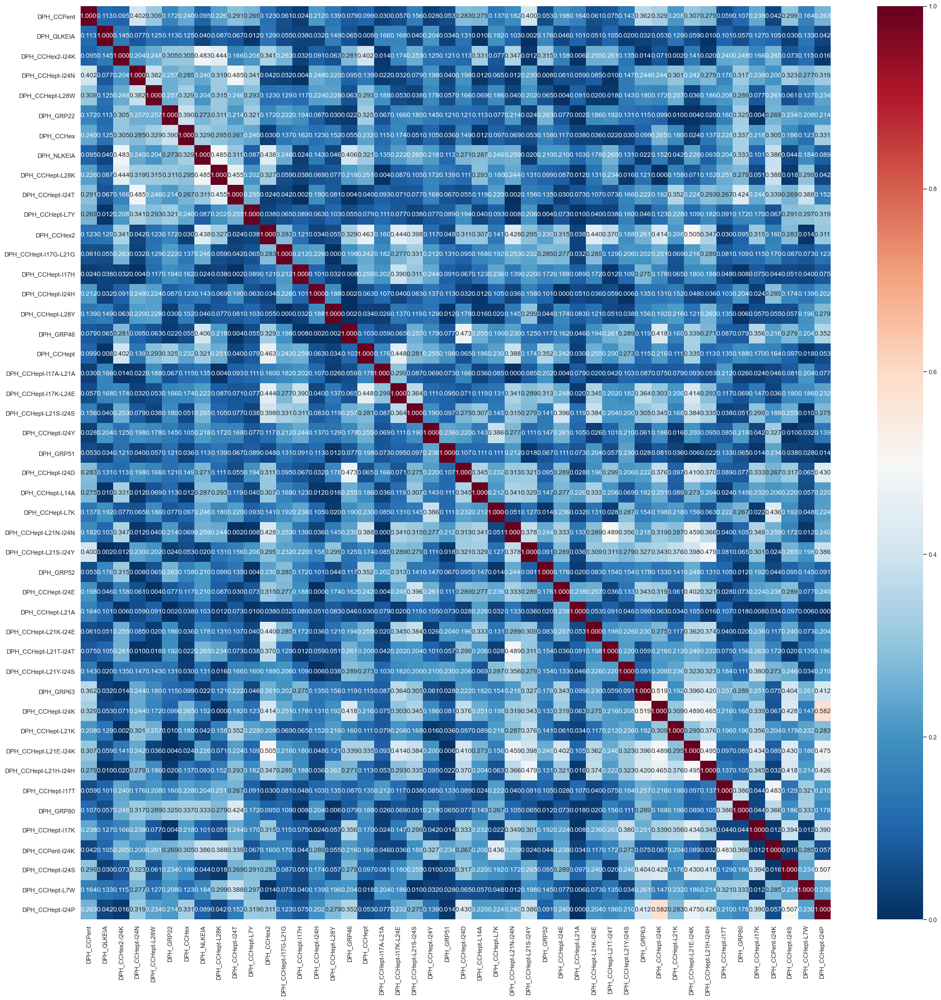

In [12]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

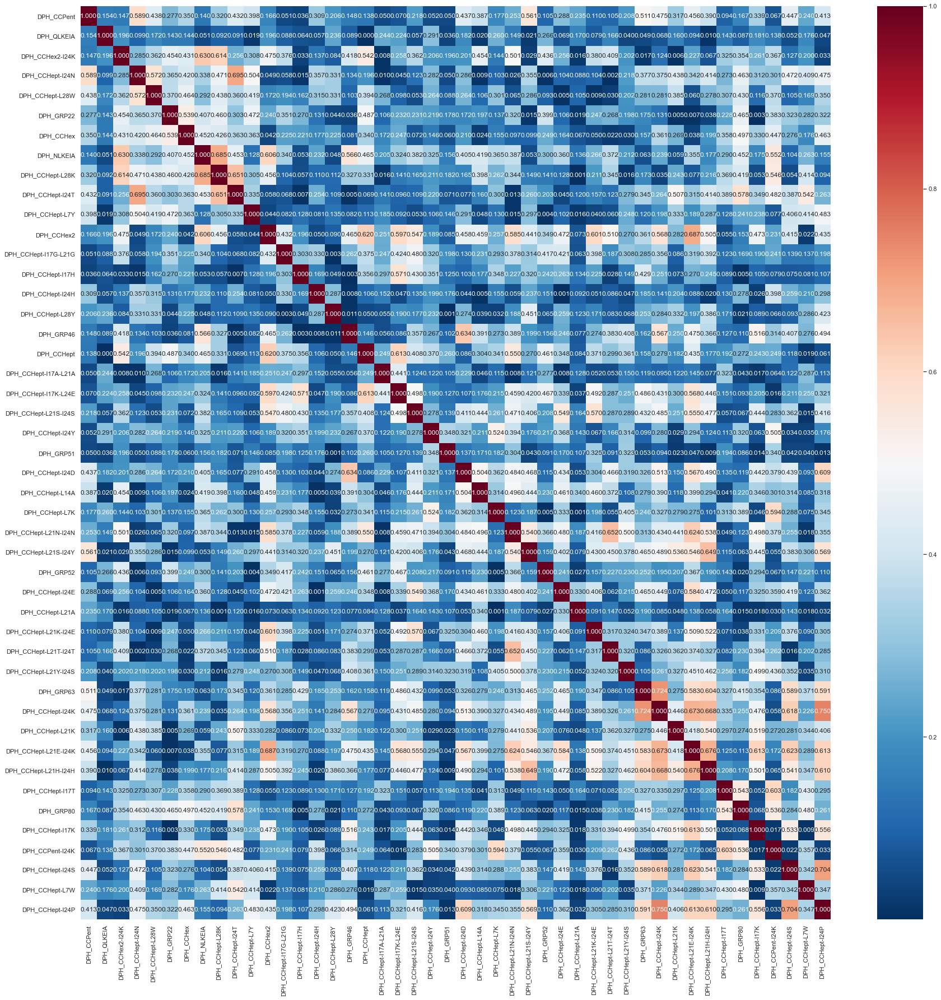

In [13]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

In [14]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

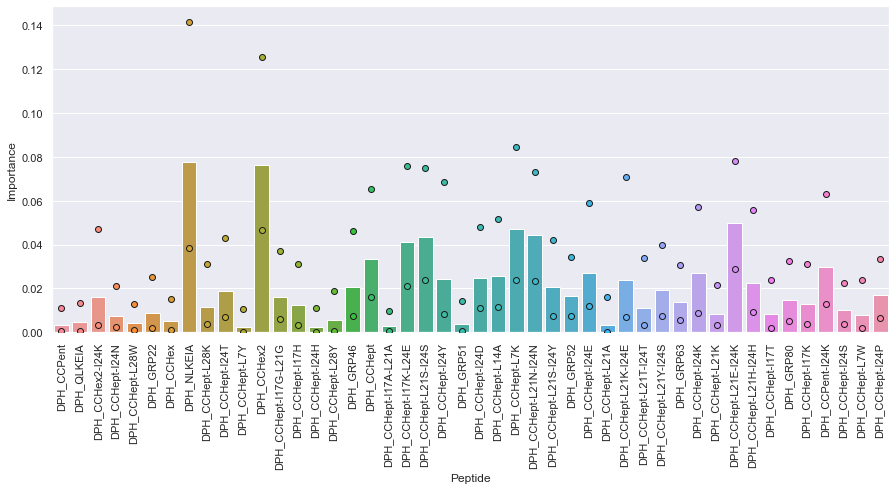

<Figure size 720x720 with 0 Axes>

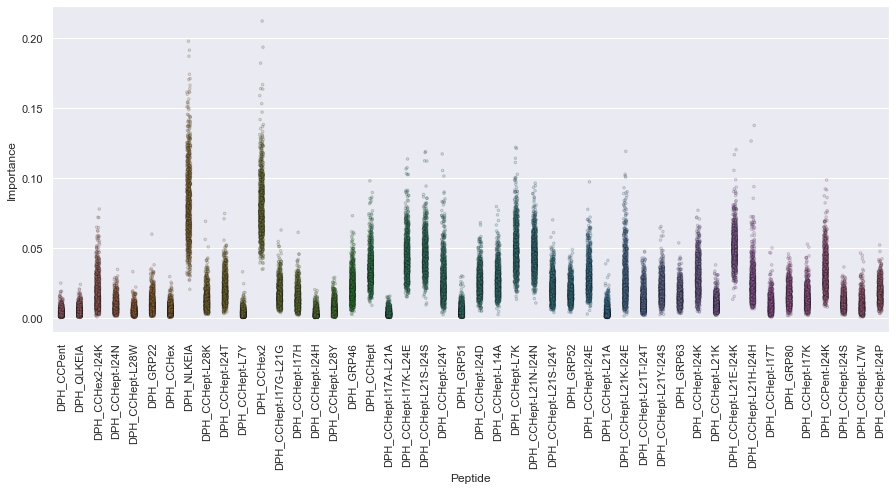

In [15]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_NLKEIA,0.077761
1,DPH_CCHex2,0.076345
2,DPH_CCHept-L21E-I24K,0.049615
3,DPH_CCHept-L7K,0.046885
4,DPH_CCHept-L21N-I24N,0.044125
5,DPH_CCHept-L21S-I24S,0.043427
6,DPH_CCHept-I17K-L24E,0.041236
7,DPH_CCHept,0.033219
8,DPH_CCPent-I24K,0.029965
9,DPH_CCHept-I24K,0.027209


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another, etc..

From this analysis, NLKEIA and CCHex2 are identified as the two most important peptides. Looking back at the box plots above, it is noticeable that both of these peptides have distinctly different ranges of readings for tryptophan as compared to the other four amino acids.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

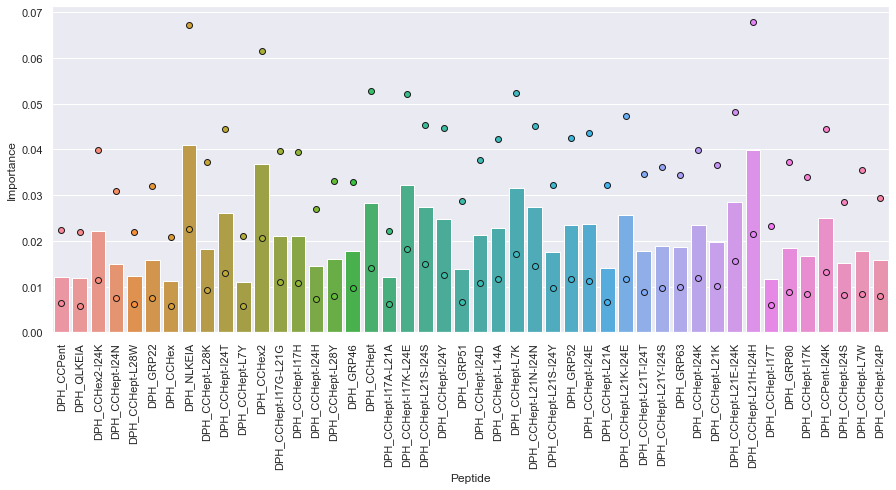

<Figure size 720x720 with 0 Axes>

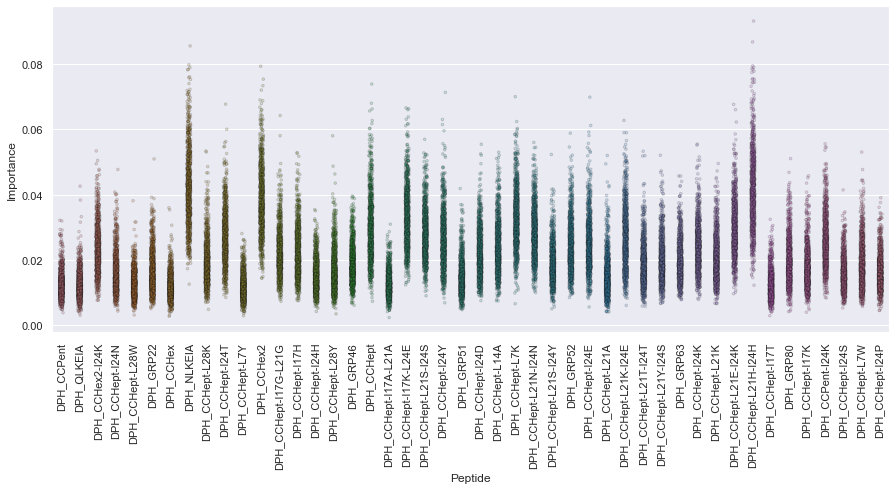

In [17]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [18]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_NLKEIA,0.040983
1,DPH_CCHept-L21H-I24H,0.039881
2,DPH_CCHex2,0.036772
3,DPH_CCHept-I17K-L24E,0.032306
4,DPH_CCHept-L7K,0.031584
5,DPH_CCHept-L21E-I24K,0.028435
6,DPH_CCHept,0.028379
7,DPH_CCHept-L21S-I24S,0.027430
8,DPH_CCHept-L21N-I24N,0.027380
9,DPH_CCHept-I24T,0.026171


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

There is some overlap in the most important peptides identified by the ExtraTrees classifier - again, NLKEIA and CCHex2 have high scores. However, the second highest scoring peptide here, CCHept-L21H-I24H, returns a fairly low importance score in the KBest analysis => the results obtained using the two methods are similar, but not identical.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

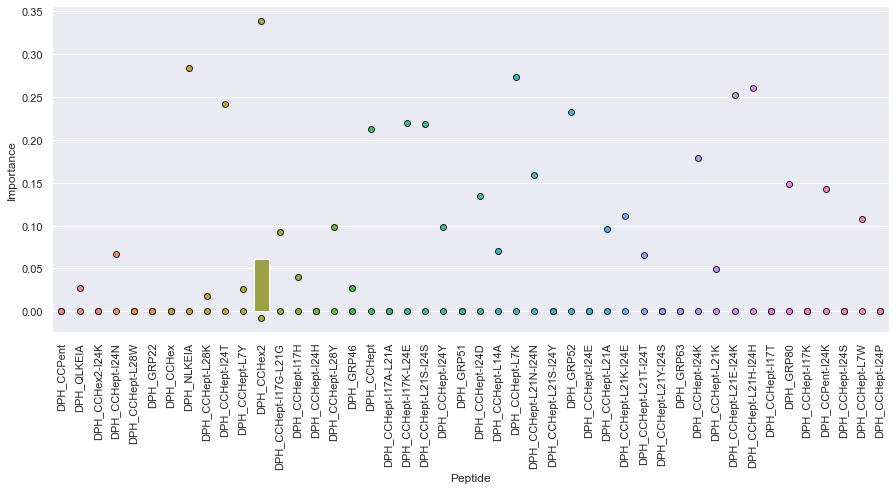

<Figure size 720x720 with 0 Axes>

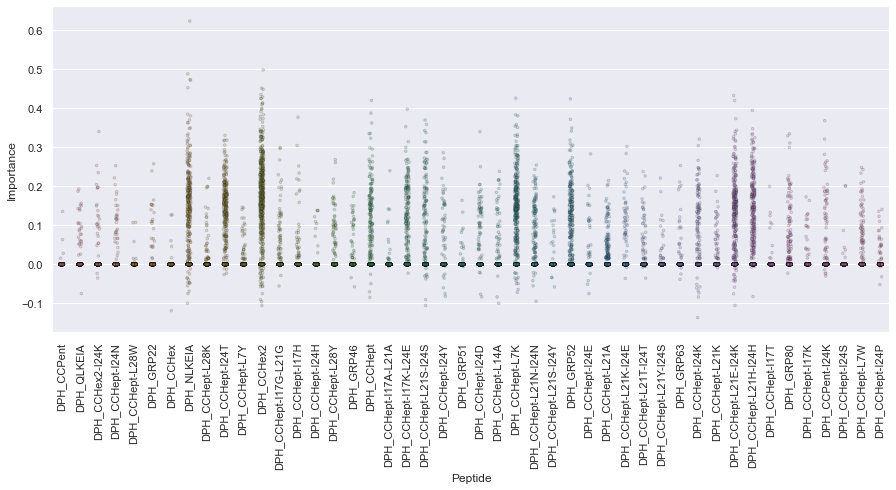

In [19]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1,
    num_repeats=1000, scale=True, plt_name=''
)

In [20]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_CCHex2,0.060511
1,DPH_CCHept-I24K,0.000000
2,DPH_CCHept-L21N-I24N,0.000000
3,DPH_CCHept-L21S-I24Y,0.000000
4,DPH_GRP52,0.000000
5,DPH_CCHept-I24E,0.000000
6,DPH_CCHept-L21A,0.000000
7,DPH_CCHept-L21K-I24E,0.000000
8,DPH_CCHept-L21T-I24T,0.000000
9,DPH_CCHept-L21Y-I24S,0.000000


In [21]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [22]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_CCHex2,0.098416
1,DPH_CCHept-L7K,0.048747
2,DPH_NLKEIA,0.046144
3,DPH_CCHept-I24T,0.040871
4,DPH_CCHept-L21E-I24K,0.040303
5,DPH_CCHept-L21H-I24H,0.036782
6,DPH_GRP52,0.030293
7,DPH_CCHept-I17K-L24E,0.022306
8,DPH_CCHept,0.020419
9,DPH_CCHept-L21S-I24S,0.015902


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

As can be seen from the plots, most of the features provide little unique information about the output class. Again, peptides CCHex2 and (to a lesser extent) NLKEIA are found to be the most important, CCHept-L21H-I24H is also close to the top of the rankings. CCHept-L7K is the second most important peptide identified by permutation analysis; it is also found to be one of the most important peptides by both of the other two methods.

So, whilst there is some variation in the relative order of the less important peptides, overall there is good agreement between the results obtained with all three methods. CCHex2, NLKEIA and CCHept-L7K are found to be three of the most important peptides in the dataset, whilst peptide CCHept-L21H-I24H is also identified as important by the latter two methods. 

- What percentage of the signal in the data can be measured by N principal components?

If there are more features than samples, can't run PCA. Have 45 samples, 46 peptides => need to discard one peptide if want to run PCA. Will discard peptide QLKEIA, given that as described above the fluorescence of QLKEIA and DPH is (by eye) barely distinguishable from that of DPH alone.

/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


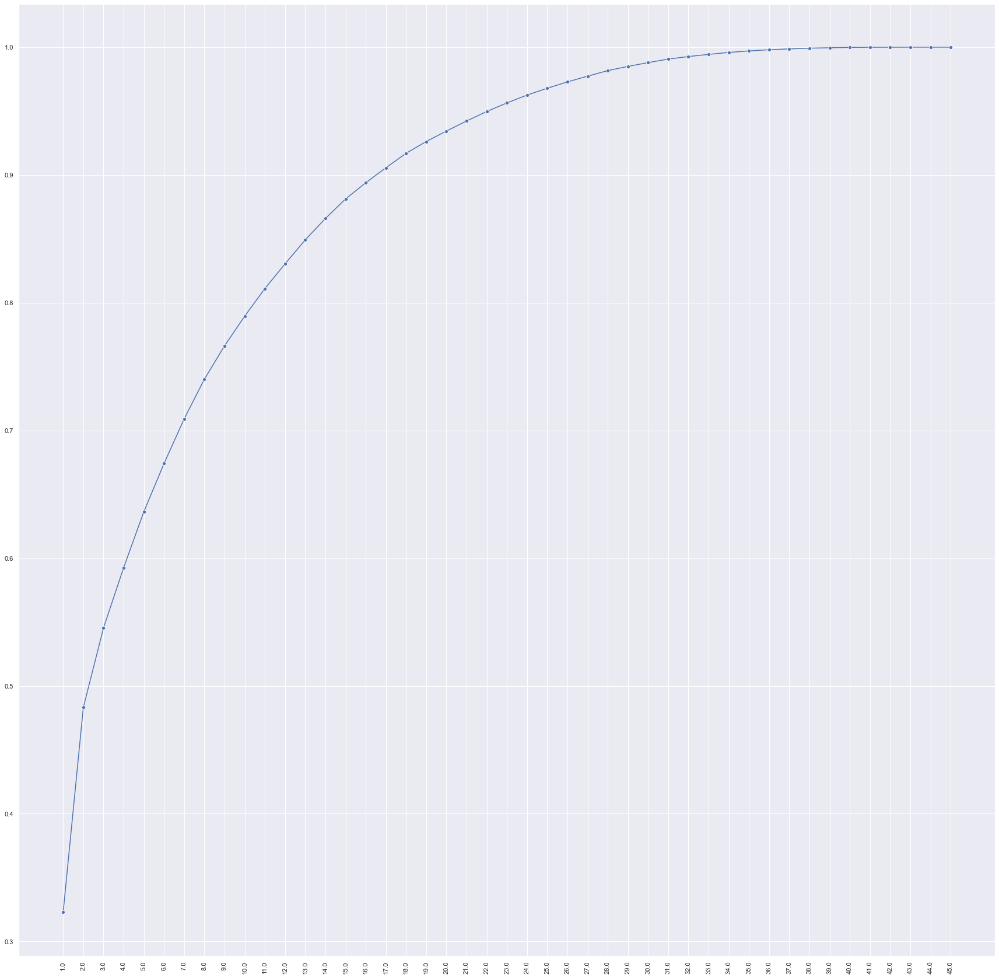

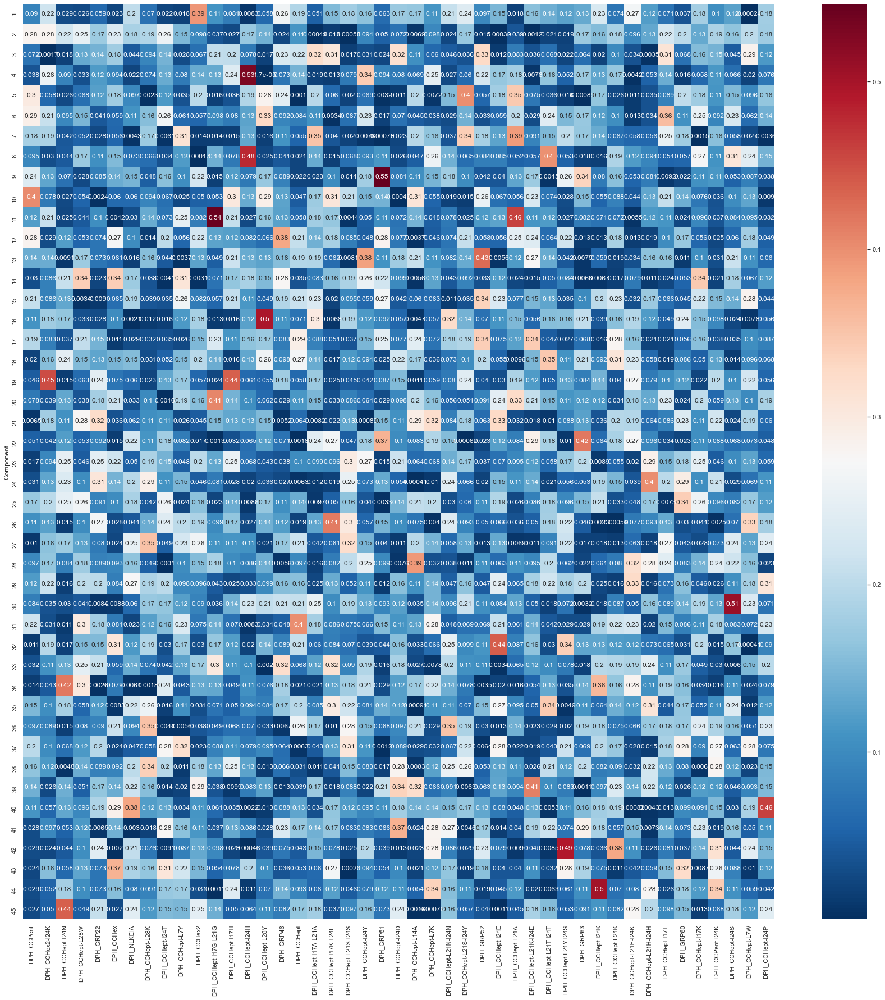

In [23]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(
    fluor_data=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1), scale=True, plt_name=''
)
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

17 components are required to represent >90% of the variance in the data. CCHex2 makes the largest contribution to the first principal component, but several other peptides also make sizeable contributions.

Scatter plots of data transformed to PCA dimensions

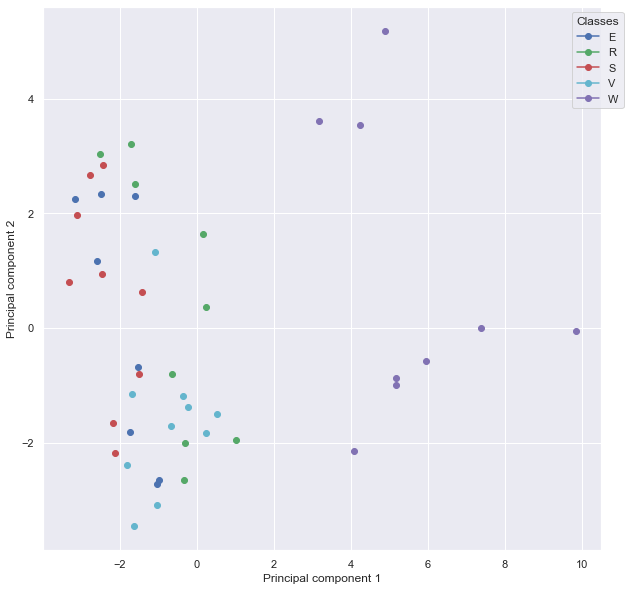

In [24]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=2, scale=True, plt_name=''
)

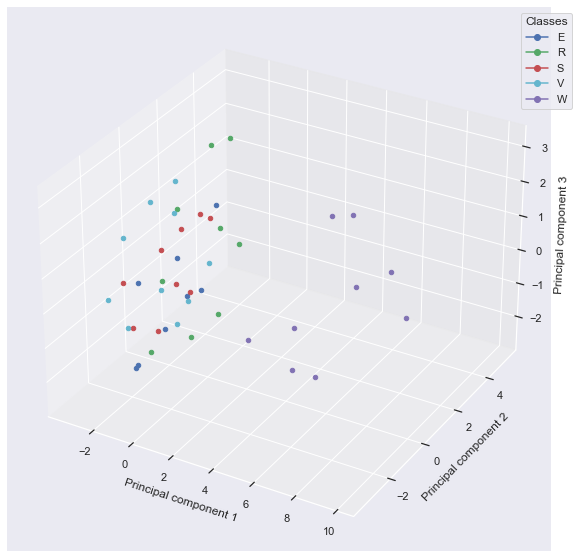

In [25]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter plots of fluorescence readings, tryptophan clusters separately from the other amino acids, whereas the other four are more difficult to distinguish from one another.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

Note that this dataset is very small (only 45 samples), plus contains a large number of classes (5). Accordingly, the sizes of the training and test datasets are also small, and there will be large amounts of noise associated with the metrics used to measure model perfomance (see the standard deviation values below).

In [26]:
algorithms = [LogisticRegression, KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LogisticRegression', 'LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
            n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for index, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.3957672
 0.23733211 0.23733211 0.23733211 0.23733211        nan        nan
 0.08253968        nan        nan        nan 0.23733211 0.26375661
 0.23733211 0.23733211 0.04761905        nan 0.08253968        nan
        nan 0.40410053 0.36742424 0.36742424 0.36742424 0.36742424
        nan        nan 0.08253968        nan        nan        nan
 0.36438191 0.36438191 0.36438191 0.36438191 0.04761905        nan
 0.08253968        nan        nan 0.41150794 0.36438191 0.36438191
 0.39401154 0.39401154        nan        nan 0.08253968        nan
        nan        nan 0.42099567 0.39401154 0.42099567 0.42099567
 0.04761905        nan 0.08253968        nan        nan 0.4292328
 0.4489418  0.4489418  0.4489418  0.4489418         nan        nan
 0.08253968        nan        nan        nan 0.43571429

/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.28082011
 0.20881834 0.19611993 0.20352734 0.20352734        nan        nan
 0.04761905        nan        nan        nan 0.20352734 0.20352734
 0.20352734 0.20352734 0.06507937        nan 0.04761905        nan
        nan 0.28082011 0.246415   0.29116809 0.246415   0.246415
        nan        nan 0.04761905        nan        nan        nan
 0.246415   0.246415   0.246415

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0






LogisticRegression: no_balancing
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31622.776601683792), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'lbfgs')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




LogisticRegression: no_balancing
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'lbfgs')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LogisticRegression: no_balancing
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'

/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.2222222222222222
F1: 0.14814814814814814




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.4444444444444444
F1: 0.39682539682539686




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.4444444444444444
F1: 0.36666666666666664




LinearSVC: no_balancing
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.6666666666666666
F1: 0.6592592592592593




SVC: no_balancing
Par

In [27]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [28]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,LogisticRegression,no_balancing,0.533333,0.083148,0.533333,0.083148,0.517778,0.135181,0.500952,0.103138
1,KNeighborsClassifier,no_balancing,0.533333,0.129577,0.533333,0.129577,0.567513,0.161075,0.507372,0.144760
2,GaussianNB,no_balancing,0.622222,0.150718,0.622222,0.150718,0.614074,0.176172,0.595767,0.155922
3,LinearSVC,no_balancing,0.466667,0.147406,0.466667,0.147406,0.394074,0.191013,0.410476,0.166046
4,SVC,no_balancing,0.555556,0.099381,0.555556,0.099381,0.510370,0.154997,0.509101,0.107419
5,AdaBoostClassifier,no_balancing,0.311111,0.083148,0.311111,0.083148,0.230741,0.074366,0.238730,0.051401


In [29]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

There is quite a lot of variation in model performance - some of the algorithms perform well, especially given the small size of the dataset, the high number of categories, and how similar the fingerprints of four of the amino acids look by eye. One would predict therefore that with a larger dataset a substantial improvement in model performance could be obtained. Algorithm selection has a big effect upon performance - the best performing model has a score (regardless of whether you look at accuracy, precision, recall or F1 score) ~2 greater than the worst performing model. Moreover, because of the small dataset size the standard deviation values associated with these scores are in all cases large. All models however perform better than random guessing (which would yield an accuracy score of ~0.2).

GaussianNB performs best => take this model forwards.

In [30]:
all_feat_searches['GaussianNB__no_balancing']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [31]:
all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [32]:
all_feat_searches['GaussianNB__no_balancing']['test_scores']['accuracy']

[0.5555555555555556,
 0.6666666666666666,
 0.5555555555555556,
 0.8888888888888888,
 0.4444444444444444]

In [33]:
all_feat_nested_pred = all_feat_searches['GaussianNB__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['GaussianNB__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['GaussianNB__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

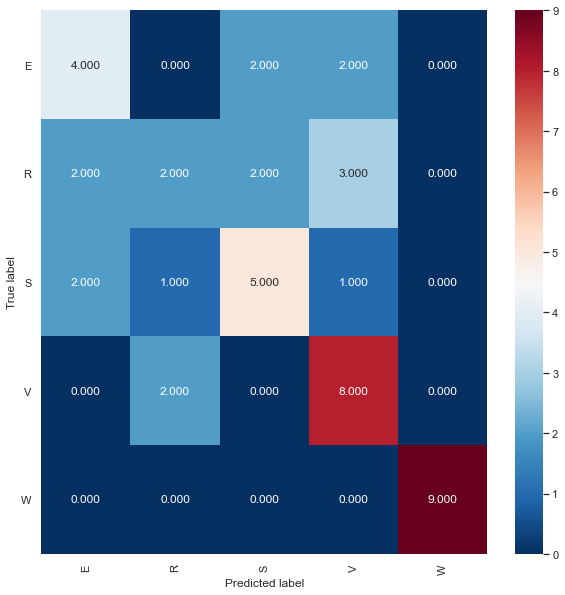

Normalised over true label (rows)


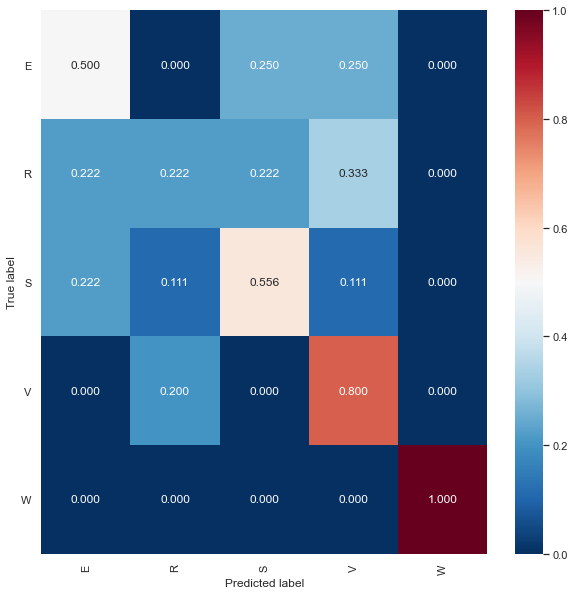

Normalised over pred label (columns)


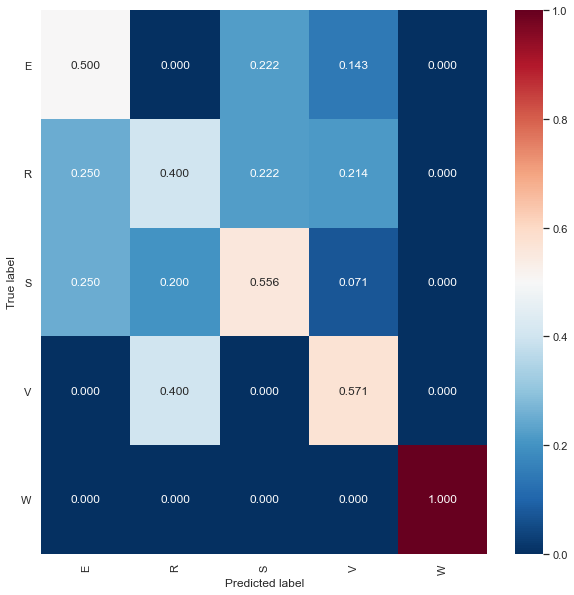

In [34]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [35]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

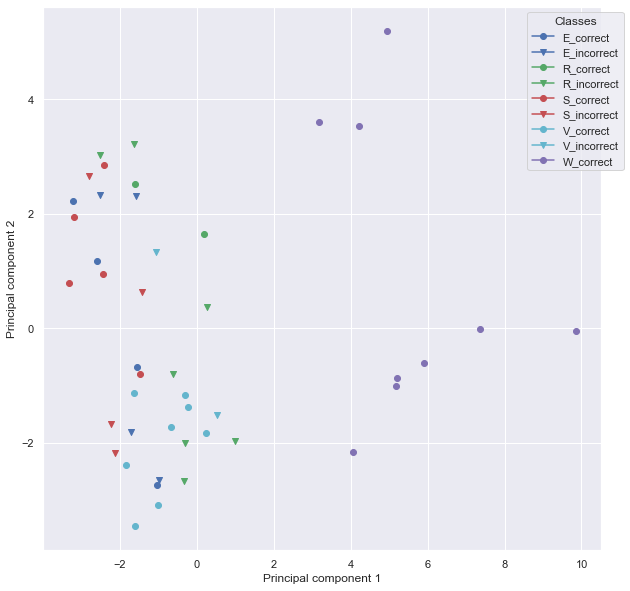

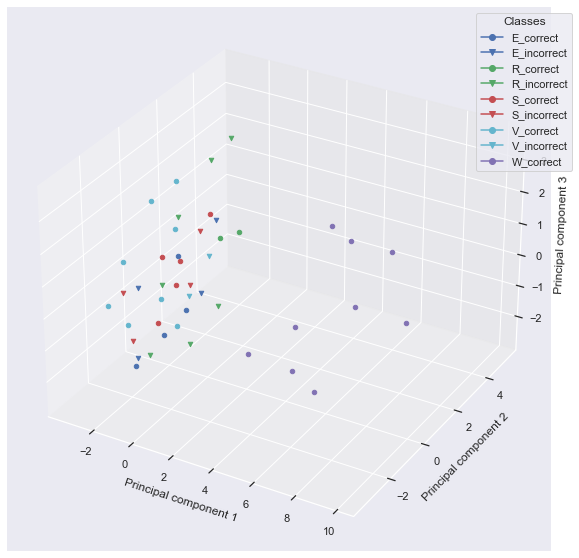

In [36]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

As expected from the earlier analysis in this notebook, the trained model can readily distinguish Trp (there are no false positives or false negatives for Trp). It also is fairly good at identifying Val, whereas it struggles more with Ser, Arg and Glu. There is consequently a rough correlation between an amino acid's hydrophobicity and the ability of the model to identify it. This makes sense - more hydrophobic molecules tend to be more effective at displacing DPH from the peptides, creating a recognisable fingerprint.

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [37]:
algorithms = [LogisticRegression, KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LogisticRegression', 'LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
                    n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.25793651
 0.1035409  0.06507937 0.14862915 0.14862915        nan        nan
 0.08253968        nan        nan        nan 0.06507937 0.06507937
 0.14862915 0.14862915 0.04761905        nan 0.08253968        nan
        nan 0.25952381 0.14862915 0.16608947 0.14862915 0.14862915
        nan        nan 0.08253968        nan        nan        nan
 0.14862915 0.06746032 0.14862915 0.14862915 0.04761905        nan
 0.08253968        nan        nan 0.25952381 0.14862915 0.14862915
 0.14862915 0.14862915        nan        nan 0.08253968        nan
        nan        nan 0.19151682 0.21794132 0.19151682 0.19151682
 0.04761905        nan 0.08253968        nan        nan 0.30350529
 0.22640693 0.22640693 0.22640693 0.22640693        nan        nan
 0.08253968        nan        nan        nan 0.262385

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.18811728
 0.04761905 0.07738095 0.12461119 0.12461119        nan        nan
 0.04761905        nan        nan        nan 0.04761905 0.05026455
 0.12461119 0.12461119 0.06507937        nan 0.04761905        nan
        nan 0.18811728 0.13506494 0.08730159 0.12461119 0.12461119
        nan        nan 0.04761905        nan        nan        nan
 0.12461119 0.08531746 0.12461119 0.12461119 0.06507937        nan
 0.04761905        nan        nan 0.18811728 0.10440917 0.13218695
 0.12461119 0.12461119        nan        nan 0.04761905        nan
        nan        nan 0.12461119 0.14761905 0.12461119 0.12461119
 0.06507937        nan 0.04761905        nan        nan 0.18811728
 0.16749886 0.16749886 0.16749886 0.16749886        nan        nan
 0.04761905        nan        nan        nan 0.193923





LogisticRegression: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.4158730158730159




LogisticRegression: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




LogisticRegression: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'newton-cg')])
Accuracy: 0.4444444444444444
F1: 0.4296296296296296




LogisticRegression: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.22839506
 0.06507937 0.06507937 0.11552028 0.11552028        nan        nan
 0.08253968        nan        nan        nan 0.13359788 0.17896825
 0.11552028 0.11552028 0.04761905        nan 0.08253968        nan
        nan 0.22839506 0.11552028 0.11552028 0.11552028 0.11552028
        nan        nan 0.08253968        nan        nan        nan
 0.11552028 0.1957672  0.11552028 0.11552028 0.04761905        nan
 0.08253968        nan        nan 0.22839506 0.2281746  0.19329806
 0.19329806 0.19329806        nan        nan 0.08253968        nan
        nan        nan 0.2281746  0.2281746  0.2281746  0.2281746
 0.04761905        nan 0.08253968        nan        nan 0.27160494
 0.28214286 0.28214286 0.28214286 0.28214286        nan        nan
 0.08253968        nan        nan        nan 0.2786596

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.17819665
 0.13156966 0.05026455 0.20445326 0.20445326        nan        nan
 0.04761905        nan        nan        nan 0.09700176 0.16137566
 0.20445326 0.20445326 0.06507937        nan 0.04761905        nan
        nan 0.17819665 0.20198413 0.19828042 0.20445326 0.20445326
        nan        nan 0.04761905        nan        nan        nan
 0.19365079 0.18223104 0.20445326 0.20445326 0.06507937        nan
 0.04761905        nan        nan 0.18128307 0.24147673 0.24734093
 0.24734093 0.24734093        nan        nan 0.04761905        nan
        nan        nan 0.19734093 0.22820513 0.19734093 0.19734093
 0.06507937        nan 0.04761905        nan        nan 0.22691799
 0.2421156  0.2421156  0.2421156  0.2421156         nan        nan
 0.04761905        nan        nan        nan 0.302741





LogisticRegression: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LogisticRegression: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LogisticRegression: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.4296296296296296




LogisticRegression: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.6227766016

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.37314815
 0.14980159 0.14484127 0.14980159 0.14980159        nan        nan
 0.08253968        nan        nan        nan 0.17896825 0.15119048
 0.14980159 0.14980159 0.04761905        nan 0.08253968        nan
        nan 0.37314815 0.14980159 0.14980159 0.14980159 0.14980159
        nan        nan 0.08253968        nan        nan        nan
 0.14980159 0.21276455 0.14980159 0.14980159 0.04761905        nan
 0.08253968        nan        nan 0.37314815 0.27000361 0.27000361
 0.27000361 0.27000361        nan        nan 0.08253968        nan
        nan        nan 0.2646164  0.2646164  0.2646164  0.2646164
 0.04761905        nan 0.08253968        nan        nan 0.36600529
 0.33306878 0.33306878 0.33306878 0.33306878        nan        nan
 0.08253968        nan        nan        nan 0.3317460

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.21212522
 0.14038801 0.21354417 0.31111111 0.31111111        nan        nan
 0.04761905        nan        nan        nan 0.15927128 0.18932981
 0.31111111 0.31111111 0.04761905        nan 0.04761905        nan
        nan 0.21212522 0.21464646 0.21464646 0.31111111 0.31111111
        nan        nan 0.04761905        nan        nan        nan
 0.28580247 0.28580247 0.31111111 0.31111111 0.04761905        nan
 0.04761905        nan        nan 0.21212522 0.38240741 0.38240741
 0.38240741 0.38240741        nan        nan 0.04761905        nan
        nan        nan 0.4154321  0.4154321  0.4154321  0.4154321
 0.04761905        nan 0.04761905        nan        nan 0.24175485
 0.43580247 0.43580247 0.43580247 0.43580247        nan        nan
 0.04761905        nan        nan        nan 0.4389770

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.2656746
 0.18293651 0.07248677 0.19126984 0.19126984        nan        nan
 0.04761905        nan        nan        nan 0.14770723 0.1542328
 0.19126984 0.19126984 0.06507937        nan 0.04761905        nan
        nan 0.26011905 0.19126984 0.19126984 0.19126984 0.19126984
        nan        nan 0.04761905        nan        nan        nan
 0.19126984 0.19126984 0.19126984 0.19126984 0.06507937        nan
 0.04761905        nan        nan 0.26011905 0.19126984 0.19126984
 0.19126984 0.19126984        nan        nan 0.04761905        nan
        nan        nan 0.22156085 0.22156085 0.22156085 0.22156085
 0.06507937        nan 0.04761905        nan        nan 0.26011905
 0.33104858 0.33104858 0.33104858 0.33104858        nan        nan
 0.04761905        nan        nan        nan 0.32734488





LogisticRegression: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 316.22776601683796), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LogisticRegression: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




LogisticRegression: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.43234127
 0.16931217 0.16931217 0.16931217 0.16931217        nan        nan
 0.08253968        nan        nan        nan 0.20436508 0.20072751
 0.16931217 0.16931217 0.04761905        nan 0.08253968        nan
        nan 0.43234127 0.16931217 0.16931217 0.16931217 0.16931217
        nan        nan 0.08253968        nan        nan        nan
 0.21219984 0.23862434 0.21219984 0.21219984 0.04761905        nan
 0.08253968        nan        nan 0.43234127 0.32433261 0.30574796
 0.30574796 0.30574796        nan        nan 0.08253968        nan
        nan        nan 0.36169232 0.36169232 0.36169232 0.36169232
 0.04761905        nan 0.08253968        nan        nan 0.45191799
 0.37989418 0.37989418 0.37989418 0.37989418        nan        nan
 0.08253968        nan        nan        nan 0.428835

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.33029101
 0.26710758 0.2122575  0.28095238 0.28095238        nan        nan
 0.04761905        nan        nan        nan 0.20302383 0.31957672
 0.28095238 0.28095238 0.04761905        nan 0.04761905        nan
        nan 0.35992063 0.28095238 0.28095238 0.28095238 0.28095238
        nan        nan 0.04761905        nan        nan        nan
 0.28095238 0.28095238 0.28095238 0.28095238 0.04761905        nan
 0.04761905        nan        nan 0.39728836 0.35224868 0.35224868
 0.35224868 0.35224868        nan        nan 0.04761905        nan
        nan        nan 0.35502646 0.35224868 0.35502646 0.35502646
 0.04761905        nan 0.04761905        nan        nan 0.39728836
 0.40008818 0.40008818 0.37539683 0.40008818        nan        nan
 0.04761905        nan        nan        nan 0.442526





LogisticRegression: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.3862433862433863




LogisticRegression: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




LogisticRegression: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.35185185185185186




LogisticRegression: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.3162

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.38670635
 0.17063492 0.17063492 0.17063492 0.17063492        nan        nan
 0.08253968        nan        nan        nan 0.14021164 0.13498677
 0.17063492 0.17063492 0.04761905        nan 0.08253968        nan
        nan 0.38670635 0.17063492 0.21352259 0.17063492 0.17063492
        nan        nan 0.08253968        nan        nan        nan
 0.23994709 0.25829726 0.23994709 0.23994709 0.04761905        nan
 0.08253968        nan        nan 0.39305556 0.3016835  0.3016835
 0.3016835  0.3016835         nan        nan 0.08253968        nan
        nan        nan 0.3458193  0.3458193  0.3458193  0.3458193
 0.04761905        nan 0.08253968        nan        nan 0.39702381
 0.36402116 0.36402116 0.36402116 0.36402116        nan        nan
 0.08253968        nan        nan        nan 0.4010582 

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.28593474
 0.1957672  0.1957672  0.26388889 0.26388889        nan        nan
 0.04761905        nan        nan        nan 0.24309117 0.32993827
 0.26388889 0.26388889 0.04761905        nan 0.04761905        nan
        nan 0.33068783 0.26388889 0.26111111 0.26388889 0.26388889
        nan        nan 0.04761905        nan        nan        nan
 0.26388889 0.26388889 0.26388889 0.26388889 0.04761905        nan
 0.04761905        nan        nan 0.33068783 0.35555556 0.35555556
 0.35555556 0.35555556        nan        nan 0.04761905        nan
        nan        nan 0.35555556 0.35555556 0.35555556 0.35555556
 0.04761905        nan 0.04761905        nan        nan 0.3505291
 0.44484127 0.44484127 0.44484127 0.44484127        nan        nan
 0.04761905        nan        nan        nan 0.4706349

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.32978395
 0.19239418 0.15656966 0.24801587 0.24801587        nan        nan
 0.04761905        nan        nan        nan 0.20039683 0.24087302
 0.24801587 0.24801587 0.06507937        nan 0.04761905        nan
        nan 0.32978395 0.24537037 0.27363316 0.24801587 0.24801587
        nan        nan 0.04761905        nan        nan        nan
 0.24801587 0.24801587 0.24801587 0.24801587 0.06507937        nan
 0.04761905        nan        nan 0.3664903  0.24801587 0.24801587
 0.24801587 0.24801587        nan        nan 0.04761905        nan
        nan        nan 0.31732804 0.31732804 0.31732804 0.31732804
 0.06507937        nan 0.04761905        nan        nan 0.35198413
 0.33567821 0.33567821 0.33567821 0.33567821        nan        nan
 0.04761905        nan        nan        nan 0.357503





LogisticRegression: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LogisticRegression: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.36666666666666664




LogisticRegression: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.44556878
 0.16428571 0.16428571 0.17063492 0.17063492        nan        nan
 0.08253968        nan        nan        nan 0.21706349 0.17063492
 0.17063492 0.17063492 0.04761905        nan 0.08253968        nan
        nan 0.49093915 0.2965553  0.2965553  0.2965553  0.2965553
        nan        nan 0.08253968        nan        nan        nan
 0.30707071 0.30707071 0.30707071 0.30707071 0.04761905        nan
 0.08253968        nan        nan 0.52334656 0.34361472 0.34361472
 0.34361472 0.34361472        nan        nan 0.08253968        nan
        nan        nan 0.3458193  0.34057239 0.3458193  0.3458193
 0.04761905        nan 0.08253968        nan        nan 0.58121693
 0.41640212 0.41640212 0.41640212 0.41640212        nan        nan
 0.08253968        nan        nan        nan 0.41640212

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.42896825
 0.27380952 0.22465528 0.30753968 0.30753968        nan        nan
 0.04761905        nan        nan        nan 0.27632275 0.34880952
 0.30753968 0.30753968 0.04761905        nan 0.04761905        nan
        nan 0.42896825 0.30753968 0.28549383 0.30753968 0.30753968
        nan        nan 0.04761905        nan        nan        nan
 0.41666667 0.41666667 0.3968254  0.3968254  0.04761905        nan
 0.04761905        nan        nan 0.4662037  0.44484127 0.44484127
 0.44484127 0.44484127        nan        nan 0.04761905        nan
        nan        nan 0.4292328  0.4292328  0.4292328  0.4292328
 0.04761905        nan 0.04761905        nan        nan 0.49027778
 0.4292328  0.4292328  0.4292328  0.4292328         nan        nan
 0.04761905        nan        nan        nan 0.4292328





LogisticRegression: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




LogisticRegression: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1000.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'newton-cg')])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




LogisticRegression: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.49285714
 0.21613757 0.21613757 0.21613757 0.21613757        nan        nan
 0.08253968        nan        nan        nan 0.21613757 0.21613757
 0.21613757 0.21613757 0.04761905        nan 0.08253968        nan
        nan 0.47804233 0.35257335 0.35257335 0.35257335 0.35257335
        nan        nan 0.08253968        nan        nan        nan
 0.34718615 0.34718615 0.34718615 0.34718615 0.04761905        nan
 0.08253968        nan        nan 0.51970899 0.39595158 0.39595158
 0.39595158 0.39595158        nan        nan 0.08253968        nan
        nan        nan 0.39595158 0.39595158 0.39595158 0.39595158
 0.04761905        nan 0.08253968        nan        nan 0.54113757
 0.42945326 0.42945326 0.42945326 0.42945326        nan        nan
 0.08253968        nan        nan        nan 0.429453

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.4156746
 0.27261905 0.29642857 0.29642857 0.29642857        nan        nan
 0.04761905        nan        nan        nan 0.3228836  0.29444444
 0.29642857 0.30357143 0.04761905        nan 0.04761905        nan
        nan 0.4156746  0.34007937 0.33809524 0.3452381  0.3452381
        nan        nan 0.04761905        nan        nan        nan
 0.33333333 0.33333333 0.33333333 0.33333333 0.04761905        nan
 0.04761905        nan        nan 0.46441799 0.38134921 0.38134921
 0.38134921 0.38134921        nan        nan 0.04761905        nan
        nan        nan 0.4005291  0.4005291  0.4005291  0.4005291
 0.04761905        nan 0.04761905        nan        nan 0.46441799
 0.4005291  0.4005291  0.4005291  0.4005291         nan        nan
 0.04761905        nan        nan        nan 0.43683862 

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.36521164
 0.24215168 0.24215168 0.24215168 0.24215168        nan        nan
 0.04761905        nan        nan        nan 0.19867725 0.24215168
 0.24215168 0.24215168 0.06507937        nan 0.04761905        nan
        nan 0.36428571 0.24215168 0.24215168 0.24215168 0.24215168
        nan        nan 0.04761905        nan        nan        nan
 0.24215168 0.24215168 0.24215168 0.24215168 0.06507937        nan
 0.04761905        nan        nan 0.3510582  0.3405283  0.3405283
 0.3405283  0.3405283         nan        nan 0.04761905        nan
        nan        nan 0.36345599 0.36345599 0.36345599 0.36345599
 0.06507937        nan 0.04761905        nan        nan 0.37354497
 0.31653439 0.31653439 0.31653439 0.31653439        nan        nan
 0.04761905        nan        nan        nan 0.3370370





LogisticRegression: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.5555555555555556
F1: 0.6074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LogisticRegression: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class'

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.46626984
 0.17724868 0.17724868 0.17724868 0.17724868        nan        nan
 0.08253968        nan        nan        nan 0.17724868 0.17724868
 0.17724868 0.17724868 0.04761905        nan 0.08253968        nan
        nan 0.46626984 0.30459355 0.30459355 0.30459355 0.30459355
        nan        nan 0.08253968        nan        nan        nan
 0.35022848 0.35022848 0.35022848 0.35022848 0.04761905        nan
 0.08253968        nan        nan 0.46626984 0.35022848 0.35022848
 0.35022848 0.35022848        nan        nan 0.08253968        nan
        nan        nan 0.38078403 0.38078403 0.40776816 0.40776816
 0.04761905        nan 0.08253968        nan        nan 0.49391534
 0.42367725 0.42367725 0.42367725 0.42367725        nan        nan
 0.08253968        nan        nan        nan 0.462698

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.50324074
 0.29722222 0.26635802 0.29722222 0.29722222        nan        nan
 0.04761905        nan        nan        nan 0.32103175 0.32103175
 0.29722222 0.29722222 0.04761905        nan 0.04761905        nan
        nan 0.52242063 0.34007937 0.34087302 0.34007937 0.34007937
        nan        nan 0.04761905        nan        nan        nan
 0.36388889 0.36388889 0.34007937 0.34007937 0.04761905        nan
 0.04761905        nan        nan 0.52387566 0.41904762 0.45886243
 0.46468254 0.46468254        nan        nan 0.04761905        nan
        nan        nan 0.4848545  0.4848545  0.4848545  0.4848545
 0.04761905        nan 0.04761905        nan        nan 0.54391534
 0.48531746 0.48531746 0.48531746 0.48531746        nan        nan
 0.04761905        nan        nan        nan 0.4697089

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.45846561
 0.27142857 0.27142857 0.27142857 0.27142857        nan        nan
 0.04761905        nan        nan        nan 0.25820106 0.25820106
 0.27142857 0.27142857 0.06507937        nan 0.04761905        nan
        nan 0.45694444 0.25820106 0.27142857 0.25820106 0.25820106
        nan        nan 0.04761905        nan        nan        nan
 0.25820106 0.25820106 0.25820106 0.25820106 0.06507937        nan
 0.04761905        nan        nan 0.45694444 0.37063492 0.37063492
 0.37063492 0.37063492        nan        nan 0.04761905        nan
        nan        nan 0.41199295 0.41199295 0.41199295 0.41199295
 0.06507937        nan 0.04761905        nan        nan 0.45694444
 0.42169312 0.42169312 0.42169312 0.42169312        nan        nan
 0.04761905        nan        nan        nan 0.424338





LogisticRegression: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




LogisticRegression: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.5555555555555556
F1: 0.4259259259259259




LogisticRegression: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LogisticRegression: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class'

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.48095238
 0.1957672  0.23865486 0.1957672  0.1957672         nan        nan
 0.08253968        nan        nan        nan 0.23865486 0.23865486
 0.23865486 0.23865486 0.04761905        nan 0.08253968        nan
        nan 0.46137566 0.36874699 0.36874699 0.36874699 0.36874699
        nan        nan 0.08253968        nan        nan        nan
 0.36874699 0.36874699 0.36874699 0.36874699 0.04761905        nan
 0.08253968        nan        nan 0.5010582  0.36967292 0.36967292
 0.36967292 0.36967292        nan        nan 0.08253968        nan
        nan        nan 0.42628668 0.42628668 0.42628668 0.42628668
 0.04761905        nan 0.08253968        nan        nan 0.50568783
 0.45855379 0.45855379 0.45855379 0.45855379        nan        nan
 0.08253968        nan        nan        nan 0.394179

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.49768519
 0.34144621 0.34246032 0.34858907 0.34858907        nan        nan
 0.04761905        nan        nan        nan 0.34488536 0.34488536
 0.34858907 0.34858907 0.04761905        nan 0.04761905        nan
        nan 0.49689153 0.39179894 0.39179894 0.39179894 0.39179894
        nan        nan 0.04761905        nan        nan        nan
 0.44404762 0.44404762 0.44404762 0.44404762 0.04761905        nan
 0.04761905        nan        nan 0.49689153 0.46335979 0.43809524
 0.46335979 0.46335979        nan        nan 0.04761905        nan
        nan        nan 0.46335979 0.46335979 0.46335979 0.46335979
 0.04761905        nan 0.04761905        nan        nan 0.53915344
 0.46891534 0.46335979 0.46891534 0.46891534        nan        nan
 0.04761905        nan        nan        nan 0.463359





LogisticRegression: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.6666666666666666
F1: 0.6222222222222222




LogisticRegression: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.5555555555555556
F1: 0.4259259259259259




LogisticRegression: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




LogisticRegression: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.3957672
 0.23733211 0.23733211 0.23733211 0.23733211        nan        nan
 0.08253968        nan        nan        nan 0.23733211 0.26375661
 0.23733211 0.23733211 0.04761905        nan 0.08253968        nan
        nan 0.40410053 0.36742424 0.36742424 0.36742424 0.36742424
        nan        nan 0.08253968        nan        nan        nan
 0.36438191 0.36438191 0.36438191 0.36438191 0.04761905        nan
 0.08253968        nan        nan 0.41150794 0.36438191 0.36438191
 0.39401154 0.39401154        nan        nan 0.08253968        nan
        nan        nan 0.42099567 0.39401154 0.42099567 0.42099567
 0.04761905        nan 0.08253968        nan        nan 0.4292328
 0.4489418  0.4489418  0.4489418  0.4489418         nan        nan
 0.08253968        nan        nan        nan 0.43571429

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0




/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.28082011
 0.20881834 0.19611993 0.20352734 0.20352734        nan        nan
 0.04761905        nan        nan        nan 0.20352734 0.20352734
 0.20352734 0.20352734 0.06507937        nan 0.04761905        nan
        nan 0.28082011 0.246415   0.29116809 0.246415   0.246415
        nan        nan 0.04761905        nan        nan        nan
 0.246415   0.246415   0.246415   0.246415   0.06507937        nan
 0.04761905        nan        nan 0.28611111 0.32561728 0.32561728
 0.32561728 0.32561728        nan        nan 0.04761905        nan
        nan        nan 0.34714206 0.34714206 0.34714206 0.34714206
 0.06507937        nan 0.04761905        nan        nan 0.31574074
 0.29034392 0.29034392 0.29034392 0.29034392        nan        nan
 0.04761905        nan        nan        nan 0.29034392

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0




/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.36613757
 0.27043651 0.27936508 0.28154762 0.28154762        nan        nan
 0.04761905        nan        nan        nan 0.28154762 0.28154762
 0.28154762 0.28154762 0.06507937        nan 0.04761905        nan
        nan 0.36613757 0.28154762 0.28154762 0.28154762 0.28154762
        nan        nan 0.04761905        nan        nan        nan
 0.32585979 0.35254329 0.32585979 0.32585979 0.06507937        nan
 0.04761905        nan        nan 0.37407407 0.38710317 0.38710317
 0.38710317 0.38710317        nan        nan 0.04761905        nan
        nan        nan 0.38339947 0.38339947 0.38339947 0.38339947
 0.06507937        nan 0.04761905        nan        nan 0.3337963
 0.34768519 0.34768519 0.34768519 0.34768519        nan        nan
 0.04761905        nan        nan        nan 0.3664682

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0






LogisticRegression: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31622.776601683792), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'lbfgs')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




LogisticRegression: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'lbfgs')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LogisticRegression: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.18503086
 0.13359788 0.06507937 0.12539683 0.12539683        nan        nan
 0.08253968        nan        nan        nan 0.06507937 0.07020757
 0.12539683 0.12539683 0.04761905        nan 0.08253968        nan
        nan 0.18503086 0.12539683 0.04761905 0.12539683 0.12539683
        nan        nan 0.08253968        nan        nan        nan
 0.12539683 0.10813492 0.12539683 0.12539683 0.04761905        nan
 0.08253968        nan        nan 0.18503086 0.19470899 0.22294372
 0.19470899 0.19470899        nan        nan 0.08253968        nan
        nan        nan 0.2031746  0.2031746  0.2031746  0.2031746
 0.04761905        nan 0.08253968        nan        nan 0.20383598
 0.28253968 0.23359788 0.23359788 0.23359788        nan        nan
 0.08253968        nan        nan        nan 0.2825396

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.25088183
 0.13878714 0.13854417 0.1516835  0.1516835         nan        nan
 0.04761905        nan        nan        nan 0.08359233 0.05892256
 0.1516835  0.1516835  0.04761905        nan 0.04761905        nan
        nan 0.25088183 0.15707071 0.28143739 0.1516835  0.1516835
        nan        nan 0.04761905        nan        nan        nan
 0.1537037  0.12309049 0.1516835  0.1516835  0.04761905        nan
 0.04761905        nan        nan 0.25088183 0.1516835  0.23656559
 0.1516835  0.1516835         nan        nan 0.04761905        nan
        nan        nan 0.19982363 0.27729277 0.19982363 0.19982363
 0.04761905        nan 0.04761905        nan        nan 0.25088183
 0.32279541 0.32098765 0.28765432 0.28765432        nan        nan
 0.04761905        nan        nan        nan 0.3536596

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.19241623
 0.14700176 0.07231041 0.11569665 0.11569665        nan        nan
 0.04761905        nan        nan        nan 0.08587709 0.07539128
 0.11569665 0.11569665 0.06507937        nan 0.04761905        nan
        nan 0.19241623 0.11569665 0.10291005 0.11569665 0.11569665
        nan        nan 0.04761905        nan        nan        nan
 0.11569665 0.13068783 0.11569665 0.11569665 0.06507937        nan
 0.04761905        nan        nan 0.19241623 0.11569665 0.11569665
 0.11569665 0.11569665        nan        nan 0.04761905        nan
        nan        nan 0.11878307 0.11569665 0.11878307 0.11878307
 0.06507937        nan 0.04761905        nan        nan 0.19406966
 0.12275132 0.12275132 0.12275132 0.12275132        nan        nan
 0.04761905        nan        nan        nan 0.165638





LogisticRegression: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




LogisticRegression: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.4148148148148148




LogisticRegression: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.37037037037037035




LogisticRegression: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C',

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.34933862
 0.11428571 0.06507937 0.21322751 0.21322751        nan        nan
 0.08253968        nan        nan        nan 0.15582011 0.15582011
 0.21322751 0.21322751 0.04761905        nan 0.08253968        nan
        nan 0.34933862 0.21322751 0.18941799 0.21322751 0.21322751
        nan        nan 0.08253968        nan        nan        nan
 0.21322751 0.18941799 0.21322751 0.21322751 0.04761905        nan
 0.08253968        nan        nan 0.34933862 0.27708033 0.30088985
 0.30088985 0.30088985        nan        nan 0.08253968        nan
        nan        nan 0.30088985 0.30088985 0.30088985 0.30088985
 0.04761905        nan 0.08253968        nan        nan 0.38108466
 0.29222629 0.29222629 0.29222629 0.29222629        nan        nan
 0.08253968        nan        nan        nan 0.321428

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.36992945
 0.13068783 0.07353141 0.38928571 0.38928571        nan        nan
 0.04761905        nan        nan        nan 0.10859788 0.09683341
 0.38928571 0.3531746  0.04761905        nan 0.04761905        nan
        nan 0.36992945 0.3531746  0.38928571 0.38928571 0.38928571
        nan        nan 0.04761905        nan        nan        nan
 0.3531746  0.38928571 0.38928571 0.38928571 0.04761905        nan
 0.04761905        nan        nan 0.41124339 0.38928571 0.38928571
 0.38928571 0.38928571        nan        nan 0.04761905        nan
        nan        nan 0.3968254  0.43293651 0.43293651 0.43293651
 0.04761905        nan 0.04761905        nan        nan 0.41124339
 0.48095238 0.48095238 0.48095238 0.48095238        nan        nan
 0.04761905        nan        nan        nan 0.480952

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.27751323
 0.04761905 0.04761905 0.23068783 0.23068783        nan        nan
 0.04761905        nan        nan        nan 0.13465608 0.13686067
 0.23068783 0.27482363 0.06507937        nan 0.04761905        nan
        nan 0.32010582 0.27482363 0.18624339 0.23068783 0.23068783
        nan        nan 0.04761905        nan        nan        nan
 0.23068783 0.23690476 0.27482363 0.27482363 0.06507937        nan
 0.04761905        nan        nan 0.32010582 0.27482363 0.27482363
 0.27482363 0.27482363        nan        nan 0.04761905        nan
        nan        nan 0.27667549 0.27482363 0.27667549 0.27667549
 0.06507937        nan 0.04761905        nan        nan 0.34927249
 0.34598765 0.34598765 0.34598765 0.34598765        nan        nan
 0.04761905        nan        nan        nan 0.364337





LogisticRegression: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




LogisticRegression: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.4148148148148148




LogisticRegression: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.6666666666666666
F1: 0.6074074074074074




LogisticRegression: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.35200617
 0.1468254  0.13831169 0.1468254  0.18941799        nan        nan
 0.08253968        nan        nan        nan 0.15608466 0.15396825
 0.1468254  0.1468254  0.04761905        nan 0.08253968        nan
        nan 0.35200617 0.1468254  0.1468254  0.1468254  0.1468254
        nan        nan 0.08253968        nan        nan        nan
 0.1468254  0.23230566 0.18941799 0.1468254  0.04761905        nan
 0.08253968        nan        nan 0.35200617 0.27708033 0.27708033
 0.27708033 0.27708033        nan        nan 0.08253968        nan
        nan        nan 0.26719577 0.26719577 0.26719577 0.26719577
 0.04761905        nan 0.08253968        nan        nan 0.37819665
 0.35934744 0.35934744 0.35934744 0.35934744        nan        nan
 0.08253968        nan        nan        nan 0.3733465

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.26845238
 0.18677249 0.05148555 0.23253968 0.23253968        nan        nan
 0.04761905        nan        nan        nan 0.15560366 0.17354497
 0.23253968 0.23253968 0.06507937        nan 0.04761905        nan
        nan 0.26845238 0.2547619  0.2359127  0.23253968 0.23253968
        nan        nan 0.04761905        nan        nan        nan
 0.23253968 0.21633598 0.23253968 0.23253968 0.06507937        nan
 0.04761905        nan        nan 0.26845238 0.27542735 0.27542735
 0.27542735 0.27542735        nan        nan 0.04761905        nan
        nan        nan 0.27542735 0.27542735 0.27542735 0.27542735
 0.06507937        nan 0.04761905        nan        nan 0.3521164
 0.32020202 0.32020202 0.32020202 0.32020202        nan        nan
 0.04761905        nan        nan        nan 0.3202020





LogisticRegression: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




LogisticRegression: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.3333333333333333
F1: 0.26666666666666666




LogisticRegression: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




LogisticRegression: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1),

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.43525132
 0.18650794 0.18650794 0.18650794 0.18650794        nan        nan
 0.08253968        nan        nan        nan 0.20667989 0.18650794
 0.18650794 0.18650794 0.04761905        nan 0.08253968        nan
        nan 0.43525132 0.18650794 0.2293956  0.18650794 0.18650794
        nan        nan 0.08253968        nan        nan        nan
 0.2293956  0.2293956  0.2293956  0.2293956  0.04761905        nan
 0.08253968        nan        nan 0.43525132 0.26428571 0.26428571
 0.26428571 0.26428571        nan        nan 0.08253968        nan
        nan        nan 0.26428571 0.26428571 0.26428571 0.26428571
 0.04761905        nan 0.08253968        nan        nan 0.45899471
 0.37539683 0.37539683 0.37539683 0.37539683        nan        nan
 0.08253968        nan        nan        nan 0.396031

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.41626984
 0.29664903 0.31973104 0.36183862 0.36183862        nan        nan
 0.04761905        nan        nan        nan 0.13122896 0.41825397
 0.36183862 0.36765873 0.04761905        nan 0.04761905        nan
        nan 0.41626984 0.36183862 0.36183862 0.36765873 0.36765873
        nan        nan 0.04761905        nan        nan        nan
 0.36765873 0.36183862 0.36765873 0.36765873 0.04761905        nan
 0.04761905        nan        nan 0.41626984 0.43895503 0.43895503
 0.43895503 0.43895503        nan        nan 0.04761905        nan
        nan        nan 0.43895503 0.43895503 0.43895503 0.43895503
 0.04761905        nan 0.04761905        nan        nan 0.45357143
 0.4593254  0.4593254  0.4593254  0.4593254         nan        nan
 0.04761905        nan        nan        nan 0.459325





LogisticRegression: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 316.22776601683796), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




LogisticRegression: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.5555555555555556
F1: 0.4259259259259259




LogisticRegression: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




LogisticRegression: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.41878307
 0.18650794 0.18650794 0.18650794 0.18650794        nan        nan
 0.08253968        nan        nan        nan 0.20634921 0.18650794
 0.18650794 0.18650794 0.04761905        nan 0.08253968        nan
        nan 0.41878307 0.2293956  0.2293956  0.2293956  0.2293956
        nan        nan 0.08253968        nan        nan        nan
 0.2293956  0.2293956  0.2293956  0.2293956  0.04761905        nan
 0.08253968        nan        nan 0.44285714 0.32294372 0.32294372
 0.32294372 0.32294372        nan        nan 0.08253968        nan
        nan        nan 0.37989418 0.37989418 0.37989418 0.37989418
 0.04761905        nan 0.08253968        nan        nan 0.44285714
 0.40396825 0.40396825 0.40396825 0.40396825        nan        nan
 0.08253968        nan        nan        nan 0.4529100

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.41309524
 0.31049383 0.3396164  0.36765873 0.36765873        nan        nan
 0.04761905        nan        nan        nan 0.29216524 0.38187831
 0.36765873 0.36765873 0.04761905        nan 0.04761905        nan
        nan 0.41309524 0.36765873 0.36547619 0.36765873 0.36765873
        nan        nan 0.04761905        nan        nan        nan
 0.38882275 0.38882275 0.38882275 0.38882275 0.04761905        nan
 0.04761905        nan        nan 0.41309524 0.46011905 0.46011905
 0.46011905 0.46011905        nan        nan 0.04761905        nan
        nan        nan 0.46011905 0.46011905 0.46011905 0.46011905
 0.04761905        nan 0.04761905        nan        nan 0.45039683
 0.48048942 0.48048942 0.48048942 0.48048942        nan        nan
 0.04761905        nan        nan        nan 0.480489

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.39907407
 0.28207672 0.26243386 0.31957672 0.31957672        nan        nan
 0.04761905        nan        nan        nan 0.26884921 0.2973545
 0.31957672 0.31957672 0.06507937        nan 0.04761905        nan
        nan 0.39907407 0.31957672 0.33439153 0.31957672 0.31957672
        nan        nan 0.04761905        nan        nan        nan
 0.31957672 0.31957672 0.31957672 0.31957672 0.06507937        nan
 0.04761905        nan        nan 0.39907407 0.36246439 0.36246439
 0.36246439 0.36246439        nan        nan 0.04761905        nan
        nan        nan 0.36246439 0.36246439 0.36246439 0.36246439
 0.06507937        nan 0.04761905        nan        nan 0.41216931
 0.43730159 0.43730159 0.43730159 0.43730159        nan        nan
 0.04761905        nan        nan        nan 0.4399470





LogisticRegression: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 10.0), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




LogisticRegression: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




LogisticRegression: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




LogisticRegression: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.56296296
 0.18789683 0.18789683 0.2146164  0.2146164         nan        nan
 0.08253968        nan        nan        nan 0.2146164  0.2146164
 0.2146164  0.2146164  0.04761905        nan 0.08253968        nan
        nan 0.56296296 0.28392857 0.28392857 0.28392857 0.28392857
        nan        nan 0.08253968        nan        nan        nan
 0.35105219 0.35105219 0.35105219 0.35105219 0.04761905        nan
 0.08253968        nan        nan 0.56296296 0.3875962  0.3875962
 0.3875962  0.3875962         nan        nan 0.08253968        nan
        nan        nan 0.42220819 0.41788721 0.42220819 0.42220819
 0.04761905        nan 0.08253968        nan        nan 0.56660053
 0.42343474 0.42343474 0.42343474 0.42343474        nan        nan
 0.08253968        nan        nan        nan 0.43333333

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.54160053
 0.37698413 0.3196649  0.3968254  0.3968254         nan        nan
 0.04761905        nan        nan        nan 0.42619048 0.3968254
 0.3968254  0.40564374 0.04761905        nan 0.04761905        nan
        nan 0.59437831 0.3968254  0.3968254  0.3968254  0.3968254
        nan        nan 0.04761905        nan        nan        nan
 0.3968254  0.3968254  0.3968254  0.3968254  0.04761905        nan
 0.04761905        nan        nan 0.6172619  0.46812169 0.46812169
 0.46812169 0.46812169        nan        nan 0.04761905        nan
        nan        nan 0.48849206 0.48849206 0.48849206 0.48849206
 0.04761905        nan 0.04761905        nan        nan 0.6172619
 0.48544974 0.48544974 0.48544974 0.48544974        nan        nan
 0.04761905        nan        nan        nan 0.48544974 

/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.48763228
 0.28948413 0.31382275 0.29900794 0.29900794        nan        nan
 0.04761905        nan        nan        nan 0.30271164 0.33902116
 0.29900794 0.29900794 0.06507937        nan 0.04761905        nan
        nan 0.48763228 0.29900794 0.29900794 0.29900794 0.29900794
        nan        nan 0.04761905        nan        nan        nan
 0.29900794 0.30595238 0.29900794 0.29900794 0.06507937        nan
 0.04761905        nan        nan 0.48763228 0.3418956  0.3418956
 0.3418956  0.3418956         nan        nan 0.04761905        nan
        nan        nan 0.37361111 0.373611





LogisticRegression: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




LogisticRegression: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




LogisticRegression: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 31.622776601683793), ('multi_class', 'multinomial'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.4444444444444444
F1: 0.48148148148148145




LogisticRegression: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_s

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.56984127
 0.21164021 0.21164021 0.2146164  0.2146164         nan        nan
 0.08253968        nan        nan        nan 0.21164021 0.21164021
 0.2146164  0.2146164  0.04761905        nan 0.08253968        nan
        nan 0.56984127 0.33270202 0.33270202 0.33270202 0.33270202
        nan        nan 0.08253968        nan        nan        nan
 0.35105219 0.35105219 0.35105219 0.35105219 0.04761905        nan
 0.08253968        nan        nan 0.56984127 0.41788721 0.41788721
 0.41788721 0.41788721        nan        nan 0.08253968        nan
        nan        nan 0.44196128 0.44196128 0.44196128 0.44196128
 0.04761905        nan 0.08253968        nan        nan 0.57354497
 0.48225309 0.48225309 0.48225309 0.48225309        nan        nan
 0.08253968        nan        nan        nan 0.482253

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.59920635
 0.40013228 0.33531746 0.40013228 0.40013228        nan        nan
 0.04761905        nan        nan        nan 0.38425926 0.40013228
 0.40013228 0.40013228 0.04761905        nan 0.04761905        nan
        nan 0.59920635 0.40013228 0.40013228 0.40013228 0.40013228
        nan        nan 0.04761905        nan        nan        nan
 0.44378307 0.44378307 0.44378307 0.44378307 0.04761905        nan
 0.04761905        nan        nan 0.59920635 0.49179894 0.49179894
 0.49179894 0.49179894        nan        nan 0.04761905        nan
        nan        nan 0.49179894 0.49179894 0.49179894 0.49179894
 0.04761905        nan 0.04761905        nan        nan 0.62407407
 0.49126984 0.49126984 0.49126984 0.49126984        nan        nan
 0.04761905        nan        nan        nan 0.475396

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.48796296
 0.28161376 0.28161376 0.28578042 0.28578042        nan        nan
 0.04761905        nan        nan        nan 0.33439153 0.28578042
 0.28578042 0.28578042 0.06507937        nan 0.04761905        nan
        nan 0.48796296 0.28578042 0.28578042 0.28578042 0.28578042
        nan        nan 0.04761905        nan        nan        nan
 0.28578042 0.28578042 0.28578042 0.28578042 0.06507937        nan
 0.04761905        nan        nan 0.48796296 0.37344276 0.37344276
 0.37344276 0.37344276        nan        nan 0.04761905        nan
        nan        nan 0.37546296 0.37546296 0.37546296 0.37546296
 0.06507937        nan 0.04761905        nan        nan 0.54861111
 0.44047619 0.44047619 0.44047619 0.44047619        nan        nan
 0.04761905        nan        nan        nan 0.447883





LogisticRegression: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'saga')])
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




LogisticRegression: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




LogisticRegression: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.6666666666666666
F1: 0.6222222222222222




LogisticRegression: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.0316

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.5172619
 0.19047619 0.19047619 0.23941799 0.23941799        nan        nan
 0.08253968        nan        nan        nan 0.23941799 0.23941799
 0.23941799 0.23941799 0.04761905        nan 0.08253968        nan
        nan 0.5172619  0.37585378 0.37585378 0.37585378 0.37585378
        nan        nan 0.08253968        nan        nan        nan
 0.37585378 0.37585378 0.37585378 0.37585378 0.04761905        nan
 0.08253968        nan        nan 0.5662037  0.44700978 0.44700978
 0.44700978 0.44700978        nan        nan 0.08253968        nan
        nan        nan 0.47478756 0.47478756 0.47478756 0.47478756
 0.04761905        nan 0.08253968        nan        nan 0.57619048
 0.46600529 0.46600529 0.46600529 0.46600529        nan        nan
 0.08253968        nan        nan        nan 0.5264550

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.59179894
 0.3281746  0.36679894 0.36679894 0.36679894        nan        nan
 0.04761905        nan        nan        nan 0.36865079 0.36865079
 0.36679894 0.36997354 0.04761905        nan 0.04761905        nan
        nan 0.56402116 0.36997354 0.36865079 0.36997354 0.36997354
        nan        nan 0.04761905        nan        nan        nan
 0.41547619 0.41547619 0.41547619 0.41547619 0.04761905        nan
 0.04761905        nan        nan 0.54338624 0.46349206 0.46349206
 0.46349206 0.46349206        nan        nan 0.04761905        nan
        nan        nan 0.46349206 0.46349206 0.46349206 0.46349206
 0.04761905        nan 0.04761905        nan        nan 0.5452381
 0.46349206 0.46349206 0.46349206 0.46349206        nan        nan
 0.04761905        nan        nan        nan 0.5044973

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.48300265
 0.28095238 0.2968254  0.28095238 0.28095238        nan        nan
 0.04761905        nan        nan        nan 0.31428571 0.31428571
 0.28095238 0.28095238 0.06507937        nan 0.04761905        nan
        nan 0.48148148 0.28095238 0.28095238 0.28095238 0.28095238
        nan        nan 0.04761905        nan        nan        nan
 0.28412698 0.28095238 0.28412698 0.28412698 0.06507937        nan
 0.04761905        nan        nan 0.48148148 0.40714286 0.40714286
 0.40714286 0.40714286        nan        nan 0.04761905        nan
        nan        nan 0.40961199 0.40961199 0.40961199 0.40961199
 0.06507937        nan 0.04761905        nan        nan 0.48564815
 0.47751323 0.47751323 0.47751323 0.47751323        nan        nan
 0.04761905        nan        nan        nan 0.481216





LogisticRegression: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 1.0), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.36296296296296293




LogisticRegression: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.31622776601683794), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.7777777777777778
F1: 0.7703703703703704




LogisticRegression: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3.1622776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'sag')])
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




LogisticRegression: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_sta

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.54761905
 0.19444444 0.19444444 0.19444444 0.19444444        nan        nan
 0.08253968        nan        nan        nan 0.23733211 0.23733211
 0.23733211 0.23733211 0.04761905        nan 0.08253968        nan
        nan 0.54761905 0.36742424 0.36742424 0.36742424 0.36742424
        nan        nan 0.08253968        nan        nan        nan
 0.36742424 0.36742424 0.36742424 0.36742424 0.04761905        nan
 0.08253968        nan        nan 0.59656085 0.36438191 0.36438191
 0.36438191 0.36438191        nan        nan 0.08253968        nan
        nan        nan 0.39603175 0.39603175 0.39603175 0.39603175
 0.04761905        nan 0.08253968        nan        nan 0.62156085
 0.41534392 0.41534392 0.41534392 0.41534392        nan        nan
 0.08253968        nan        nan        nan 0.459788

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.52857143
 0.34404762 0.34404762 0.34404762 0.34404762        nan        nan
 0.04761905        nan        nan        nan 0.39100529 0.39100529
 0.34404762 0.34404762 0.04761905        nan 0.04761905        nan
        nan 0.53412698 0.38769841 0.38769841 0.38769841 0.38769841
        nan        nan 0.04761905        nan        nan        nan
 0.43465608 0.43465608 0.43465608 0.43465608 0.04761905        nan
 0.04761905        nan        nan 0.53412698 0.48849206 0.48849206
 0.48849206 0.48849206        nan        nan 0.04761905        nan
        nan        nan 0.48544974 0.48544974 0.48544974 0.48544974
 0.04761905        nan 0.04761905        nan        nan 0.61613757
 0.53293651 0.53293651 0.53293651 0.53293651        nan        nan
 0.04761905        nan        nan        nan 0.532936

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0




/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.48022487
 0.28571429 0.28571429 0.28789683 0.28789683        nan        nan
 0.04761905        nan        nan        nan 0.28789683 0.28789683
 0.28789683 0.28789683 0.06507937        nan 0.04761905        nan
        nan 0.48022487 0.28789683 0.28789683 0.28789683 0.28789683
        nan        nan 0.04761905        nan        nan        nan
 0.33078449 0.33078449 0.33078449 0.33078449 0.06507937        nan
 0.04761905        nan        nan 0.48022487 0.38313492 0.38313492
 0.38313492 0.38313492        nan        nan 0.04761905        nan
        nan        nan 0.38313492 0.38313492 0.38313492 0.38313492
 0.06507937        nan 0.04761905        nan        nan 0.48167989
 0.42017196 0.42017196 0.42017196 0.42017196        nan        nan
 0.04761905        nan        nan        nan 0.449801





LogisticRegression: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.3523809523809524




LogisticRegression: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.1), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.6666666666666666
F1: 0.6037037037037037




LogisticRegression: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 0.03162277660168379), ('multi_class', 'ovr'), ('penalty', 'l2'), ('solver', 'liblinear')])
Accuracy: 0.4444444444444444
F1: 0.4




LogisticRegression: no_balancing,  Permutation_score,  30
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 100

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.08253968        nan        nan 0.3957672
 0.23733211 0.23733211 0.23733211 0.23733211        nan        nan
 0.08253968        nan        nan        nan 0.23733211 0.26375661
 0.23733211 0.23733211 0.04761905        nan 0.08253968        nan
        nan 0.40410053 0.36742424 0.36742424 0.36742424 0.36742424
        nan        nan 0.08253968        nan        nan        nan
 0.36438191 0.36438191 0.36438191 0.36438191 0.04761905        nan
 0.08253968        nan        nan 0.41150794 0.36438191 0.36438191
 0.39401154 0.39401154        nan        nan 0.08253968        nan
        nan        nan 0.42099567 0.39401154 0.42099567 0.42099567
 0.04761905        nan 0.08253968        nan        nan 0.4292328
 0.4489418  0.4489418  0.4489418  0.4489418         nan        nan
 0.08253968        nan        nan        nan 0.43571429

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.04761905        nan 0.04761905        nan        nan 0.44186508
 0.33639771 0.33639771 0.33639771 0.33639771        nan        nan
 0.04761905        nan        nan        nan 0.33639771 0.33639771
 0.33639771 0.33639771 0.04761905        nan 0.04761905        nan
        nan 0.42175926 0.4156746  0.41011905 0.4156746  0.4156746
        nan        nan 0.04761905        nan        nan        nan
 0.4156746  0.4156746  0.4156746  0.4156746  0.04761905        nan
 0.04761905        nan        nan 0.45846561 0.46369048 0.46369048
 0.46369048 0.46369048        nan        nan 0.04761905        nan
        nan        nan 0.46369048 0.46369048 0.46369048 0.46369048
 0.04761905        nan 0.04761905        nan        nan 0.5010582
 0.4765873  0.4765873  0.4765873  0.4765873         nan        nan
 0.04761905        nan        nan        nan 0.4707672 

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.06507937        nan 0.04761905        nan        nan 0.36613757
 0.27043651 0.27936508 0.28154762 0.28154762        nan        nan
 0.04761905        nan        nan        nan 0.28154762 0.28154762
 0.28154762 0.28154762 0.06507937        nan 0.04761905        nan
        nan 0.36613757 0.28154762 0.28154762 0.28154762 0.28154762
        nan        nan 0.04761905        nan        nan        nan
 0.32585979 0.35254329 0.32585979 0.32585979 0.06507937        nan
 0.04761905        nan        nan 0.37407407 0.38710317 0.38710317
 0.38710317 0.38710317        nan        nan 0.04761905        nan
        nan        nan 0.38339947 0.38339947 0.38339947 0.38339947
 0.06507937        nan 0.04761905        nan        nan 0.3337963
 0.34768519 0.34768519 0.34768519 0.34768519        nan        nan
 0.04761905        nan        nan        nan 0.3664682

Range tested: [0.001, 0.0031622776601683794, 0.01, 0.03162277660168379, 0.1, 0.31622776601683794, 1.0, 3.1622776601683795, 10.0, 31.622776601683793, 100.0, 316.22776601683796, 1000.0, 3162.2776601683795, 10000.0, 31622.776601683792, 100000.0]
Value selected: 100000.0






LogisticRegression: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class', 'ovr'), ('penalty', 'l1'), ('solver', 'liblinear')])
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




LogisticRegression: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1), ('C', 3162.2776601683795), ('multi_class', 'multinomial'), ('penalty', 'l2'), ('solver', 'lbfgs')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LogisticRegression: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('n_jobs', -1), ('max_iter', 1000), ('random_state', 1





KNeighborsClassifier: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 11), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2888888888888889




KNeighborsClassifier: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




KNeighborsClassifier: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




KNeighborsClassifier: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 2), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.48888888888888893




KNeighborsClassifier: no_balancing,  KBest_Fscore,  15
Parameters





KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 2), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 12), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




KNeighborsClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




KNeighborsClassifier: no_balancing,  Permutation_s





GaussianNB: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




GaussianNB: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.28571428571428575




GaussianNB: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.4962962962962963




GaussianNB: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.37037037037037035




GaussianNB: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5629629629629629




GaussianNB: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




GaussianNB: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




GaussianNB: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.3851851





GaussianNB: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




GaussianNB: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6592592592592593




GaussianNB: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




GaussianNB: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7703703703703704




GaussianNB: no_balancing,  Permutation_score,  10
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7703703703703703




GaussianNB: no_balancing,  Permutation_score,  15
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




GaussianNB: no_balancing,  Permutation_score,  15
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6592592592592593




GaussianNB: no_balancing,  Permutation_score,  15
Parameters: OrderedDic

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




LinearSVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.5555555555555556
F1: 0.537037037037037




LinearSVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




LinearSVC: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('dual', False), ('random

/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)






LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.6666666666666666
F1: 0.674074074074074




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.6666666666666666
F1: 0.6000000000000001




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 2.0)])
Accuracy: 0.3333333333333333
F1: 0.34814814814814815




LinearSVC: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 512.0)])
Accuracy: 0.3333333333333333
F1: 0.3333333333333333


/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.2222222222222222
F1: 0.14814814814814814




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.4444444444444444
F1: 0.39682539682539686




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.4444444444444444
F1: 0.36666666666666664




LinearSVC: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('dual', False), ('random_st

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.5555555555555556
F1: 0.4973544973544974




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




LinearSVC: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('d

/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.2222222222222222
F1: 0.14814814814814814




LinearSVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




LinearSVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.4444444444444444
F1: 0.39682539682539686




LinearSVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.4444444444444444
F1: 0.36666666666666664




LinearSVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('d





SVC: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 0.00390625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.5851851851851851




SVC: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.4259259259259259




SVC: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.00390625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4074074074074074




SVC: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6481481481481481




SVC: no_balancing,  KBest_Fscore,  20
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




SVC: no_balancing,  KBest_Fsc





SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.0009765625), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 1.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5703703703703703




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6074074074074074




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 0.5), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




SVC: n





AdaBoostClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.4592592592592592




AdaBoostClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.3333333333333333
F1: 0.25925925925925924




AdaBoostClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.3333333333333333
F1: 0.2469135802469136




AdaBoostClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




AdaBoostClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.5555555555555556
F1: 0.5111111111111111




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimat





AdaBoostClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.4444444444444444
F1: 0.4222222222222222




AdaBoostClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.42328042328042326




AdaBoostClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.2222222222222222
F1: 0.1728395061728395




AdaBoostClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.2222222222222222
F1: 0.17777777777777778




AdaBoostClassifier: no_balancing,  Permutation_score,  5
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.3333333333333333
F1: 0.2888888888888889




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict

In [38]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [39]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,LogisticRegression,no_balancing,KBest_Fscore,1,0.488889,0.113312,0.488889,0.113312,0.430741,0.093166,0.428360,0.075272
1,LogisticRegression,no_balancing,KBest_Fscore,2,0.444444,0.121716,0.444444,0.121716,0.398148,0.126415,0.398519,0.109509
2,LogisticRegression,no_balancing,KBest_Fscore,3,0.488889,0.113312,0.488889,0.113312,0.440741,0.112583,0.444444,0.104126
3,LogisticRegression,no_balancing,KBest_Fscore,4,0.533333,0.129577,0.533333,0.129577,0.461481,0.184823,0.467831,0.158679
4,LogisticRegression,no_balancing,KBest_Fscore,5,0.466667,0.083148,0.466667,0.083148,0.433333,0.122614,0.430370,0.098672
...,...,...,...,...,...,...,...,...,...,...,...,...
115,AdaBoostClassifier,no_balancing,Permutation_score,10,0.333333,0.140546,0.333333,0.140546,0.323333,0.174984,0.292063,0.123606
116,AdaBoostClassifier,no_balancing,Permutation_score,15,0.355556,0.108866,0.355556,0.108866,0.297407,0.140074,0.290582,0.094971
117,AdaBoostClassifier,no_balancing,Permutation_score,20,0.333333,0.157135,0.333333,0.157135,0.323333,0.214116,0.292063,0.153326
118,AdaBoostClassifier,no_balancing,Permutation_score,30,0.333333,0.099381,0.333333,0.099381,0.275185,0.148516,0.268360,0.095366


In [40]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, all_feat_score_df), f)

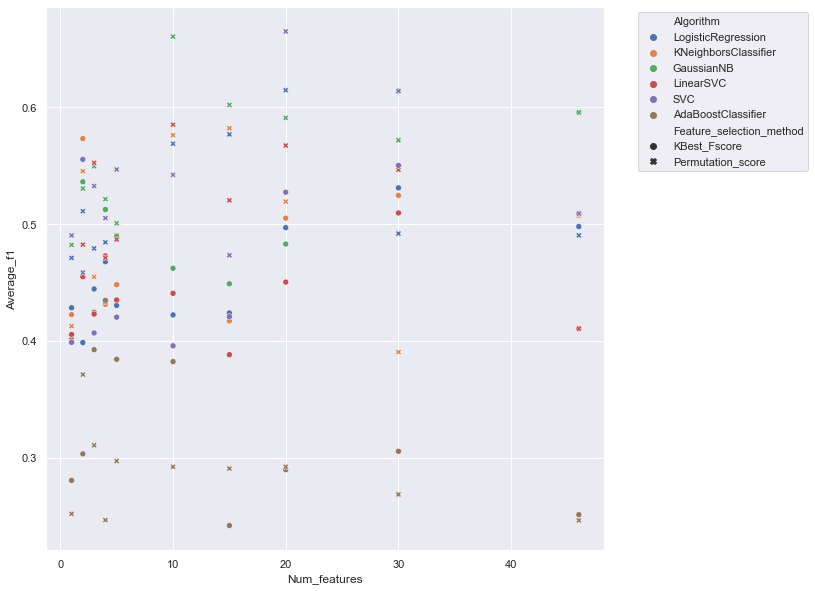

In [41]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, can achieve a similar level of performance to the model trained with all 46 features, with the top 10 features selected by permutation analysis. In contrast, a greater number (the precise number required is influenced by the algorithm type, but in general appears to be round about 20) of "top" features is required when using KBest selection. That more "top" features are required to achieve equivalent performance when using KBest feature selection likely reflects the fact that as described above permutation analysis measures the unique information provided by a feature about the output class, whereas KBest is a univariate method (and hence doesn't take into account correlations between features).

In [42]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 10)
    & (red_feat_score_df['Feature_selection_method'] == 'Permutation_score')
].reset_index(drop=True)

In [43]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,LogisticRegression,no_balancing,Permutation_score,10,0.600000,0.133333,0.600000,0.133333,0.574074,0.130421,0.568889,0.127218
1,KNeighborsClassifier,no_balancing,Permutation_score,10,0.600000,0.113312,0.600000,0.113312,0.596296,0.147870,0.576296,0.108705
2,GaussianNB,no_balancing,Permutation_score,10,0.666667,0.121716,0.666667,0.121716,0.707407,0.160760,0.660741,0.127562
3,LinearSVC,no_balancing,Permutation_score,10,0.622222,0.113312,0.622222,0.113312,0.596296,0.165386,0.585185,0.123772
4,SVC,no_balancing,Permutation_score,10,0.577778,0.083148,0.577778,0.083148,0.566667,0.064788,0.542222,0.060251
5,AdaBoostClassifier,no_balancing,Permutation_score,10,0.333333,0.140546,0.333333,0.140546,0.323333,0.174984,0.292063,0.123606


Many algorithms perform similarly well. Have selected GaussianNB to take forwards since a) it performs best and b) this was also the algorithm that performed best when trained with all features.

In [44]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [45]:
red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [46]:
red_feat_nested_pred = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['predictions']
red_feat_nested_y_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['y_true']
red_feat_nested_x_true = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

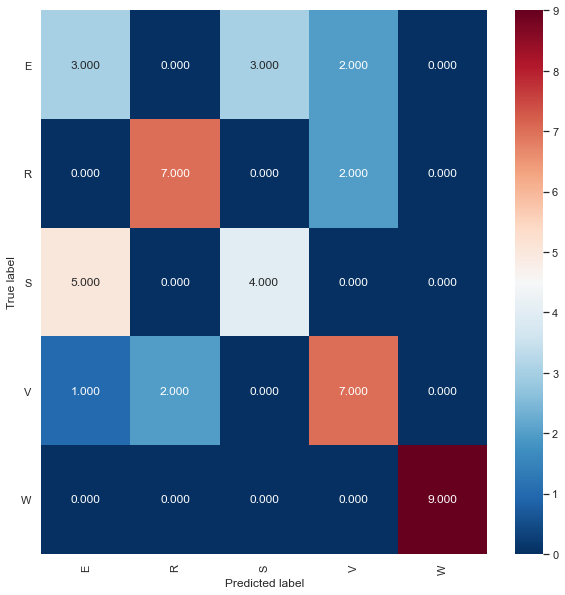

Normalised over true label (rows)


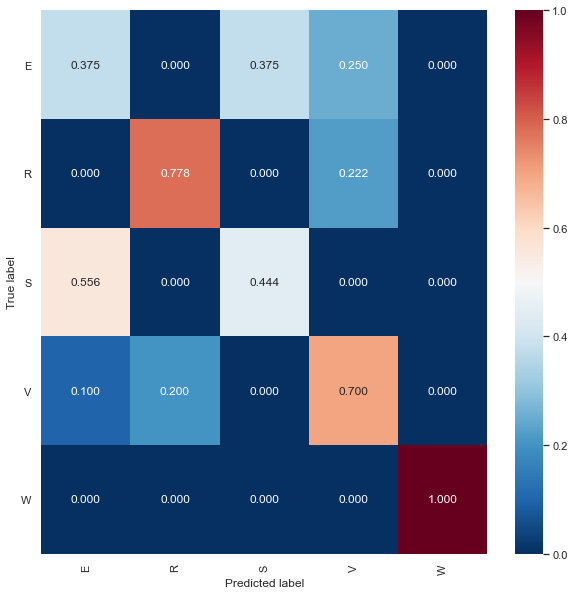

Normalised over pred label (columns)


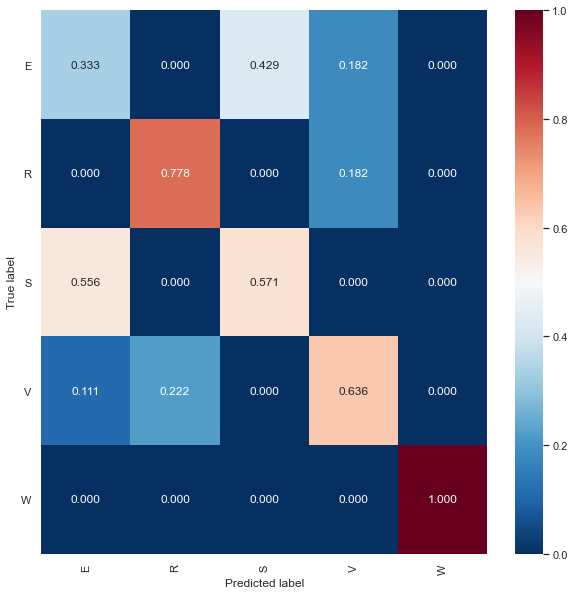

In [47]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [48]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

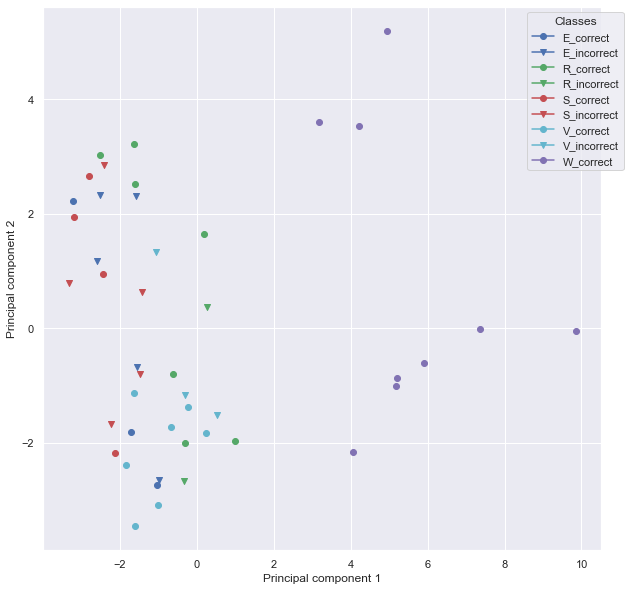

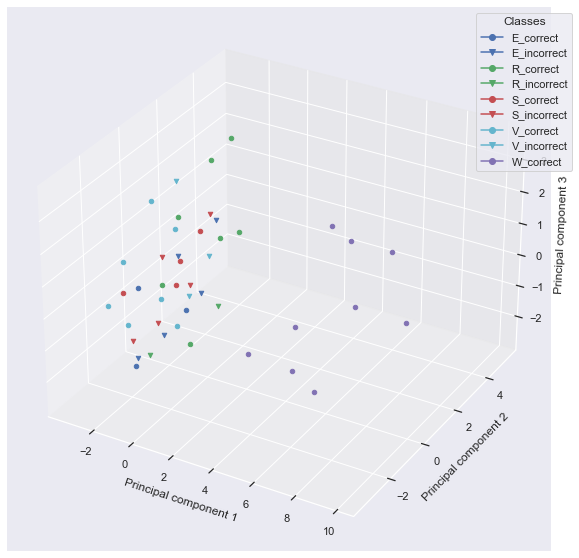

In [49]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

Predictions obtained from this second model are largely similar to those obtained from the first model - again, Trp is identified without error (no false positives or false negatives). In this case it actually does fairly well at identifying Arg (at slight expense to its ability to identify Val), whilst it struggles more with Ser, Arg and Glu.

Is there a significant difference between the two models?

In [51]:
params_1 = all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['GaussianNB__no_balancing__Permutation_score__10']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:10]

print('Model 1:')
print('Algorithm: GaussianNB')
print('Parameters:\n-')
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: GaussianNB')
print('Parameters:\n-')
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=GaussianNB, classifier_2=GaussianNB, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None,
)

Model 1:
Algorithm: GaussianNB
Parameters:
-
Features:
['DPH_CCPent', 'DPH_QLKEIA', 'DPH_CCHex2-I24K', 'DPH_CCHept-I24N', 'DPH_CCHept-L28W', 'DPH_GRP22', 'DPH_CCHex', 'DPH_NLKEIA', 'DPH_CCHept-L28K', 'DPH_CCHept-I24T', 'DPH_CCHept-L7Y', 'DPH_CCHex2', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I17H', 'DPH_CCHept-I24H', 'DPH_CCHept-L28Y', 'DPH_GRP46', 'DPH_CCHept', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17K-L24E', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-I24Y', 'DPH_GRP51', 'DPH_CCHept-I24D', 'DPH_CCHept-L14A', 'DPH_CCHept-L7K', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24Y', 'DPH_GRP52', 'DPH_CCHept-I24E', 'DPH_CCHept-L21A', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-L21Y-I24S', 'DPH_GRP63', 'DPH_CCHept-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-I17T', 'DPH_GRP80', 'DPH_CCHept-I17K', 'DPH_CCPent-I24K', 'DPH_CCHept-I24S', 'DPH_CCHept-L7W', 'DPH_CCHept-I24P']




Model 2:
Algorithm: GaussianNB
Parameters:
-
Features:
['DPH_CCHex2', 'DPH_CCHept

In [52]:
print(F, p)

4.473932632482301 0.055973334602149774


So, there is a substantial difference in performance when the number of features is reduced from 46 to 10; specifically, model performance improves, likely owing to the removal of peptides that only contribute noise. The difference in performance is substantial, but not quite large enough to be considered significant if using a threshold of p = 0.05.